In [2]:
# Import all the necessary modules
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
import itertools
import importlib
import yfinance as yf
import seaborn as sn
from IPython.display import display, HTML
from trend_following_signal import (jupyter_interactive_mode, load_financial_data, get_returns_volatility, calculate_slope, trend_signal, slope_signal, 
                             create_trend_strategy, get_close_prices)
from strategy_performance import calculate_sharpe_ratio, calculate_calmar_ratio, calculate_CAGR, calculate_risk_and_performance_metrics, calculate_compounded_cumulative_returns
import coinbase_utils as cn
import strategy_performance as perf
import trend_following_signal as tf
import position_sizing as size
%matplotlib inline

In [3]:
import importlib
importlib.reload(cn)
importlib.reload(perf)
importlib.reload(tf)
importlib.reload(size)

<module 'position_sizing' from '/Users/adheerchauhan/Documents/git/trend_following/position_sizing.py'>

In [4]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns',None)
tf.apply_jupyter_fullscreen_css()
# jupyter_interactive_mode()

## Helper functions to help pull the data and run the analysis

## Pull the data from Yahoo Finance

We begin by pulling daily data for the specified instrument using the Yahoo finance API. The data available only goes back to late 2017. 

In [16]:
## Specify date range and pull data for specific instrument
start_date = pd.to_datetime('2014-09-17')
end_date = pd.to_datetime('2022-12-31')
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
# ticker = ['TSLA']
data = get_close_prices(start_date, end_date, ticker)

File data found...reading ['BCH-USD', 'ETH-USD', 'USDT-USD', 'XRP-USD', 'BNB-USD', 'BTC-USD'] data


In [18]:
price_or_returns_calc = 'price'
rolling_donchian_window = 20
ticker = 'BTC-USD'
df = load_financial_data(start_date, end_date, ticker='BTC-USD', print_status=False)
df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']

if price_or_returns_calc == 'price':
    # Rolling maximum of returns (upper channel)
    df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = (
        df[f'adjclose'].rolling(window=rolling_donchian_window).max())

    # Rolling minimum of returns (lower channel)
    df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = (
        df[f'adjclose'].rolling(window=rolling_donchian_window).min())

elif price_or_returns_calc == 'returns':
    # Calculate Percent Returns
    df[f'{ticker}_pct_returns'] = df[f'adjclose'].pct_change()

    # Rolling maximum of returns (upper channel)
    df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = df[
        f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).max()

    # Rolling minimum of returns (lower channel)
    df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = df[
        f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).min()

# Middle of the channel (optional, could be just average of upper and lower)
df[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'] = (
        (df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] +
         df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']) / 2)

In [20]:
df.head(50)

,open,high,low,close,adjclose,volume,BTC-USD_20_donchian_upper_band_price,BTC-USD_20_donchian_lower_band_price,BTC-USD_20_donchian_middle_band_price
Date,,,,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,NaN,NaN,NaN
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,NaN,NaN,NaN
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,NaN,NaN,NaN
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,NaN,NaN,NaN
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,NaN,NaN,NaN
2014-09-22,399.100006,406.915985,397.130005,402.152008,402.152008,24127600,NaN,NaN,NaN
2014-09-23,402.092010,441.557007,396.196991,435.790985,435.790985,45099500,NaN,NaN,NaN
2014-09-24,435.751007,436.112000,421.131989,423.204987,423.204987,30627700,NaN,NaN,NaN
2014-09-25,423.156006,423.519989,409.467987,411.574005,411.574005,26814400,NaN,NaN,NaN


In [22]:
df[[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']] = df[[
        f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']].shift(1)

In [24]:
df.head(50)

,open,high,low,close,adjclose,volume,BTC-USD_20_donchian_upper_band_price,BTC-USD_20_donchian_lower_band_price,BTC-USD_20_donchian_middle_band_price
Date,,,,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,NaN,NaN,NaN
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,NaN,NaN,NaN
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,NaN,NaN,NaN
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,NaN,NaN,NaN
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,NaN,NaN,NaN
2014-09-22,399.100006,406.915985,397.130005,402.152008,402.152008,24127600,NaN,NaN,NaN
2014-09-23,402.092010,441.557007,396.196991,435.790985,435.790985,45099500,NaN,NaN,NaN
2014-09-24,435.751007,436.112000,421.131989,423.204987,423.204987,30627700,NaN,NaN,NaN
2014-09-25,423.156006,423.519989,409.467987,411.574005,411.574005,26814400,NaN,NaN,NaN


In [26]:
def calculate_ts_momentum(df, close_px_col, lookback_period, period_name, returns_type='arithmetic'):
    
    if returns_type == 'logarithmic':
        df[f'{close_px_col}_log_returns'] = np.log(df[close_px_col]/df[close_px_col].shift(1))
        df[f'{close_px_col}_{period_name}_momentum'] = df[f'{close_px_col}_log_returns'].rolling(window=lookback_period).sum()
    elif returns_type == 'arithmetic':
        df[f'{close_px_col}_pct_returns'] = df[f'{close_px_col}'].pct_change()
        df[f'{close_px_col}_{period_name}_momentum'] = df[f'{close_px_col}_pct_returns'].rolling(window=lookback_period).sum()
    
    return df

## THIS IS NON-COMPOUNDED RETURNS
def calculate_cumulative_returns(df, close_px_col, returns_type='logarithmic'):
    
    if returns_type == 'logarithmic':
        df[f'{close_px_col}_log_returns'] = np.log(df[close_px_col]/df[close_px_col].shift(1))
        df[f'{close_px_col}_log_cum_returns'] = df[f'{close_px_col}_log_returns'].cumsum()
    elif returns_type == 'arithmetic':
        df[f'{close_px_col}_pct_returns'] = df[f'{close_px_col}'].pct_change()
        df[f'{close_px_col}_pct_cum_returns'] = df[f'{close_px_col}_pct_returns'].cumsum()
    
    return df

In [28]:
def get_long_and_short_term_momentum(df, close_px_col, returns_type, weekend_trading=False):
    
    if weekend_trading:
        trading_lookback_periods = [10, 21, 63, 126, 252]
    else:
        trading_lookback_periods = [10, 30, 90, 180, 365]
        
    lookback_period_names = ['10_day', '1_month', '3_month', '6_month', '12_month']
    
    c = 0
    for lookback in trading_lookback_periods:
        df = calculate_ts_momentum(df, close_px_col, lookback_period=lookback, period_name=lookback_period_names[c], returns_type=returns_type)
        c+=1
    
    return df

In [30]:
def generate_momentum_signal(df, ticker, momentum_type, threshold):#, include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5):
    
    df[f'{ticker}_{momentum_type}_signal'] = np.where(df[f'{ticker}_{momentum_type}'] > threshold, 1,
                                             np.where(df[f'{ticker}_{momentum_type}'] < -threshold, -1, np.nan))
    df[f'{ticker}_{momentum_type}_signal'] = df[f'{ticker}_{momentum_type}_signal'].shift(1)
    
    df[f'{ticker}_daily_returns'] = df[f'{ticker}'].pct_change()
    
#     if include_transaction_costs_and_fees:
#         average_fee_per_trade = estimate_fee_per_trade(passive_trade_rate=passive_trade_rate)
#         df[f'{ticker}_{momentum_type}_strategy_returns'] = (df[f'{ticker}_{momentum_type}_signal'] * df[f'{ticker}_daily_returns'] -
#                                                             (transaction_cost_est + average_fee_per_trade))
#     else:
    df[f'{ticker}_{momentum_type}_strategy_returns'] = df[f'{ticker}_{momentum_type}_signal'] * df[f'{ticker}_daily_returns']
    df[f'{ticker}_{momentum_type}_strategy_trades'] = df[f'{ticker}_{momentum_type}_signal'].diff()
    
    # Calculate cumulative returns
    df[f'{ticker}_{momentum_type}_cum_strategy_returns'] = (1 + df[f'{ticker}_{momentum_type}_strategy_returns']).cumprod() - 1
    df[f'{ticker}_{momentum_type}_cum_buy_and_hold_returns'] = (1 + df[f'{ticker}_daily_returns']).cumprod() - 1
    
    return df

In [32]:
from strategy_performance_metrics import calculate_sharpe_ratio

def rolling_sharpe_ratio(df, window, strategy_daily_return_col, strategy_trade_count_col, **kwargs):
    def sharpe_on_window(window_df):
        # Calculate the Sharpe ratio on the windowed data frame
        if window_df[strategy_trade_count_col].sum() == 0 or window_df[strategy_daily_return_col].std() == 0:
            return 0  # Return 0 Sharpe ratio if there are no trades or no variation in returns
        else:
            return calculate_sharpe_ratio(window_df, strategy_daily_return_col, strategy_trade_count_col, **kwargs)

    # Apply the function over a rolling window and return as a Series (not a full DataFrame)
    rolling_sharpe = df[strategy_daily_return_col].rolling(window=window).apply(
        lambda x: sharpe_on_window(df.loc[x.index]), raw=False
    )
    
    return rolling_sharpe

In [34]:
ticker_list = ['ETH-USD','XRP-USD','SOL-USD','BCH-USD','BTC-USD',]
momentum_strategy_list = ['10_day_momentum','1_month_momentum','3_month_momentum','6_month_momentum','12_month_momentum','12_month_minus_1_month_momentum']
threshold_list = [0.2] * len(momentum_strategy_list)
performance_columns = ['annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
final_perf_stats = []
for ticker in ticker_list:
    print(ticker)
    df_temp_results = pd.DataFrame(columns=performance_columns)
    for i in np.arange(len(momentum_strategy_list)):
        data = get_close_prices(start_date, end_date, ticker)
        data = get_long_and_short_term_momentum(data, close_px_col=ticker, returns_type='logarithmic', weekend_trading=True)
        data[f'{ticker}_12_month_minus_1_month_momentum'] = data[f'{ticker}_12_month_momentum'] - data[f'{ticker}_1_month_momentum']
        data = generate_momentum_signal(data, ticker=ticker, momentum_type=momentum_strategy_list[i], threshold=threshold_list[i])
        data = data.dropna()
        metrics = calculate_risk_and_performance_metrics(data, strategy_daily_return_col=f'{ticker}_{momentum_strategy_list[i]}_strategy_returns',
                                                         strategy_trade_count_col=f'{ticker}_{momentum_strategy_list[i]}_strategy_trades', annual_trading_days=365,
                                                         include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.005)
        df_temp_results.loc[f'{ticker}_{momentum_strategy_list[i]}_strategy_returns'] = metrics
    
    final_perf_stats.append(df_temp_results)

df_final = pd.concat(final_perf_stats, axis=0)

ETH-USD
File data found...reading ['ETH-USD'] data
File data found...reading ['ETH-USD'] data
File data found...reading ['ETH-USD'] data
File data found...reading ['ETH-USD'] data
File data found...reading ['ETH-USD'] data
File data found...reading ['ETH-USD'] data
XRP-USD
File data found...reading ['XRP-USD'] data
File data found...reading ['XRP-USD'] data
File data found...reading ['XRP-USD'] data
File data found...reading ['XRP-USD'] data
File data found...reading ['XRP-USD'] data
File data found...reading ['XRP-USD'] data
SOL-USD
File data found...reading ['SOL-USD'] data
File data found...reading ['SOL-USD'] data
File data found...reading ['SOL-USD'] data
File data found...reading ['SOL-USD'] data
File data found...reading ['SOL-USD'] data
File data found...reading ['SOL-USD'] data
BCH-USD
File data found...reading ['BCH-USD'] data
File data found...reading ['BCH-USD'] data
File data found...reading ['BCH-USD'] data
File data found...reading ['BCH-USD'] data
File data found...read

In [35]:
df_final

,annualized_return,annualized_sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count
ETH-USD_10_day_momentum_strategy_returns,1.067393,1.171801,0.979170,1.163047,-1.090099,544 days,0.525822,0.927201,0.354876,0.0
ETH-USD_1_month_momentum_strategy_returns,0.141365,0.627296,0.125861,1.118262,-1.123188,728 days,0.501908,0.803888,0.421827,2.0
ETH-USD_3_month_momentum_strategy_returns,-0.065447,0.410598,-0.057379,1.013460,-1.140611,1284 days,0.526616,0.778810,0.436267,2.0
ETH-USD_6_month_momentum_strategy_returns,1.078662,1.197342,0.516103,0.922399,-2.090012,743 days,0.543495,2.358587,0.018492,2.0
ETH-USD_12_month_momentum_strategy_returns,0.285693,0.691160,0.180026,0.964751,-1.586957,1048 days,0.525660,1.433871,0.151838,0.0
ETH-USD_12_month_minus_1_month_momentum_strategy_returns,0.006172,0.425016,0.002107,0.932368,-2.928503,1478 days,0.523490,0.914964,0.360375,0.0
XRP-USD_10_day_momentum_strategy_returns,-0.914566,-0.674024,-0.229968,1.661868,-3.976928,1556 days,0.453608,-0.469989,0.638894,0.0
XRP-USD_1_month_momentum_strategy_returns,-0.127602,0.636305,-0.026916,1.569908,-4.740722,1208 days,0.480186,0.723534,0.469747,0.0
XRP-USD_3_month_momentum_strategy_returns,-0.810118,-0.722051,-0.331815,1.235109,-2.441480,1600 days,0.482301,-1.074162,0.283037,0.0
XRP-USD_6_month_momentum_strategy_returns,-0.652466,-0.398115,-0.170330,1.131322,-3.830597,1548 days,0.505462,-0.589629,0.555572,0.0


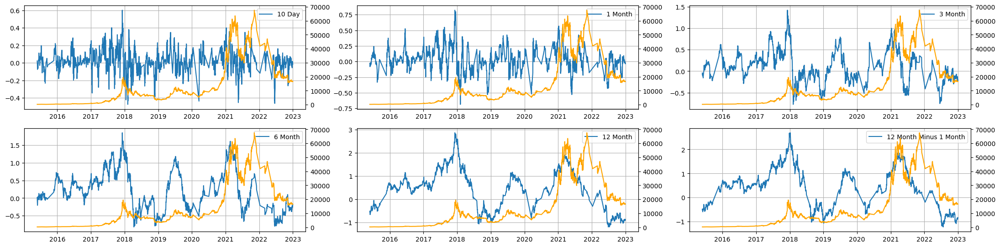

In [38]:
ticker = 'BTC-USD'
fig = plt.figure(figsize=(22,8))
# plt.style.use('bmh')
layout = (3,3)
momentum_ax_1 = plt.subplot2grid(layout, (0,0))#, colspan=2)
momentum_ax_2 = plt.subplot2grid(layout, (0,1))#, colspan=2)
momentum_ax_3 = plt.subplot2grid(layout, (0,2))#, colspan=2)
momentum_ax_4 = plt.subplot2grid(layout, (1,0))#, colspan=2)
momentum_ax_5 = plt.subplot2grid(layout, (1,1))#, colspan=2)
momentum_ax_6 = plt.subplot2grid(layout, (1,2))#, colspan=2)
# pnl_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)

momentum_twin_ax_1 = momentum_ax_1.twinx()
_ = momentum_ax_1.plot(data.index, data[f'{ticker}_10_day_momentum'], label='10 Day')
_ = momentum_twin_ax_1.plot(data.index, data[ticker], label='Price', color='orange')

momentum_twin_ax_2 = momentum_ax_2.twinx()
_ = momentum_ax_2.plot(data.index, data[f'{ticker}_1_month_momentum'], label='1 Month')
_ = momentum_twin_ax_2.plot(data.index, data[ticker], label='Price', color='orange')

momentum_twin_ax_3 = momentum_ax_3.twinx()
_ = momentum_ax_3.plot(data.index, data[f'{ticker}_3_month_momentum'], label='3 Month')
_ = momentum_twin_ax_3.plot(data.index, data[ticker], label='Price', color='orange')

momentum_twin_ax_4 = momentum_ax_4.twinx()
_ = momentum_ax_4.plot(data.index, data[f'{ticker}_6_month_momentum'], label='6 Month')
_ = momentum_twin_ax_4.plot(data.index, data[ticker], label='Price', color='orange')

momentum_twin_ax_5 = momentum_ax_5.twinx()
_ = momentum_ax_5.plot(data.index, data[f'{ticker}_12_month_momentum'], label='12 Month')
_ = momentum_twin_ax_5.plot(data.index, data[ticker], label='Price', color='orange')

momentum_twin_ax_6 = momentum_ax_6.twinx()
_ = momentum_ax_6.plot(data.index, data[f'{ticker}_12_month_minus_1_month_momentum'], label='12 Month Minus 1 Month')
_ = momentum_twin_ax_6.plot(data.index, data[ticker], label='Price', color='orange')

_ = momentum_ax_1.grid()
_ = momentum_ax_1.legend()
_ = momentum_ax_2.grid()
_ = momentum_ax_2.legend()
_ = momentum_ax_3.grid()
_ = momentum_ax_3.legend()
_ = momentum_ax_4.grid()
_ = momentum_ax_4.legend()
_ = momentum_ax_5.grid()
_ = momentum_ax_5.legend()
_ = momentum_ax_6.grid()
_ = momentum_ax_6.legend()

plt.tight_layout()

## Trend Signal Performance

In [68]:
from strategy_performance import calculate_risk_and_performance_metrics

import seaborn as sns

def plot_moving_avg_crossover_performance(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

def moving_avg_crossover_strategy_performance(start_date, end_date, ticker, moving_avg_type='exponential', price_or_returns_calc='returns'):
    
    perf_cols = ['ticker', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    fast_mavg_list = np.arange(10, 101, 10)
    slow_mavg_list = np.arange(50, 501, 50)
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for stepsize in mavg_stepsize_list:
                if fast_mavg <= slow_mavg/2:
                    # df = get_close_prices(start_date, end_date, ticker, print_status=False)
                    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                                        end_date=end_date, save_to_file=False)
                    df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
                    df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
                    df = (tf.create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                                price_or_returns_calc=price_or_returns_calc)
                          .rename(columns={'BTC-USD_trend_strategy_returns': f'BTC-USD_trend_strategy_returns_{fast_mavg}_{stepsize}_{slow_mavg}',
                                           'BTC-USD_trend_strategy_trades': f'BTC-USD_trend_strategy_trades_{fast_mavg}_{stepsize}_{slow_mavg}'}))
                    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'BTC-USD_trend_strategy_returns_{fast_mavg}_{stepsize}_{slow_mavg}',
                                                                                strategy_trade_count_col=f'BTC-USD_trend_strategy_trades_{fast_mavg}_{stepsize}_{slow_mavg}',
                                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
                    row = {
                        'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio']
                    }
                    df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)
    
    return df_performance

In [70]:
ticker = 'BTC-USD'
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2022-12-31').date()
df_performance_returns = moving_avg_crossover_strategy_performance(in_sample_start_date, in_sample_end_date, ticker, moving_avg_type='exponential', price_or_returns_calc='returns')

In [71]:
df_performance_returns.shape

(336, 7)

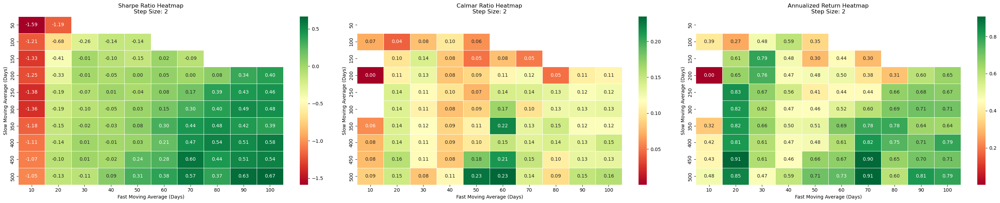

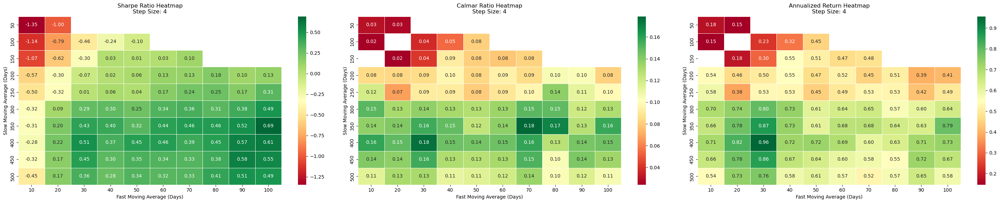

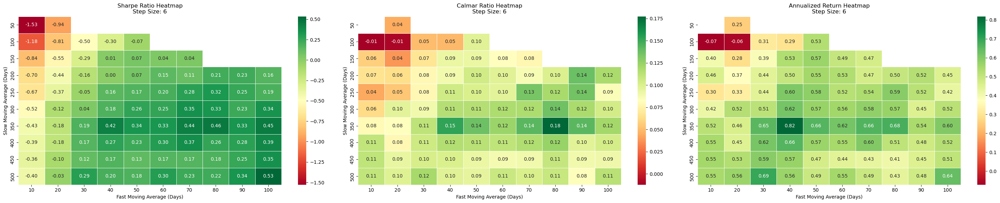

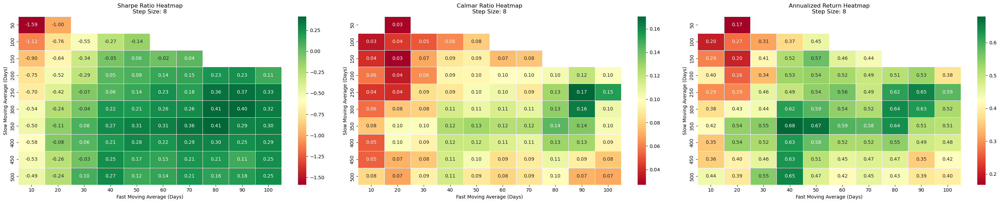

In [72]:
plot_moving_avg_crossover_performance(df_performance_returns)

In [73]:
ticker = 'BTC-USD'
df_performance_price = moving_avg_crossover_strategy_performance(start_date, end_date, ticker, moving_avg_type='exponential', price_or_returns_calc='price')

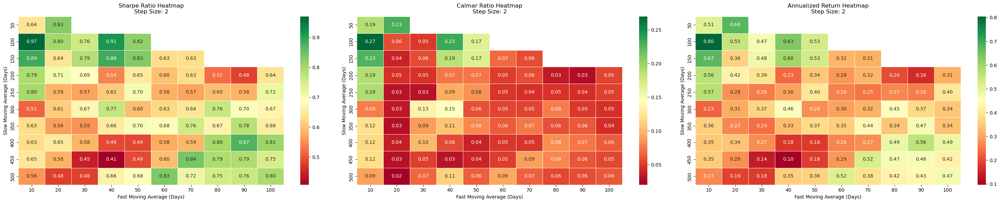

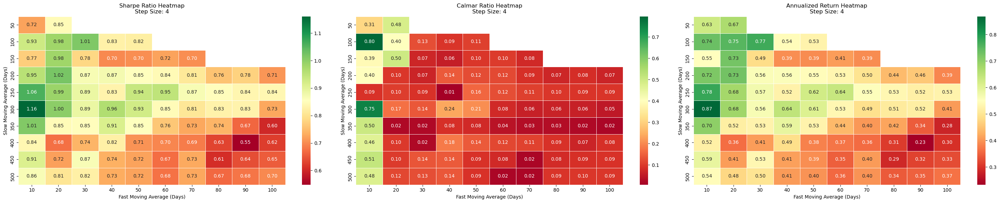

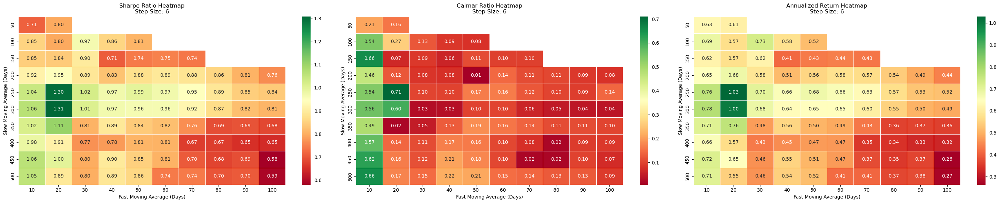

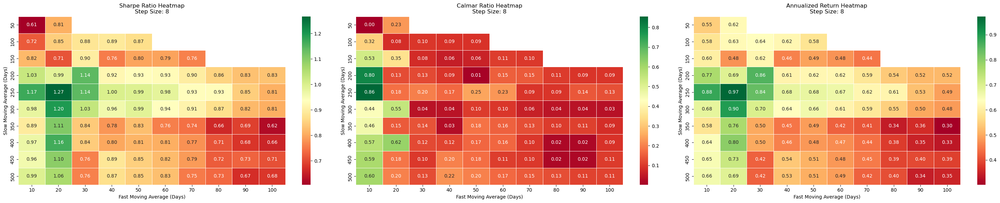

In [74]:
plot_moving_avg_crossover_performance(df_performance_price)

## Keltner Channels

In [54]:
def calculate_keltner_channels(start_date, end_date, ticker, price_or_returns_calc='price', rolling_atr_window=20, upper_atr_multiplier=2, lower_atr_multiplier=2):
    
    df = load_financial_data(start_date, end_date, ticker, print_status=False)#.shift(1)
    df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']
    
    if price_or_returns_calc == 'price':
        # Calculate the Exponential Moving Average (EMA)
        df[f'{ticker}_{rolling_atr_window}_ema_price'] = df['adjclose'].ewm(span=rolling_atr_window, adjust=False).mean()

        # Calculate the True Range (TR) and Average True Range (ATR)
        df[f'{ticker}_high-low'] = df['high'] - df['low']
        df[f'{ticker}_high-close'] = np.abs(df['high'] - df['adjclose'].shift(1))
        df[f'{ticker}_low-close'] = np.abs(df['low'] - df['adjclose'].shift(1))
        df[f'{ticker}_true_range_price'] = df[[f'{ticker}_high-low', f'{ticker}_high-close', f'{ticker}_low-close']].max(axis=1)
        df[f'{ticker}_{rolling_atr_window}_avg_true_range_price'] = df[f'{ticker}_true_range_price'].ewm(span=rolling_atr_window, adjust=False).mean()

    elif price_or_returns_calc == 'returns':
        # Calculate Percent Returns
        df[f'{ticker}_pct_returns'] = df[f'adjclose'].pct_change()
        
        # Calculate Middle Line as the EMA of returns
        df[f'{ticker}_{rolling_atr_window}_ema_returns'] = df[f'{ticker}_pct_returns'].ewm(span=rolling_atr_window, adjust=False).mean()

        # Calculate True Range based on absolute returns
        df[f'{ticker}_true_range_returns'] = df[f'{ticker}_{rolling_atr_window}_ema_returns'].abs()

        # Calculate ATR using the EMA of the True Range
        df[f'{ticker}_{rolling_atr_window}_avg_true_range_returns'] = df[f'{ticker}_true_range_returns'].ewm(span=rolling_atr_window, adjust=False).mean()

    # Calculate the Upper, Lower and Middle Bands
    df[f'{ticker}_{rolling_atr_window}_atr_middle_band_{price_or_returns_calc}'] = df[f'{ticker}_{rolling_atr_window}_ema_{price_or_returns_calc}']
    df[f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}'] = (df[f'{ticker}_{rolling_atr_window}_ema_{price_or_returns_calc}'] +
                                                                                   upper_atr_multiplier * df[f'{ticker}_{rolling_atr_window}_avg_true_range_{price_or_returns_calc}'])
    df[f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}'] = (df[f'{ticker}_{rolling_atr_window}_ema_{price_or_returns_calc}'] -
                                                                                   lower_atr_multiplier * df[f'{ticker}_{rolling_atr_window}_avg_true_range_{price_or_returns_calc}'])

     # Shift only the Keltner channel metrics to avoid look-ahead bias
    df[[f'{ticker}_{rolling_atr_window}_atr_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}']] = df[[
        f'{ticker}_{rolling_atr_window}_atr_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}']].shift(1)
        
    return df

# Generate signals based on price vs Keltner Channel
def generate_keltner_signals(start_date, end_date, ticker, price_or_returns_calc='price', rolling_atr_window=20, upper_atr_multiplier=2, lower_atr_multiplier=2):
    
    if price_or_returns_calc == 'price':
        df = calculate_keltner_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc, rolling_atr_window=rolling_atr_window,
                                        upper_atr_multiplier=upper_atr_multiplier, lower_atr_multiplier=lower_atr_multiplier)

        # Calculate Ticker Returns
        df[f'{ticker}_pct_returns'] = df[f'adjclose'].pct_change()

        # Buy signal: Price crosses above upper band
        df[f'{ticker}_{rolling_atr_window}_keltner_signal'] = np.where((df[f'adjclose'] > df[f'{ticker}_{rolling_atr_window}_atr_upper_band_price']), 1,
                                                                       np.where((df[f'adjclose'] < df[f'{ticker}_{rolling_atr_window}_atr_lower_band_price']), -1, 0))
    elif price_or_returns_calc == 'returns':
        df = calculate_keltner_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc, rolling_atr_window=rolling_atr_window,
                                        upper_atr_multiplier=upper_atr_multiplier, lower_atr_multiplier=lower_atr_multiplier)
        df[f'{ticker}_{rolling_atr_window}_keltner_signal'] = np.where((df[f'{ticker}_pct_returns'] > df[f'{ticker}_{rolling_atr_window}_atr_upper_band_returns']), 1,
                                                                       np.where((df[f'{ticker}_pct_returns'] < df[f'{ticker}_{rolling_atr_window}_atr_lower_band_returns']), -1, 0))
        
    
    # Strategy Returns
    df[f'{ticker}_{rolling_atr_window}_keltner_strategy_returns'] = df[f'{ticker}_pct_returns'] * df[f'{ticker}_{rolling_atr_window}_keltner_signal']
    df[f'{ticker}_{rolling_atr_window}_keltner_strategy_trades'] = df[f'{ticker}_{rolling_atr_window}_keltner_signal'].diff()

    return df    

In [56]:
df_keltner_signal_price = generate_keltner_signals(start_date, end_date, ticker, price_or_returns_calc='price')
df_keltner_signal_returns = generate_keltner_signals(start_date, end_date, ticker, price_or_returns_calc='returns')

In [58]:
keltner_performance_cols = ['ticker','rolling_atr_window','upper_multiplier','lower_multiplier','annualized_return','annualized_sharpe_ratio',
                            'calmar_ratio','max_drawdown','max_drawdown_duration','trade_count']
df_performance = pd.DataFrame(columns=keltner_performance_cols)
for window in np.arange(20, 60, 5):
    for multiplier in np.arange(1, 6, 1):
        df_keltner_signal_price = generate_keltner_signals(start_date, end_date, ticker, price_or_returns_calc='price', rolling_atr_window=window,
                                                           upper_atr_multiplier=multiplier, lower_atr_multiplier=multiplier)
        performance_metrics = calculate_risk_and_performance_metrics(df_keltner_signal_price, strategy_daily_return_col=f'{ticker}_{window}_keltner_strategy_returns',
                                                                     strategy_trade_count_col=f'{ticker}_{window}_keltner_strategy_trades', passive_trade_rate=0.05)
        row = {'ticker': ticker,
               'rolling_atr_window': window,
               'upper_multiplier': multiplier,
               'lower_multiplier': multiplier,
               'annualized_return': performance_metrics['annualized_return'],
               'annualized_sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
               'calmar_ratio': performance_metrics['calmar_ratio'],
               'max_drawdown': performance_metrics['max_drawdown'],
               'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
               'trade_count': performance_metrics['trade_count']
              }
        df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)

In [60]:
df_performance.sort_values('annualized_sharpe_ratio', ascending=False)

,ticker,rolling_atr_window,upper_multiplier,lower_multiplier,annualized_return,annualized_sharpe_ratio,calmar_ratio,max_drawdown,max_drawdown_duration,trade_count
0,BTC-USD,20,1,1,8.737854,3.600269,23.699839,-0.368688,84 days,569.0
5,BTC-USD,25,1,1,7.167259,3.320906,15.569917,-0.460327,85 days,503.0
1,BTC-USD,20,2,2,4.484197,3.234804,14.105540,-0.317903,86 days,396.0
6,BTC-USD,25,2,2,4.230190,3.085107,12.474269,-0.339113,176 days,384.0
10,BTC-USD,30,1,1,5.903424,3.025364,12.785014,-0.461746,84 days,457.0
11,BTC-USD,30,2,2,4.215471,2.952088,9.628861,-0.437795,215 days,396.0
15,BTC-USD,35,1,1,5.281429,2.878707,9.924447,-0.532164,136 days,423.0
7,BTC-USD,25,3,3,2.470216,2.810764,6.918367,-0.357052,176 days,270.0
16,BTC-USD,35,2,2,3.963160,2.783208,9.233187,-0.429230,178 days,390.0
20,BTC-USD,40,1,1,4.670661,2.712099,8.309743,-0.562070,171 days,389.0


In [64]:
ticker = 'BTC-USD'
rolling_atr_window = 20
upper_atr_multiplier = 2
lower_atr_multiplier = 2
df_keltner_signal_price = generate_keltner_signals(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc='price', rolling_atr_window=rolling_atr_window,
                                                   upper_atr_multiplier=upper_atr_multiplier, lower_atr_multiplier=lower_atr_multiplier)
calculate_risk_and_performance_metrics(df_keltner_signal_price, strategy_daily_return_col=f'{ticker}_{rolling_atr_window}_keltner_strategy_returns',
                                      strategy_trade_count_col=f'{ticker}_{rolling_atr_window}_keltner_strategy_trades', passive_trade_rate=0.05)

{'annualized_return': 4.484196863678017,
 'annualized_sharpe_ratio': 3.234804416897257,
 'calmar_ratio': 14.105539855267294,
 'annualized_std_dev': 0.4098224700743626,
 'max_drawdown': -0.31790324295907946,
 'max_drawdown_duration': Timedelta('86 days 00:00:00'),
 'hit_rate': 0.21003963011889035,
 't_statistic': 11.623750527586063,
 'p_value': 1.3794540972247911e-30,
 'trade_count': 396.0}

In [66]:
df_keltner_signal_price.tail()

,open,high,low,close,adjclose,volume,BTC-USD_20_ema_price,BTC-USD_high-low,BTC-USD_high-close,BTC-USD_low-close,BTC-USD_true_range_price,BTC-USD_20_avg_true_range_price,BTC-USD_20_atr_middle_band_price,BTC-USD_20_atr_upper_band_price,BTC-USD_20_atr_lower_band_price,BTC-USD_pct_returns,BTC-USD_20_keltner_signal,BTC-USD_20_keltner_strategy_returns,BTC-USD_20_keltner_strategy_trades,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-12-27,16919.291016,16959.845703,16642.072266,16717.173828,16717.173828,15748580239,16914.970677,317.773438,40.041016,277.732422,317.773438,294.893671,16935.791398,17520.761947,16350.820848,-0.011976,0,-0.0,0.0,5.496144e+06,5.687063e+06,-190918.95883,-0.033571,2022-12-27,443,52 days,False
2022-12-28,16716.400391,16768.169922,16497.556641,16552.572266,16552.572266,17005713920,16880.456542,270.613281,50.996094,219.617188,270.613281,292.581253,16914.970677,17504.758019,16325.183334,-0.009846,0,-0.0,0.0,5.496144e+06,5.687063e+06,-190918.95883,-0.033571,2022-12-28,443,52 days,False
2022-12-29,16552.322266,16651.755859,16508.683594,16642.341797,16642.341797,14472237479,16857.778948,143.072266,99.183594,43.888672,143.072266,278.342302,16880.456542,17465.619049,16295.294036,0.005423,0,0.0,0.0,5.496144e+06,5.687063e+06,-190918.95883,-0.033571,2022-12-29,443,52 days,False
2022-12-30,16641.330078,16643.427734,16408.474609,16602.585938,16602.585938,15929162910,16833.474851,234.953125,1.085938,233.867188,234.953125,274.209999,16857.778948,17414.463552,16301.094344,-0.002389,0,-0.0,0.0,5.496144e+06,5.687063e+06,-190918.95883,-0.033571,2022-12-30,443,52 days,False
2022-12-31,16603.673828,16628.986328,16517.519531,16547.496094,16547.496094,11239186456,16806.238779,111.466797,26.400391,85.066406,111.466797,258.710647,16833.474851,17381.894850,16285.054853,-0.003318,0,-0.0,0.0,5.496144e+06,5.687063e+06,-190918.95883,-0.033571,2022-12-31,443,52 days,False


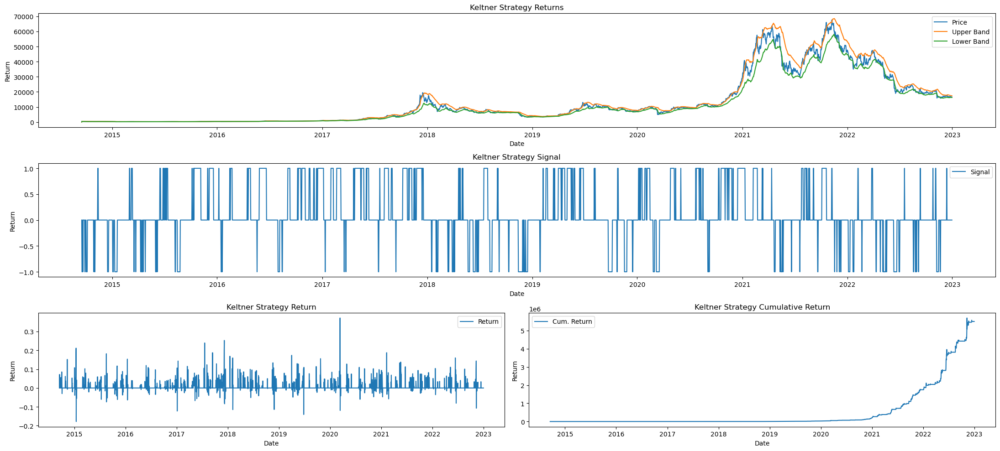

In [68]:
fig = plt.figure(figsize=(22,10))
# plt.style.use('bmh')
layout = (3,2)
keltner_ax = plt.subplot2grid(layout, (0,0), colspan=2)
keltner_signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
keltner_return_ax = plt.subplot2grid(layout, (2,0))#, colspan=2)
keltner_cum_return_ax = plt.subplot2grid(layout, (2,1))#, colspan=2)
# keltner_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

_ = keltner_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price['adjclose'], label='Price')
# _ = keltner_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
_ = keltner_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price[f'BTC-USD_{rolling_atr_window}_atr_upper_band_price'], label='Upper Band')
_ = keltner_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price[f'BTC-USD_{rolling_atr_window}_atr_lower_band_price'], label='Lower Band')
_ = keltner_ax.set_title(f'Keltner Strategy Returns')
_ = keltner_ax.set_ylabel('Return')
_ = keltner_ax.set_xlabel('Date')
_ = keltner_ax.legend()

_ = keltner_signal_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price[f'BTC-USD_{rolling_atr_window}_keltner_signal'], label='Signal')
# _ = keltner_signal_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = keltner_signal_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = keltner_signal_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = keltner_signal_ax.set_title(f'Keltner Strategy Signal')
_ = keltner_signal_ax.set_ylabel('Return')
_ = keltner_signal_ax.set_xlabel('Date')
_ = keltner_signal_ax.legend()

_ = keltner_return_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price[f'BTC-USD_{rolling_atr_window}_keltner_strategy_returns'], label='Return')
_ = keltner_return_ax.set_title(f'Keltner Strategy Return')
_ = keltner_return_ax.set_ylabel('Return')
_ = keltner_return_ax.set_xlabel('Date')
_ = keltner_return_ax.legend()

_ = keltner_cum_return_ax.plot(df_keltner_signal_price.index, df_keltner_signal_price['strategy_cumulative_return'], label='Cum. Return')
_ = keltner_cum_return_ax.set_title(f'Keltner Strategy Cumulative Return')
_ = keltner_cum_return_ax.set_ylabel('Return')
_ = keltner_cum_return_ax.set_xlabel('Date')
_ = keltner_cum_return_ax.legend()


plt.tight_layout()

## Moving Average and Keltner Channels Signals

In [73]:
from strategy_performance_metrics import calculate_risk_and_performance_metrics

import seaborn as sns

def plot_moving_avg_crossover_performance(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

def generate_trend_signal_with_keltner_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns',
                                               rolling_atr_window=20, upper_atr_multiplier=2, lower_atr_multiplier=2, include_signal_strength=True):
    
    # Generate Trend Signal
    df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                                 f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))
    # Generate Keltner Signal
    df_keltner = calculate_keltner_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                            rolling_atr_window=rolling_atr_window, upper_atr_multiplier=upper_atr_multiplier, lower_atr_multiplier=lower_atr_multiplier)
    ## THIS NEEDS TO BE SHIFTED TO CALCULATE THE CHANNELS ON T-2
    df_keltner[f'{ticker}_{rolling_atr_window}_keltner_signal'] = np.where((df_keltner[f'adjclose'] > df_keltner[f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}']), 1,
                                                                           np.where((df_keltner[f'adjclose'] <
                                                                                     df_keltner[f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}']), -1, 0))

    # Merging the Trend and Keltner Dataframes
    keltner_cols = [f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}',
                    f'{ticker}_{rolling_atr_window}_atr_middle_band_{price_or_returns_calc}', f'{ticker}_{rolling_atr_window}_keltner_signal']
    df_trend = pd.merge(df_trend, df_keltner[keltner_cols], left_index=True, right_index=True, how='left')
    
    if include_signal_strength:
        # Calculate the strength of moving average crossover and keltner signal
        df_trend[f'{ticker}_keltner_band_width_{price_or_returns_calc}'] = (df_trend[f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}'] -
                                                                            df_trend[f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}'])
        keltner_strength = (np.abs(df_trend[f'{ticker}'] - df_trend[f'{ticker}_{rolling_atr_window}_atr_middle_band_{price_or_returns_calc}']) /
                            df_trend[f'{ticker}_keltner_band_width_{price_or_returns_calc}'])
        crossover_strength = np.abs(df_trend[f'{ticker}_{fast_mavg}_mavg'] - df_trend[f'{ticker}_{slow_mavg}_mavg']) / df_trend[f'{ticker}']

        df_trend[f'{ticker}_crossover_keltner_signal_strength'] = (keltner_strength + crossover_strength) / 2
        strength_threshold = 0.5
    
        # Moving Average and Keltner Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_atr_window}_keltner_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1) &
                      (df_trend[f'{ticker}_crossover_keltner_signal_strength'] > strength_threshold))
        sell_signal = ((df_trend[f'{ticker}_{rolling_atr_window}_keltner_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1) &
                      ((df_trend[f'{ticker}_crossover_keltner_signal_strength'] > strength_threshold)))
    else:
        # Moving Average and Keltner Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_atr_window}_keltner_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1))
        sell_signal = ((df_trend[f'{ticker}_{rolling_atr_window}_keltner_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1))
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal'] = (
        np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal')] * 
        df_trend[f'{ticker}_pct_returns'])
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal')].diff())
    
    return df_trend

def moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, moving_avg_type='exponential', price_or_returns_calc='returns',
                                                           rolling_atr_window=20, upper_atr_multiplier=2, lower_atr_multiplier=2, include_signal_strength=True):
    
    perf_cols = ['ticker', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    fast_mavg_list = np.arange(10, 101, 10)
    slow_mavg_list = np.arange(50, 501, 50)
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for mavg_stepsize in mavg_stepsize_list:
                if fast_mavg < slow_mavg:
                    df_trend = generate_trend_signal_with_keltner_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type, price_or_returns_calc,
                                                                         rolling_atr_window, upper_atr_multiplier, lower_atr_multiplier, include_signal_strength)
                    performance_metrics = calculate_risk_and_performance_metrics(
                        df_trend, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns',
                        strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades', passive_trade_rate=0.05)
                    row = {
                        'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': mavg_stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio']
                    }
                    df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)
    
    plot_moving_avg_crossover_performance(df_performance)
    
    return df_performance

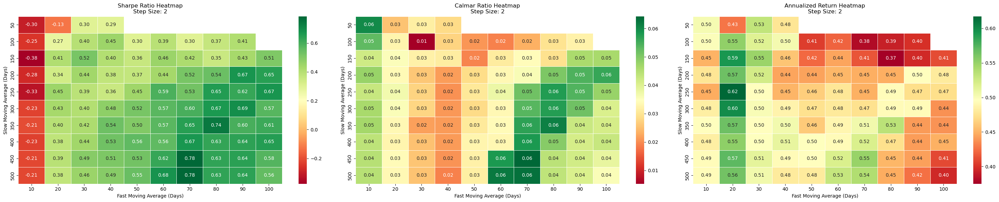

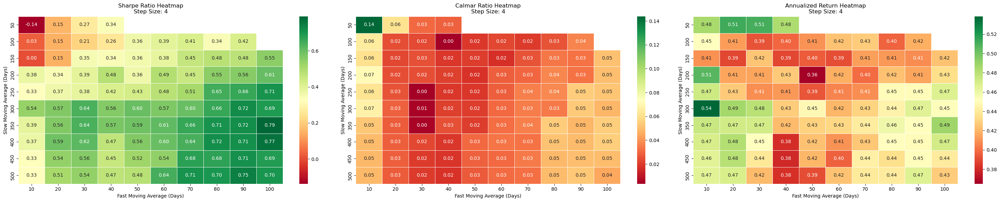

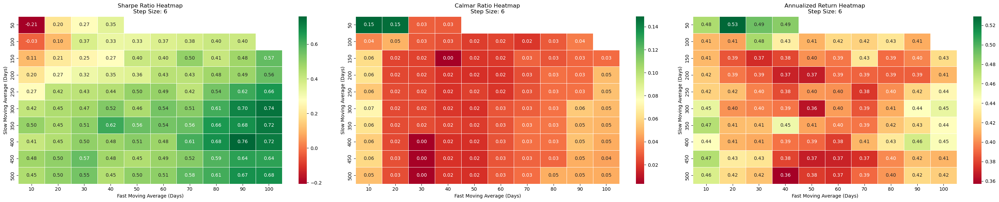

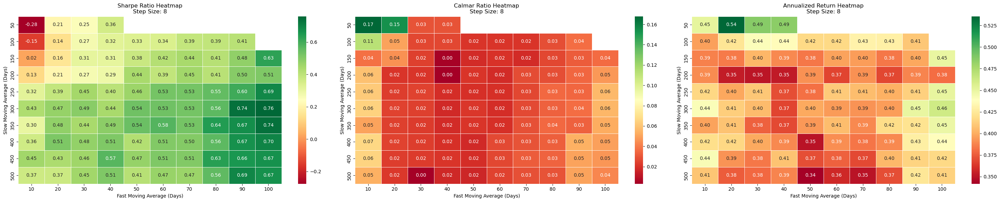

In [75]:
## Returns without Signal Strength Signal and 20-2-2 Keltner Channel
df_result_returns_strength_False = moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, price_or_returns_calc='returns', include_signal_strength=False)

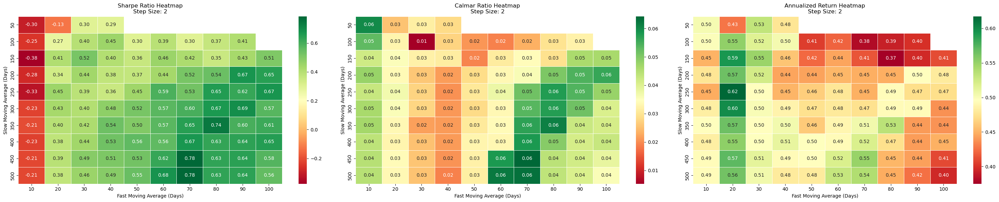

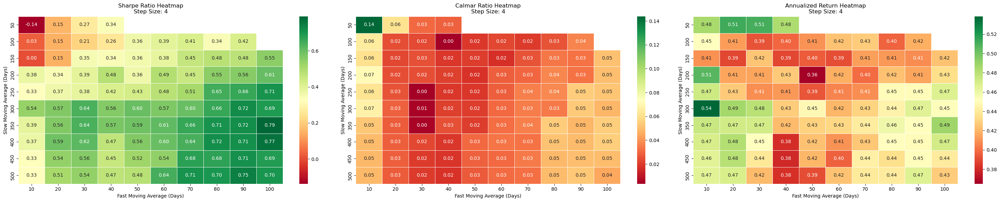

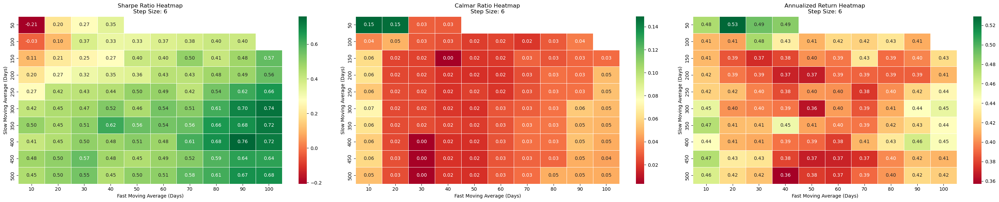

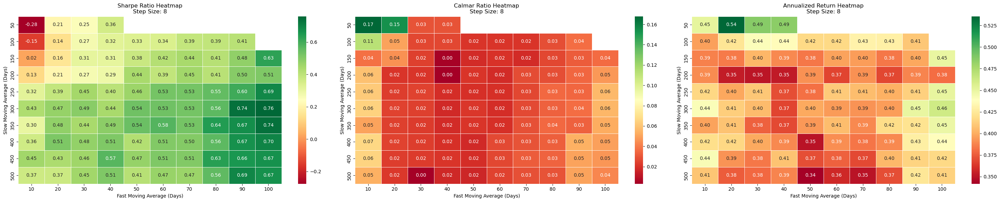

In [76]:
## Returns with Signal Strength Signal and 20-2-2 Keltner Channel
df_result_returns_strength_True = moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, price_or_returns_calc='returns', include_signal_strength=True)

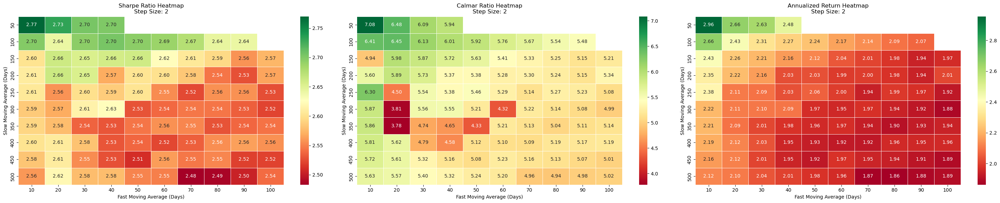

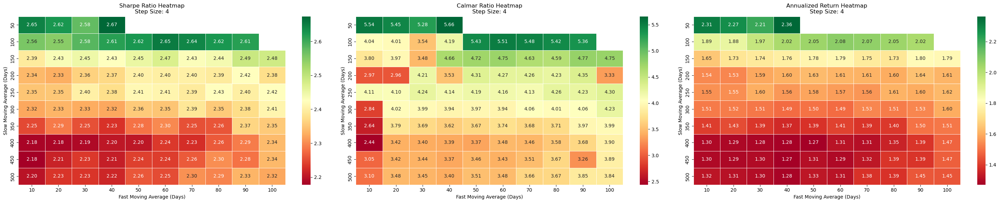

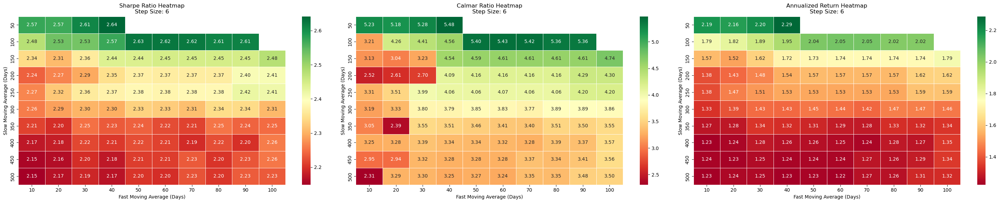

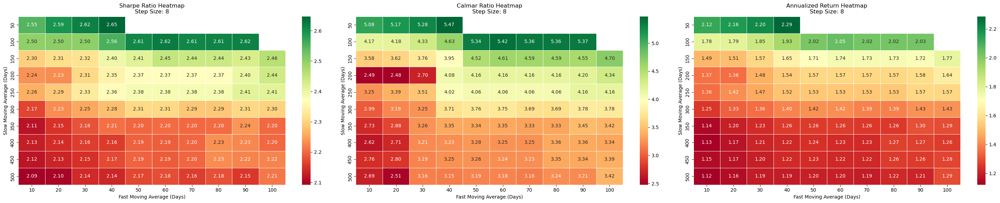

In [77]:
## Price without Signal Strength Signal and 20-2-2 Keltner Channel
df_result_price_strength_False = moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, price_or_returns_calc='price', include_signal_strength=False)

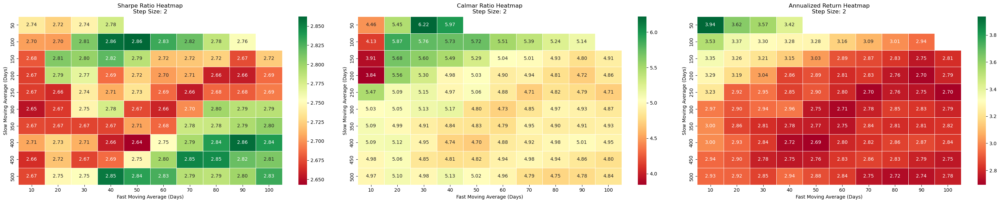

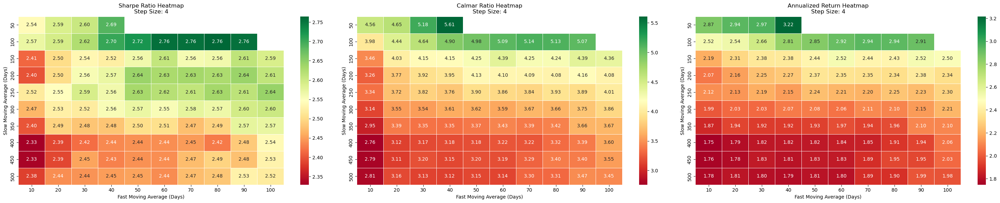

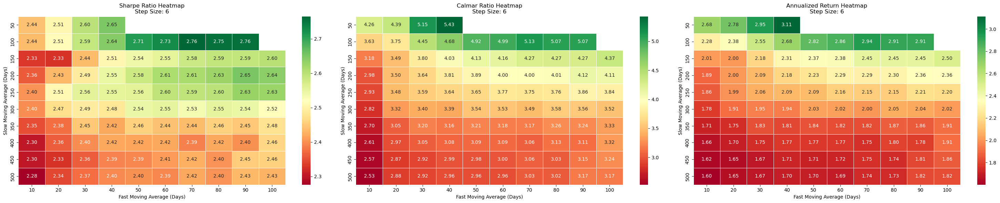

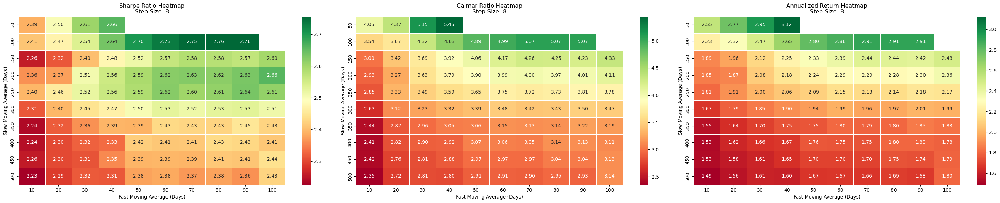

In [78]:
## Price without Signal Signal Strength Signal and 20-1-1 Keltner Channel
df_result_price_strength_False_1_atr = moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, price_or_returns_calc='price', include_signal_strength=False,
                                                                                              rolling_atr_window=20, upper_atr_multiplier=1, lower_atr_multiplier=1)

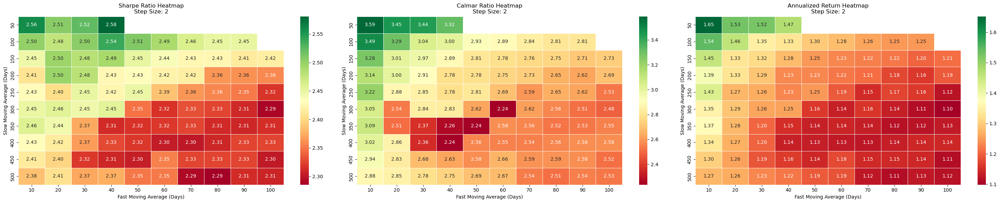

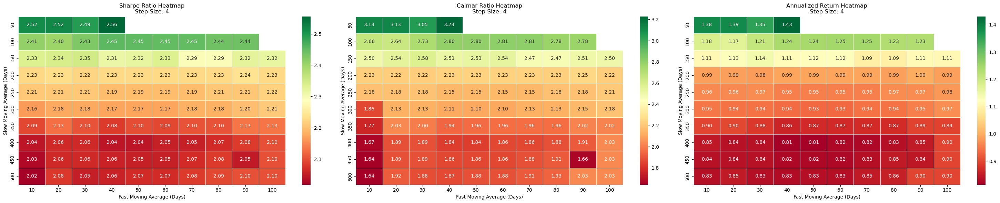

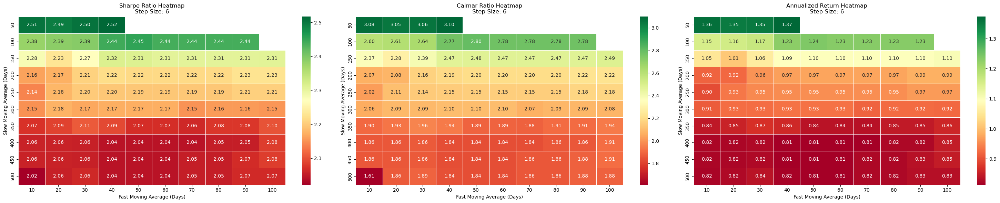

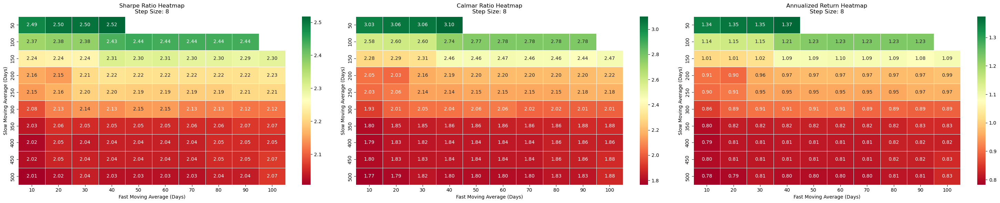

In [86]:
## Price without Signal Signal Strength Signal and 20-3-3 Keltner Channel
df_result_price_strength_False_3_atr = moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, price_or_returns_calc='price', include_signal_strength=False,
                                                                                              rolling_atr_window=20, upper_atr_multiplier=3, lower_atr_multiplier=3)

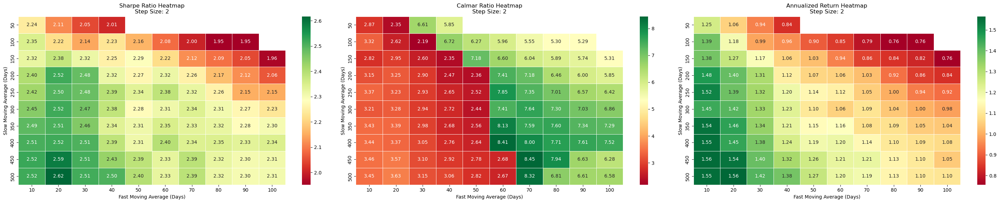

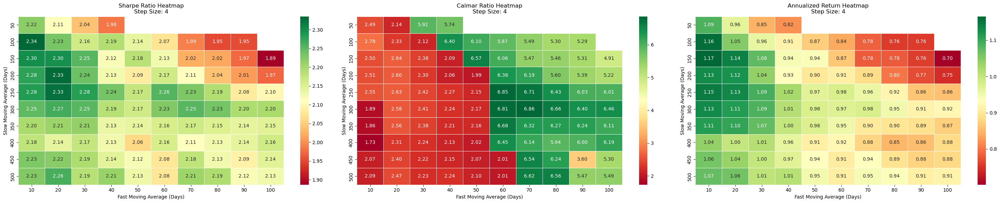

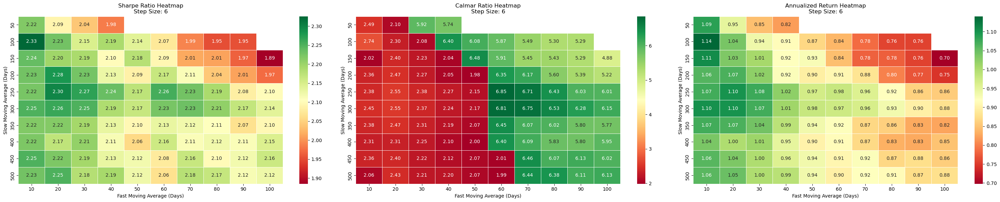

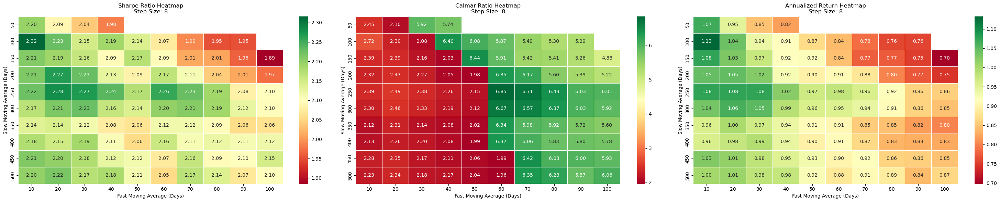

In [87]:
## Price with Signal Signal Strength Signal and 20-2-2 Keltner Channel
df_result_price_strength_True = moving_avg_crossover_with_keltner_strategy_performance(start_date, end_date, ticker, price_or_returns_calc='price', include_signal_strength=True)

In [83]:
fast_mavg = 20
slow_mavg = 250
mavg_stepsize = 8
moving_avg_type = 'exponential'
price_or_returns_calc = 'price'
keltner_performance_cols = ['ticker','rolling_atr_window','upper_multiplier','lower_multiplier','annualized_return','annualized_sharpe_ratio',
                            'calmar_ratio','max_drawdown','max_drawdown_duration','trade_count']
df_performance = pd.DataFrame(columns=keltner_performance_cols)
for window in np.arange(20, 60, 5):
    for multiplier in np.arange(1, 6, 1):
        df_trend_mavg_keltner = generate_trend_signal_with_keltner_channel(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                   mavg_stepsize=mavg_stepsize, price_or_returns_calc='price', include_signal_strength=False,
                                                                          rolling_atr_window=window, upper_atr_multiplier=multiplier, lower_atr_multiplier=multiplier)
        performance_metrics = calculate_risk_and_performance_metrics(
            df_trend_mavg_keltner, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{window}_keltner_strategy_returns',
            strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{window}_keltner_strategy_trades', passive_trade_rate=0.05)
        row = {'ticker': ticker,
               'rolling_atr_window': window,
               'upper_multiplier': multiplier,
               'lower_multiplier': multiplier,
               'annualized_return': performance_metrics['annualized_return'],
               'annualized_sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
               'calmar_ratio': performance_metrics['calmar_ratio'],
               'max_drawdown': performance_metrics['max_drawdown'],
               'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
               'trade_count': performance_metrics['trade_count']
              }
        df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)

In [84]:
df_performance

,ticker,rolling_atr_window,upper_multiplier,lower_multiplier,annualized_return,annualized_sharpe_ratio,calmar_ratio,max_drawdown,max_drawdown_duration,trade_count
0,BTC-USD,20,1,1,1.909154,2.459525,3.330006,-0.544785,315 days,236.0
1,BTC-USD,20,2,2,1.416440,2.290312,3.391848,-0.417601,334 days,180.0
2,BTC-USD,20,3,3,0.912678,2.069928,1.984305,-0.459949,465 days,120.0
3,BTC-USD,20,4,4,0.602406,1.659624,3.208247,-0.187768,443 days,94.0
4,BTC-USD,20,5,5,0.322790,1.062251,4.826978,-0.066872,526 days,62.0
5,BTC-USD,25,1,1,1.713474,2.255677,2.988694,-0.550373,332 days,210.0
6,BTC-USD,25,2,2,1.428235,2.223343,3.537658,-0.403723,333 days,184.0
7,BTC-USD,25,3,3,1.125178,2.257072,2.626037,-0.428470,465 days,144.0
8,BTC-USD,25,4,4,0.674369,1.725380,1.501859,-0.449023,499 days,96.0
9,BTC-USD,25,5,5,0.418941,1.338170,1.492200,-0.280754,485 days,64.0


In [87]:
fast_mavg = 20
slow_mavg = 250
mavg_stepsize = 8
ticker = 'BTC-USD'
moving_avg_type = 'exponential'
price_or_returns_calc = 'price'
rolling_atr_window = 20
upper_atr_multiplier = 2
lower_atr_multiplier = 2
data = get_close_prices(start_date, end_date, ticker, print_status=False)
df_trend_mavg = (create_trend_strategy(data, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                       price_or_returns_calc=price_or_returns_calc)
                 .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                  f'{ticker}_trend_strategy_trades': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'}))
df_trend_mavg_keltner = generate_trend_signal_with_keltner_channel(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                   mavg_stepsize=mavg_stepsize, price_or_returns_calc='price', rolling_atr_window=rolling_atr_window,
                                                                   upper_atr_multiplier=upper_atr_multiplier, lower_atr_multiplier=lower_atr_multiplier, include_signal_strength=False)

In [89]:
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades', include_transaction_costs_and_fees=True))

rolling_sharpe_window = 50
df_trend_mavg[f'rolling_sharpe_{rolling_sharpe_window}'] = (rolling_sharpe_ratio(df_trend_mavg, window=rolling_sharpe_window, 
strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'))
df_trend_mavg = df_trend_mavg.rename(
    columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_rolling_sharpe_{rolling_sharpe_window}'})

In [91]:
df_trend_mavg_keltner[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg_keltner, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades', include_transaction_costs_and_fees=True))

df_trend_mavg_keltner[f'rolling_sharpe_{rolling_sharpe_window}'] = (rolling_sharpe_ratio(df_trend_mavg_keltner, window=rolling_sharpe_window, 
strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns',
strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades'))
df_trend_mavg_keltner = df_trend_mavg_keltner.rename(
    columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_rolling_sharpe_{rolling_sharpe_window}'})

In [93]:
df_trend_mavg.head()

,BTC-USD,BTC-USD_pct_returns,BTC-USD_20_mavg,BTC-USD_20_mavg_slope,BTC-USD_52_mavg,BTC-USD_52_mavg_slope,BTC-USD_85_mavg,BTC-USD_85_mavg_slope,BTC-USD_118_mavg,BTC-USD_118_mavg_slope,BTC-USD_151_mavg,BTC-USD_151_mavg_slope,BTC-USD_184_mavg,BTC-USD_184_mavg_slope,BTC-USD_217_mavg,BTC-USD_217_mavg_slope,BTC-USD_250_mavg,BTC-USD_250_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_trend_signal,BTC-USD_20_8_250_trend_strategy_returns,BTC-USD_20_8_250_trend_strategy_trades,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,strategy_cumulative_return,BTC-USD_20_8_250_trend_strategy_returns_cum,BTC-USD_20_8_250_trend_strategy_rolling_sharpe_50
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-09-27,399.519989,-0.012128,412.544342,-4.478967,413.793555,-4.354046,414.107891,-4.322612,414.250964,-4.308305,414.332764,-4.300125,414.385709,-4.294831,414.422776,-4.291124,414.450177,-4.288384,-1.297789,-1.0,0.012128,0.0,0.0,-0.000000,0.0,0.012128,157.53023,NaN
2014-09-28,377.181000,-0.055915,407.726859,-3.233780,410.068433,-3.050742,410.620582,-3.007455,410.867233,-2.988107,411.006971,-2.977142,411.096926,-2.970084,411.159677,-2.965159,411.205944,-2.961528,-1.905836,-1.0,0.055915,0.0,-1.0,0.055915,-1.0,0.068721,157.53023,NaN
2014-09-29,375.467010,-0.004544,403.505205,-1.993707,406.761585,-1.797334,407.521906,-1.751514,407.860106,-1.731167,408.051276,-1.719677,408.174165,-1.712296,408.259808,-1.707154,408.322909,-1.703367,-3.479086,-1.0,0.004544,0.0,-1.0,0.004544,0.0,0.073578,157.53023,NaN
2014-09-30,386.944000,0.030567,401.412494,-1.783280,404.972186,-1.557760,405.818868,-1.504267,406.196824,-1.480453,406.410788,-1.466994,406.548442,-1.458344,406.644426,-1.452317,406.715172,-1.447877,-4.817704,-1.0,-0.030567,0.0,-1.0,-0.030567,0.0,0.040761,157.53023,NaN
2014-10-01,383.614990,-0.008603,399.231444,-1.507339,403.141108,-1.272795,404.084781,-1.216057,404.507182,-1.190720,404.746574,-1.176384,404.900682,-1.167165,405.008179,-1.160740,405.087430,-1.156005,-5.302678,-1.0,0.008603,0.0,-1.0,0.008603,0.0,0.049715,157.53023,NaN


In [95]:
df_trend_mavg_keltner.head()

,BTC-USD,BTC-USD_pct_returns,BTC-USD_20_mavg,BTC-USD_20_mavg_slope,BTC-USD_52_mavg,BTC-USD_52_mavg_slope,BTC-USD_85_mavg,BTC-USD_85_mavg_slope,BTC-USD_118_mavg,BTC-USD_118_mavg_slope,BTC-USD_151_mavg,BTC-USD_151_mavg_slope,BTC-USD_184_mavg,BTC-USD_184_mavg_slope,BTC-USD_217_mavg,BTC-USD_217_mavg_slope,BTC-USD_250_mavg,BTC-USD_250_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_trend_signal,BTC-USD_trend_strategy_returns_20_8_250,BTC-USD_trend_strategy_trades_20_8_250,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,BTC-USD_20_atr_upper_band_price,BTC-USD_20_atr_lower_band_price,BTC-USD_20_atr_middle_band_price,BTC-USD_20_keltner_signal,BTC-USD_20_8_250_mavg_crossover_20_keltner_signal,BTC-USD_20_8_250_mavg_crossover_20_keltner_strategy_returns,BTC-USD_20_8_250_mavg_crossover_20_keltner_strategy_trades,strategy_cumulative_return,BTC-USD_20_8_250_mavg_crossover_20_keltner_strategy_returns_cum,BTC-USD_20_8_250_mavg_crossover_20_keltner_strategy_rolling_sharpe_50
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-09-27,399.519989,-0.012128,412.544342,-4.478967,413.793555,-4.354046,414.107891,-4.322612,414.250964,-4.308305,414.332764,-4.300125,414.385709,-4.294831,414.422776,-4.291124,414.450177,-4.288384,-1.297789,-1.0,0.012128,0.0,0.0,-0.000000,0.0,472.016908,388.740652,430.378780,0,0,-0.000000,NaN,0.000000,38813.621834,NaN
2014-09-28,377.181000,-0.055915,407.726859,-3.233780,410.068433,-3.050742,410.620582,-3.007455,410.867233,-2.988107,411.006971,-2.977142,411.096926,-2.970084,411.159677,-2.965159,411.205944,-2.961528,-1.905836,-1.0,0.055915,0.0,-1.0,0.055915,-1.0,466.874530,388.005165,427.439848,-1,-1,0.055915,-1.0,0.055915,38813.621834,NaN
2014-09-29,375.467010,-0.004544,403.505205,-1.993707,406.761585,-1.797334,407.521906,-1.751514,407.860106,-1.731167,408.051276,-1.719677,408.174165,-1.712296,408.259808,-1.707154,408.322909,-1.703367,-3.479086,-1.0,0.004544,0.0,-1.0,0.004544,0.0,463.415146,381.891435,422.653291,-1,-1,0.004544,0.0,0.060713,38813.621834,NaN
2014-09-30,386.944000,0.030567,401.412494,-1.783280,404.972186,-1.557760,405.818868,-1.504267,406.196824,-1.480453,406.410788,-1.466994,406.548442,-1.458344,406.644426,-1.452317,406.715172,-1.447877,-4.817704,-1.0,-0.030567,0.0,-1.0,-0.030567,0.0,457.509801,378.808917,418.159359,0,0,0.000000,1.0,0.060713,38813.621834,NaN
2014-10-01,383.614990,-0.008603,399.231444,-1.507339,403.141108,-1.272795,404.084781,-1.216057,404.507182,-1.190720,404.746574,-1.176384,404.900682,-1.167165,405.008179,-1.160740,405.087430,-1.156005,-5.302678,-1.0,0.008603,0.0,-1.0,0.008603,0.0,454.129058,376.243878,415.186468,0,0,-0.000000,0.0,0.060713,38813.621834,NaN


In [97]:
calculate_risk_and_performance_metrics(df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                      strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades', passive_trade_rate=0.05)

{'annualized_return': 0.5264582536332134,
 'annualized_sharpe_ratio': 0.9295938458917369,
 'calmar_ratio': 0.3298615429440839,
 'annualized_std_dev': 0.48970426074736856,
 'max_drawdown': -1.5959976690051905,
 'max_drawdown_duration': Timedelta('712 days 00:00:00'),
 'hit_rate': 0.35619615639496355,
 't_statistic': 3.5618371338600974,
 'p_value': 0.00037396465897973304,
 'trade_count': 36.0}

In [99]:
calculate_risk_and_performance_metrics(
    df_trend_mavg_keltner, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades', passive_trade_rate=0.05)

{'annualized_return': 1.4164404490275686,
 'annualized_sharpe_ratio': 2.29031222338655,
 'calmar_ratio': 3.391848156861992,
 'annualized_std_dev': 0.30125751788969424,
 'max_drawdown': -0.41760137350547116,
 'max_drawdown_duration': Timedelta('334 days 00:00:00'),
 'hit_rate': 0.1189529489728297,
 't_statistic': 8.48499561238172,
 'p_value': 3.331273974470013e-17,
 'trade_count': 180.0}

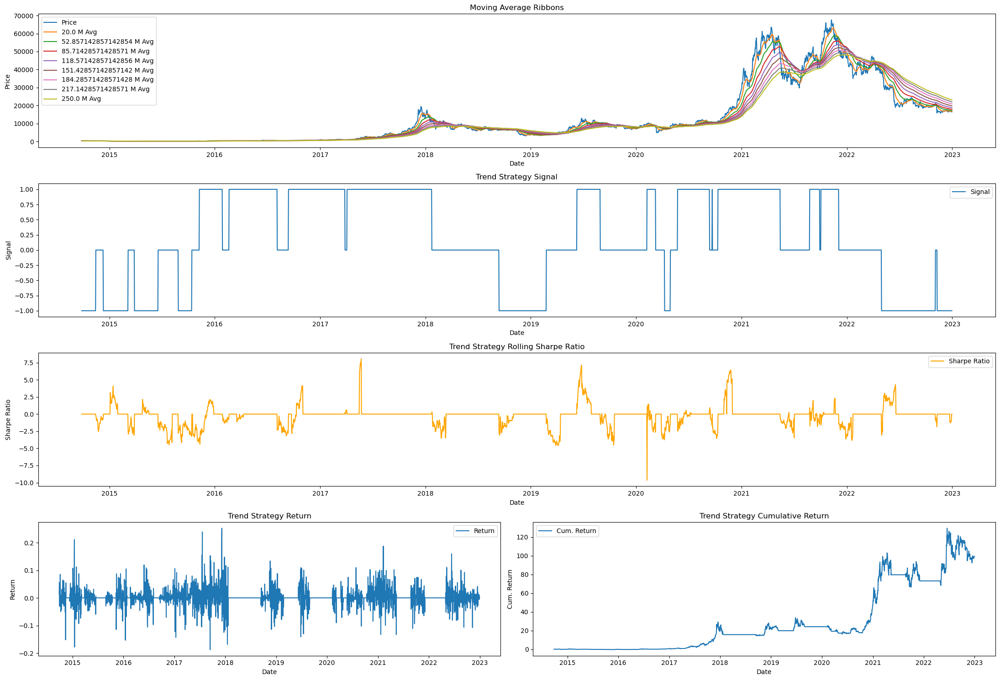

In [101]:
fig = plt.figure(figsize=(22,15))
# plt.style.use('bmh')
layout = (4,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_sharpe_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (3,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (3,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

_ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

_ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_trend_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_rolling_sharpe_{rolling_sharpe_window}'], label='Sharpe Ratio', color='orange')
# _ = trend_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_sharpe_ax.set_title(f'Trend Strategy Rolling Sharpe Ratio')
_ = trend_sharpe_ax.set_ylabel('Sharpe Ratio')
_ = trend_sharpe_ax.set_xlabel('Date')
_ = trend_sharpe_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns'], label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg.index, df_trend_mavg['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

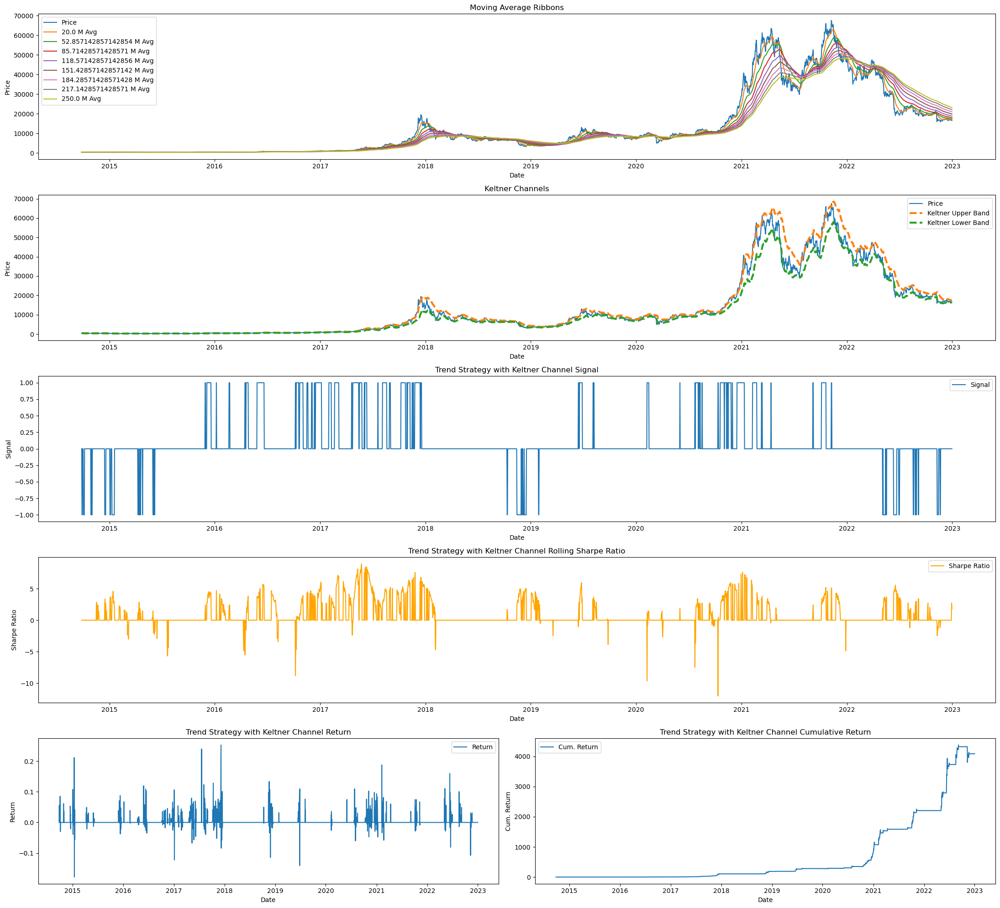

In [103]:
fig = plt.figure(figsize=(22,20))
# plt.style.use('bmh')
layout = (5,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_keltner_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

_ = trend_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner[f'{ticker}'], label='Price')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

_ = trend_keltner_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner[f'{ticker}'], label='Price')
_ = trend_keltner_ax.plot(df_trend_mavg_keltner.index,
                  df_trend_mavg_keltner[f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}'], label='Keltner Upper Band', linestyle='--', linewidth=3)
_ = trend_keltner_ax.plot(df_trend_mavg_keltner.index,
                  df_trend_mavg_keltner[f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}'], label='Keltner Lower Band', linestyle='--', linewidth=3)

_ = trend_keltner_ax.set_title(f'Keltner Channels')
_ = trend_keltner_ax.set_ylabel('Price')
_ = trend_keltner_ax.set_xlabel('Date')
_ = trend_keltner_ax.legend()

_ = trend_signal_ax.plot(df_trend_mavg_keltner.index,
                         df_trend_mavg_keltner[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy with Keltner Channel Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_sharpe_ax.plot(df_trend_mavg_keltner.index,
                         df_trend_mavg_keltner[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                         label='Sharpe Ratio', color='orange')
# _ = trend_sharpe_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_sharpe_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_sharpe_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_sharpe_ax.set_title(f'Trend Strategy with Keltner Channel Rolling Sharpe Ratio')
_ = trend_sharpe_ax.set_ylabel('Sharpe Ratio')
_ = trend_sharpe_ax.set_xlabel('Date')
_ = trend_sharpe_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg_keltner.index,
                         df_trend_mavg_keltner[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy with Keltner Channel Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg_keltner.index, df_trend_mavg_keltner['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy with Keltner Channel Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

## Donchian Channels

In [32]:
## Specify date range and pull data for specific instrument
in_sample_start_date = pd.to_datetime('2016-01-01').date()
in_sample_end_date = pd.to_datetime('2022-12-31').date()
ticker = 'BTC-USD'

In [69]:
def calculate_donchian_channels(start_date, end_date, ticker, price_or_returns_calc='price', rolling_donchian_window=20):
    
    df = load_financial_data(start_date, end_date, ticker, print_status=False)
    df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']
    
    if price_or_returns_calc == 'price':
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = df[f'adjclose'].rolling(window=rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = df[f'adjclose'].rolling(window=rolling_donchian_window).min()
        
    elif price_or_returns_calc == 'returns':
        # Calculate Percent Returns
        df[f'{ticker}_pct_returns'] = df[f'adjclose'].pct_change()
        
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = df[f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = df[f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).min()

    # Middle of the channel (optional, could be just average of upper and lower)
    df[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'] = (
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] +
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']) / 2
    
     # Shift only the Keltner channel metrics to avoid look-ahead bias
    df[[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']] = df[[
        f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']].shift(1)
        
    return df

# Generate signals based on price vs Donchian Channel
def generate_donchian_signals(start_date, end_date, ticker, price_or_returns_calc='price', rolling_donchian_window=20):
    
    df = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                     rolling_donchian_window=rolling_donchian_window)
    if price_or_returns_calc == 'price':

        # Buy signal: Price crosses above upper band
        df[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where((df[f'adjclose'] > df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price']), 1,
                                                                             np.where((df[f'adjclose'] < df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price']), -1, 0))
    elif price_or_returns_calc == 'returns':
        df[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where((df[f'{ticker}_pct_returns'] > df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_returns']), 1,
                                                                             np.where((df[f'{ticker}_pct_returns'] < df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_returns']), -1, 0))
        
    # Strategy Returns
    df[f'{ticker}_pct_returns'] = df[f'adjclose'].pct_change()
    df[f'{ticker}_{rolling_donchian_window}_donchian_strategy_returns'] = df[f'{ticker}_pct_returns'] * df[f'{ticker}_{rolling_donchian_window}_donchian_signal']
    df[f'{ticker}_{rolling_donchian_window}_donchian_strategy_trades'] = df[f'{ticker}_{rolling_donchian_window}_donchian_signal'].diff()

    return df    

In [71]:
df_donchian_signal_price = generate_donchian_signals(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='price', rolling_donchian_window=20)
df_donchian_signal_returns = generate_donchian_signals(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='returns', rolling_donchian_window=20)

[*********************100%***********************]  1 of 1 completed


In [75]:
donchian_performance_cols = ['ticker','rolling_donchian_window','annualized_return','annualized_sharpe_ratio',
                            'calmar_ratio','max_drawdown','max_drawdown_duration','trade_count']
df_performance = pd.DataFrame(columns=donchian_performance_cols)
for window in np.arange(10, 80, 5):
    df_donchian_signal_price = generate_donchian_signals(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='price',
                                                         rolling_donchian_window=window)
    performance_metrics = calculate_risk_and_performance_metrics(df_donchian_signal_price, strategy_daily_return_col=f'{ticker}_{window}_donchian_strategy_returns',
                                                                 strategy_trade_count_col=f'{ticker}_{window}_donchian_strategy_trades', passive_trade_rate=0.05)
    row = {'ticker': ticker,
           'rolling_donchian_window': window,
           'annualized_return': performance_metrics['annualized_return'],
           'annualized_sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
           'calmar_ratio': performance_metrics['calmar_ratio'],
           'max_drawdown': performance_metrics['max_drawdown'],
           'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
           'trade_count': performance_metrics['trade_count']
          }
    df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)

In [77]:
df_performance

,ticker,rolling_donchian_window,annualized_return,annualized_sharpe_ratio,calmar_ratio,max_drawdown,max_drawdown_duration,trade_count
0,BTC-USD,10,17.916619,4.726266,83.275549,-0.215149,50 days,812.0
1,BTC-USD,15,11.091531,4.342365,10.682932,-1.038248,55 days,656.0
2,BTC-USD,20,8.415941,4.095935,17.122101,-0.491525,59 days,576.0
3,BTC-USD,25,6.924795,3.948426,14.251723,-0.485892,59 days,506.0
4,BTC-USD,30,5.973643,3.788383,0.861264,-6.935904,89 days,466.0
5,BTC-USD,35,5.224386,3.662768,6.574010,-0.794703,95 days,436.0
6,BTC-USD,40,4.616499,3.579463,0.735759,-6.274470,110 days,408.0
7,BTC-USD,45,3.987702,3.457199,2.966059,-1.344444,112 days,376.0
8,BTC-USD,50,3.585955,3.348241,4.412150,-0.812745,112 days,350.0
9,BTC-USD,55,3.307044,3.269630,4.068978,-0.812745,112 days,334.0


## Moving Average and Donchian Channels Signals

In [24]:
# from strategy_performance_metrics import calculate_risk_and_performance_metrics

import seaborn as sns

def plot_moving_avg_crossover_performance(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

# def generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns',
#                                                 rolling_donchian_window=20, include_signal_strength=True, long_only=False, use_coinbase_data=True):
    
#     # Generate Trend Signal
#     if use_coinbase_data:
#         df = cn.get_coinbase_ohlc_data(ticker=ticker)
#         df = (df[['close']].rename(columns={'close':ticker}))
#         df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
#     else:
#         df = tf.get_close_prices(start_date, end_date, ticker, print_status=False)
#     df_trend = (tf.create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
#                                       price_or_returns_calc=price_or_returns_calc)
#                 .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
#                                  f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))
#     # Generate Donchian Signal
#     df_donchian = tf.calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
#                                             rolling_donchian_window=rolling_donchian_window, use_coinbase_data=use_coinbase_data)
#     if price_or_returns_calc == 'price':

#         # Buy signal: Price crosses above upper band
#         df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
#             (df_donchian[f'close'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price']), 1,
#             np.where((df_donchian[f'close'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price']), -1, 0))
#     elif price_or_returns_calc == 'returns':
#         df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
#             (df_donchian[f'{ticker}_pct_returns'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_returns']), 1,
#             np.where((df_donchian[f'{ticker}_pct_returns'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_returns']), -1, 0))

#     # Merging the Trend and donchian Dataframes
#     donchian_cols = [f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}',
#                      f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_signal']
#     df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')
    
#     if include_signal_strength:
#         # Calculate the strength of moving average crossover and donchian signal
#         df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'] = (df_trend[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] -
#                                                                              df_trend[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'])
#         donchian_strength = (np.abs(df_trend[f'{ticker}'] - df_trend[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}']) /
#                              df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'])
#         crossover_strength = np.abs(df_trend[f'{ticker}_{fast_mavg}_mavg'] - df_trend[f'{ticker}_{slow_mavg}_mavg']) / df_trend[f'{ticker}']

#         df_trend[f'{ticker}_crossover_donchian_signal_strength'] = (donchian_strength + crossover_strength) / 2
#         strength_threshold = 0.5
    
#         # Moving Average and Donchian Channel Signal
#         buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
#                       (df_trend[f'{ticker}_trend_signal'] == 1) &
#                       (df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold))
#         sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
#                        (df_trend[f'{ticker}_trend_signal'] == -1) &
#                        ((df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold)))
#     else:
#         # Moving Average and Donchian Channel Signal
#         buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
#                       (df_trend[f'{ticker}_trend_signal'] == 1))
#         sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
#                        (df_trend[f'{ticker}_trend_signal'] == -1))
    
#     if long_only:
#         df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
#             np.where(buy_signal, 1, 0))
#     else:
#         df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
#             np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
        
#     df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] = (
#         df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')] * 
#         df_trend[f'{ticker}_pct_returns'])
#     df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'] = (
#         df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')].diff())
    
#     return df_trend

def moving_avg_crossover_with_donchian_strategy_performance(start_date, end_date, ticker, moving_avg_type='exponential', price_or_returns_calc='returns',
                                                           rolling_donchian_window=20, include_signal_strength=True):
    
    perf_cols = ['ticker', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
                'hit_rate', 't_statistic', 'p_value', 'trade_count']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    # fast_mavg_list = np.arange(10, 101, 10)
    # slow_mavg_list = np.arange(50, 501, 50)
    fast_mavg_list = np.arange(5, 21, 5)
    slow_mavg_list = np.arange(10, 101, 10)
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for mavg_stepsize in mavg_stepsize_list:
                if fast_mavg < slow_mavg:
                    df_trend = tf.generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type, price_or_returns_calc,
                                                                              rolling_donchian_window, include_signal_strength)
                    performance_metrics = perf.calculate_risk_and_performance_metrics(
                        df_trend, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
                        strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades',
                        include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.05, annual_trading_days=365)
                    row = {
                        'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': mavg_stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio'],
                        'annualized_std_dev': performance_metrics['annualized_std_dev'],
                        'max_drawdown': performance_metrics['max_drawdown'],
                        'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                        'hit_rate': performance_metrics['hit_rate'],
                        't_statistic': performance_metrics['t_statistic'],
                        'p_value': performance_metrics['p_value'],
                        'trade_count': performance_metrics['trade_count']
                    }
                    df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)
    
    plot_moving_avg_crossover_performance(df_performance)
    
    return df_performance

In [48]:
df_trend = tf.generate_trend_signal_with_donchian_channel(start_date=pd.to_datetime(in_sample_start_date).date(), end_date=pd.to_datetime(in_sample_end_date).date(), ticker='BTC-USD',
                                                          fast_mavg=50, slow_mavg=250, mavg_stepsize=6, moving_avg_type='exponential', price_or_returns_calc='price',
                                                          rolling_donchian_window=20, long_only=False)

<Axes: xlabel='date'>

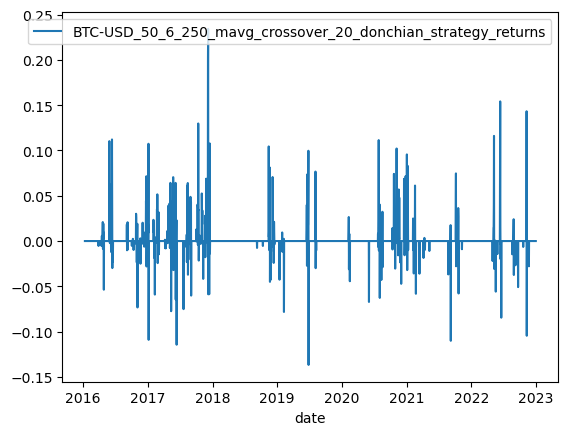

In [52]:
df_trend[['BTC-USD_50_6_250_mavg_crossover_20_donchian_strategy_returns']].plot()

In [58]:
perf.calculate_risk_and_performance_metrics(df_trend, strategy_daily_return_col='BTC-USD_50_6_250_mavg_crossover_20_donchian_strategy_returns', strategy_trade_count_col='BTC-USD_50_6_250_mavg_crossover_20_donchian_strategy_trades', annual_trading_days=365)

{'annualized_return': 0.3839245593298224,
 'annualized_sharpe_ratio': -0.4538830537519946,
 'calmar_ratio': 0.09400306582665567,
 'annualized_std_dev': 0.3081117162328749,
 'max_drawdown': -4.084170616709355,
 'max_drawdown_duration': Timedelta('1850 days 00:00:00'),
 'hit_rate': 0.05889281507656066,
 't_statistic': -0.7805770344950956,
 'p_value': 0.43512386901997446,
 'trade_count': 278.0}

In [56]:
df_trend[df_trend['BTC-USD_50_6_250_mavg_crossover_20_donchian_signal'] != 0].head(20)

,BTC-USD_close,BTC-USD_open,BTC-USD_pct_returns,BTC-USD_50_mavg,BTC-USD_50_mavg_slope,BTC-USD_90_mavg,BTC-USD_90_mavg_slope,BTC-USD_130_mavg,BTC-USD_130_mavg_slope,BTC-USD_170_mavg,BTC-USD_170_mavg_slope,BTC-USD_210_mavg,BTC-USD_210_mavg_slope,BTC-USD_250_mavg,BTC-USD_250_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_trend_signal,BTC-USD_trend_strategy_returns_50_6_250,BTC-USD_trend_strategy_trades_50_6_250,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_middle_band_price_t_2,BTC-USD_20_donchian_signal,BTC-USD_50_6_250_mavg_crossover_20_donchian_signal,BTC-USD_50_6_250_mavg_crossover_20_donchian_strategy_returns,BTC-USD_50_6_250_mavg_crossover_20_donchian_strategy_trades
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-03-28,423.00,425.29,-0.005408,413.249455,0.177436,411.312712,0.156453,410.585304,0.138593,410.243417,0.127290,410.054143,0.119810,409.937100,0.114563,3.110978,1.0,-0.005408,0.0,1.0,-0.005408,1.0,419.39,409.65,414.520,1,1,-0.005408,1.0
2016-04-13,425.58,427.80,-0.005189,417.010588,0.287446,414.471518,0.231365,413.356801,0.200621,412.777944,0.182510,412.433544,0.170840,412.208253,0.162766,4.638128,1.0,-0.005189,0.0,1.0,-0.005189,0.0,425.30,412.79,419.045,1,1,-0.005189,1.0
2016-04-16,433.39,430.82,0.005709,418.535470,0.359253,415.594305,0.278333,414.300738,0.238243,413.623737,0.215360,413.218193,0.200828,412.951418,0.190856,5.256024,1.0,0.005709,0.0,1.0,0.005709,0.0,427.80,412.79,420.295,1,1,0.005709,1.0
2016-04-17,431.00,433.69,-0.005515,419.030860,0.380598,415.966669,0.292819,414.615430,0.249963,413.906263,0.225632,413.480530,0.210221,413.200003,0.199663,5.584052,1.0,-0.005515,0.0,1.0,-0.005515,0.0,430.93,412.79,421.860,1,1,-0.005515,0.0
2016-04-20,442.96,437.06,0.013499,421.105211,0.523478,417.455039,0.385598,415.851866,0.323933,415.006816,0.290070,414.497239,0.268973,414.160171,0.254661,6.437204,1.0,0.013499,0.0,1.0,0.013499,0.0,433.39,412.79,423.090,1,1,0.013499,1.0
2016-04-21,452.25,442.87,0.020973,422.340568,0.614824,418.288975,0.443636,416.528315,0.369737,415.601693,0.329752,415.042861,0.305030,414.673019,0.288337,6.945040,1.0,0.020973,0.0,1.0,0.020973,0.0,437.06,416.03,426.545,1,1,0.020973,0.0
2016-04-22,448.41,452.25,-0.008491,423.374146,0.671910,419.009457,0.481573,417.118869,0.400045,416.123502,0.356127,415.522714,0.329044,415.124776,0.310786,7.667549,1.0,-0.008491,0.0,1.0,-0.008491,0.0,442.96,417.68,430.320,1,1,-0.008491,0.0
2016-04-24,464.46,455.68,0.019246,426.231652,0.885043,420.947271,0.618739,418.689190,0.508537,417.502677,0.450142,416.786321,0.414455,416.311448,0.390533,8.989787,1.0,0.019246,0.0,1.0,0.019246,0.0,452.25,419.46,435.855,1,1,0.019246,1.0
2016-04-25,466.17,464.47,0.003682,427.813126,0.989282,422.022851,0.687035,419.560310,0.562757,418.267178,0.497168,417.486310,0.457181,416.968479,0.430420,9.920205,1.0,0.003682,0.0,1.0,0.003682,0.0,455.69,419.46,437.575,1,1,0.003682,0.0


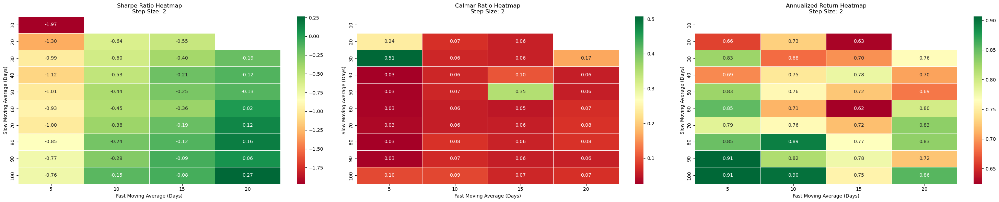

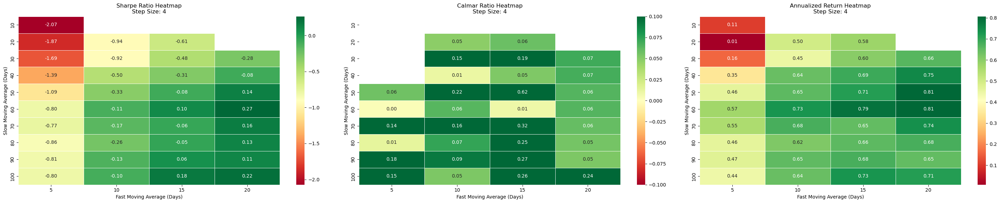

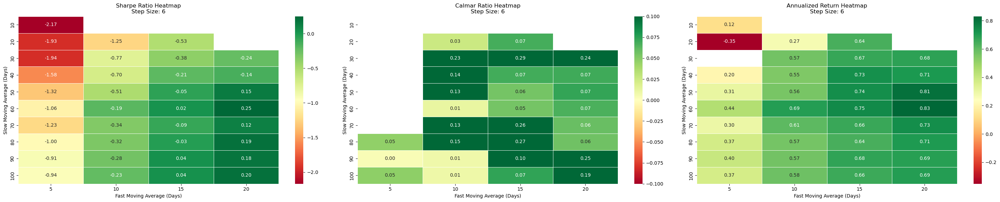

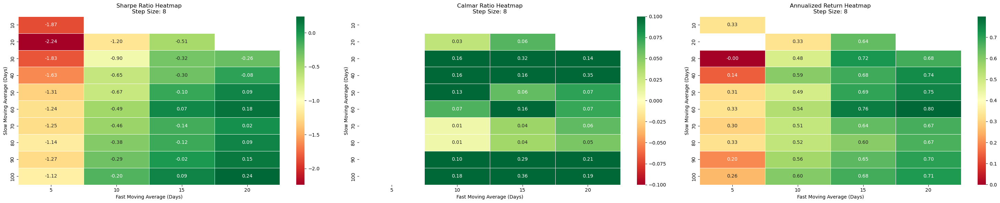

In [34]:
## Returns with Donchian Channels and without Signal Strength Signal
df_result_returns_strength_False = moving_avg_crossover_with_donchian_strategy_performance(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='returns', include_signal_strength=False)

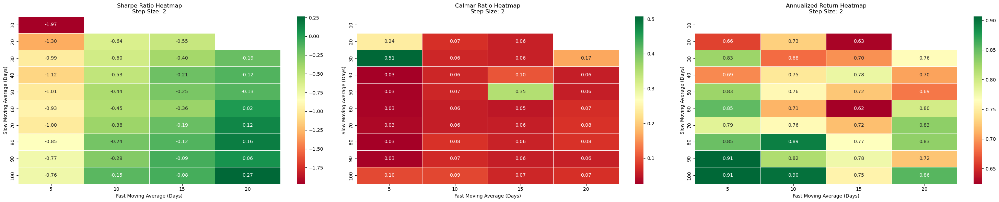

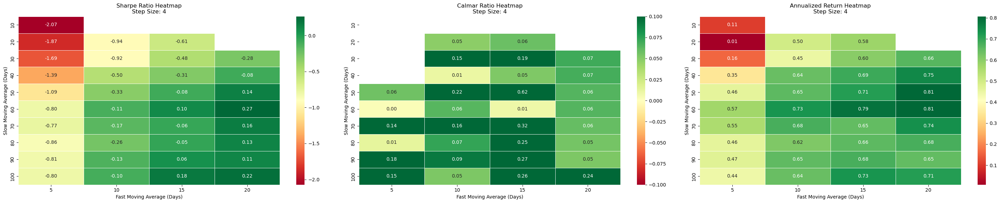

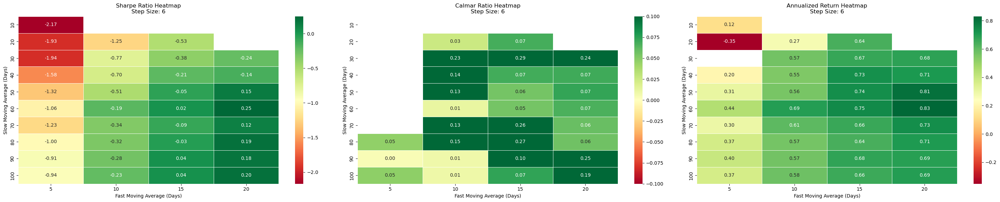

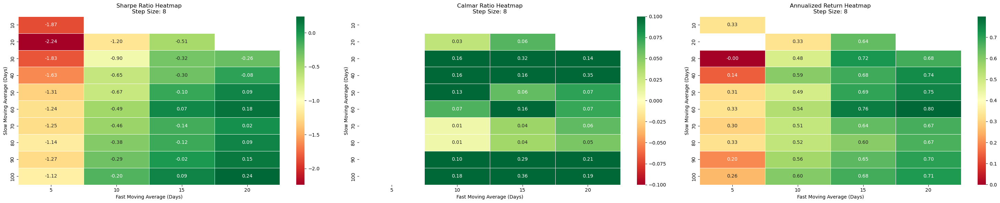

In [35]:
## Returns with Donchian Channels and with Signal Strength Signal
df_result_returns_strength_True = moving_avg_crossover_with_donchian_strategy_performance(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='returns', include_signal_strength=True)

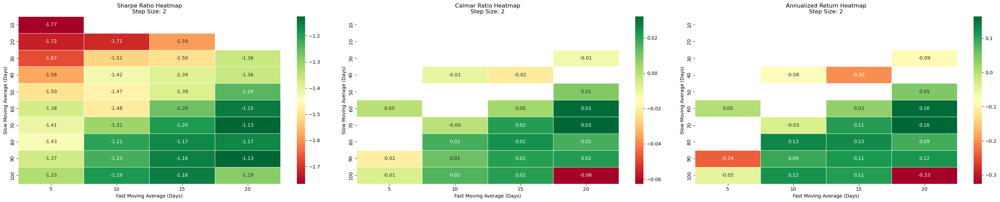

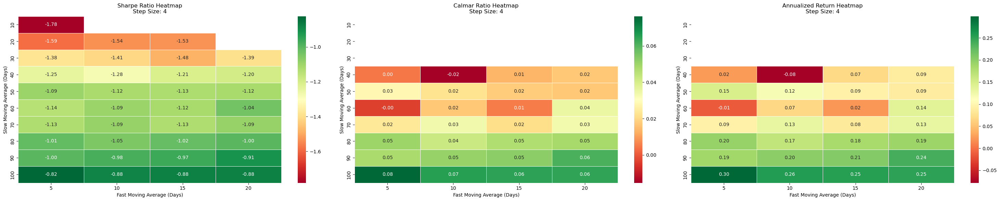

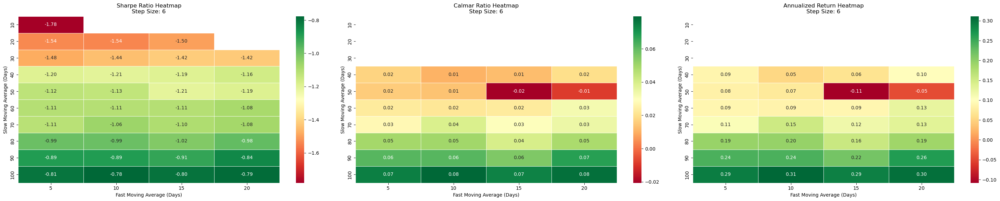

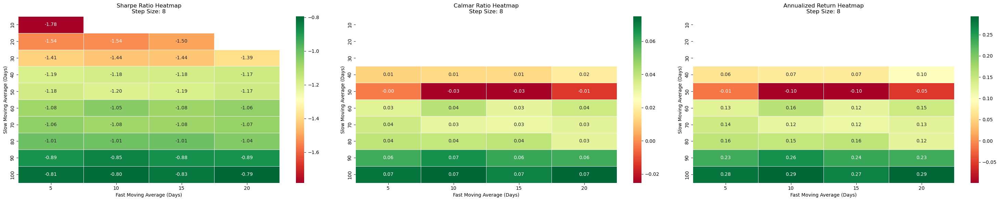

In [36]:
## Price with Donchian Channels and without Signal Strength Signal
df_result_price_strength_False = moving_avg_crossover_with_donchian_strategy_performance(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='price', include_signal_strength=False)

In [37]:
df_result_price_strength_False[(df_result_price_strength_False.slow_mavg.isin([150, 250])) & ((df_result_price_strength_False.fast_mavg >= 20) & (df_result_price_strength_False.fast_mavg <= 50))]

,ticker,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count


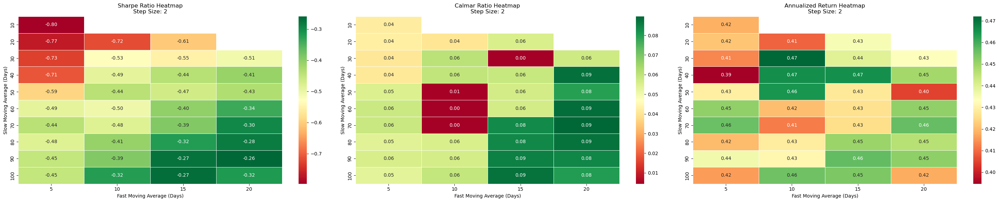

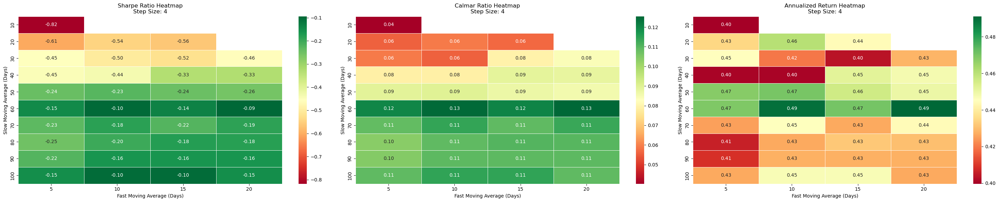

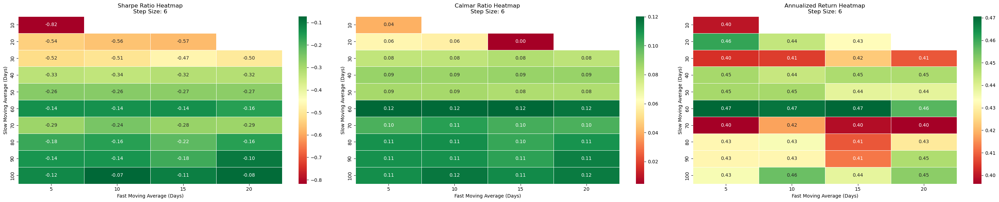

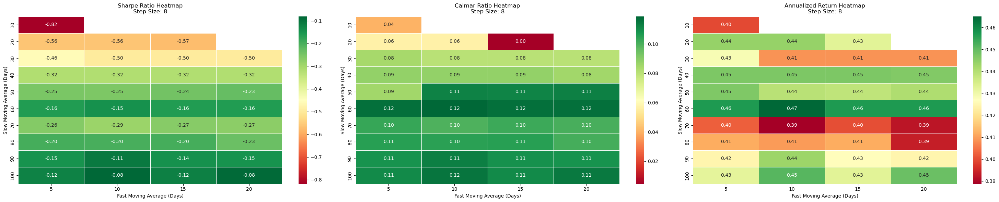

In [38]:
## Price with Donchian Channels and with Signal Strength Signal
df_result_price_strength_True = moving_avg_crossover_with_donchian_strategy_performance(in_sample_start_date, in_sample_end_date, ticker, price_or_returns_calc='price', include_signal_strength=True)

In [98]:
data = cn.get_coinbase_ohlc_data(ticker=ticker)
data = (data[['close']].rename(columns={'close':ticker}))
data = data[(data.index.get_level_values('date') >= in_sample_start_date) & (data.index.get_level_values('date') <= in_sample_end_date)]
data.head()

,BTC-USD
date,
2016-01-01,435.66
2016-01-02,435.40
2016-01-03,431.91
2016-01-04,433.85
2016-01-05,433.34


In [170]:
fast_mavg = 50
slow_mavg = 250
mavg_stepsize = 6
ticker = 'BTC-USD'
moving_avg_type = 'exponential'
price_or_returns_calc = 'price'
rolling_donchian_window = 20
# data = get_close_prices(start_date, end_date, ticker, print_status=False)
data = cn.get_coinbase_ohlc_data(ticker=ticker)
data = (data[['close']].rename(columns={'close':ticker}))
data = data[(data.index.get_level_values('date') >= in_sample_start_date) & (data.index.get_level_values('date') <= in_sample_end_date)]
df_trend_mavg = (create_trend_strategy(data, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                       price_or_returns_calc=price_or_returns_calc)
                 .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                  f'{ticker}_trend_strategy_trades': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'}))
df_trend_mavg_donchian = generate_trend_signal_with_donchian_channel(in_sample_start_date, in_sample_end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                     mavg_stepsize=mavg_stepsize, price_or_returns_calc=price_or_returns_calc, rolling_donchian_window=rolling_donchian_window,
                                                                     include_signal_strength=False)

In [172]:
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades', include_transaction_costs_and_fees=True))
rolling_sharpe_window = 50
df_trend_mavg[f'rolling_sharpe_{rolling_sharpe_window}'] = (perf.rolling_sharpe_ratio(df_trend_mavg, window=rolling_sharpe_window, 
                                                                                 strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                                                                 strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'))
df_trend_mavg = df_trend_mavg.rename(columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_rolling_sharpe_{rolling_sharpe_window}'})


df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades', include_transaction_costs_and_fees=True))

df_trend_mavg_donchian[f'rolling_sharpe_{rolling_sharpe_window}'] = (perf.rolling_sharpe_ratio(df_trend_mavg_donchian, window=rolling_sharpe_window, 
strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'))
df_trend_mavg_donchian = df_trend_mavg_donchian.rename(
    columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'})

In [174]:
print(df_trend_mavg_donchian.shape)
print(df_trend_mavg_donchian[df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] != 0].shape)
print(df_trend_mavg_donchian[df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] > 0].shape)
print(df_trend_mavg_donchian[df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] < 0].shape)

(2547, 31)
(316, 31)
(316, 31)
(0, 31)


In [176]:
calculate_risk_and_performance_metrics(df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                      strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades', passive_trade_rate=0.05, annual_trading_days=365)

{'annualized_return': 0.6766421848327802,
 'annualized_sharpe_ratio': 0.9928571580808052,
 'calmar_ratio': 0.16691243080870172,
 'annualized_std_dev': 0.6635668244776293,
 'max_drawdown': -4.053875325848436,
 'max_drawdown_duration': Timedelta('1182 days 00:00:00'),
 'hit_rate': 0.4040047114252061,
 't_statistic': 2.816980102178421,
 'p_value': 0.004885127773870278,
 'trade_count': 18.0}

In [178]:
calculate_risk_and_performance_metrics(
    df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades', passive_trade_rate=0.05, annual_trading_days=365)

{'annualized_return': 4.34195398853232,
 'annualized_sharpe_ratio': 3.5740380055329735,
 'calmar_ratio': 0.8382534292586824,
 'annualized_std_dev': 0.3314382216473057,
 'max_drawdown': -5.179762870009574,
 'max_drawdown_duration': Timedelta('265 days 00:00:00'),
 'hit_rate': 0.1166077738515901,
 't_statistic': 9.82801431311119,
 'p_value': 2.1231785775429376e-22,
 'trade_count': 276.0}

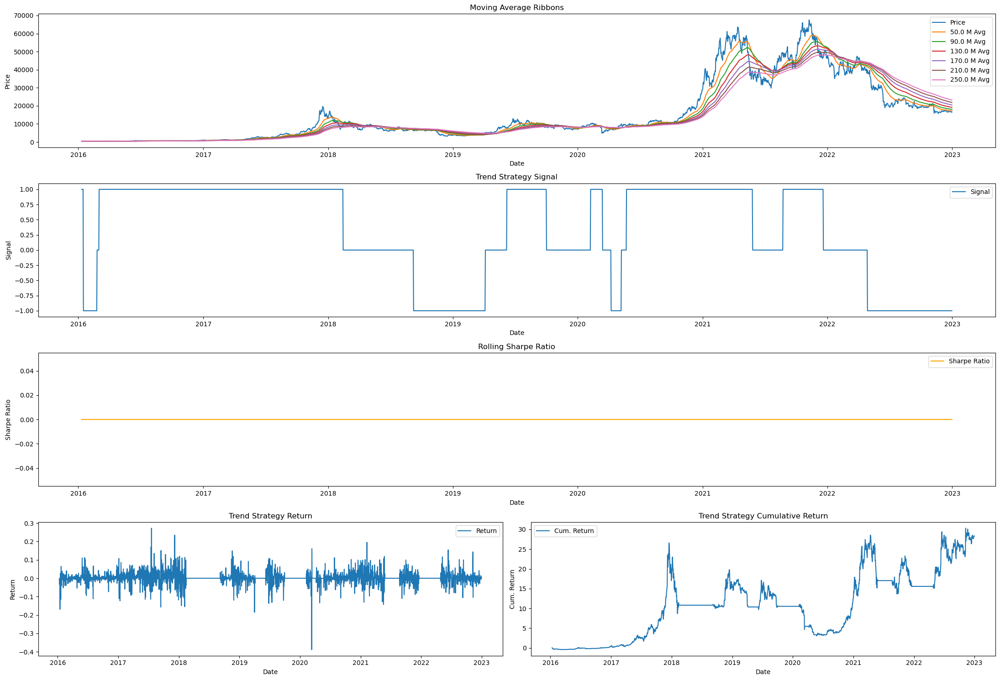

In [180]:
fig = plt.figure(figsize=(22,15))
# plt.style.use('bmh')
layout = (4,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_rolling_sharpe_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (3,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (3,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

_ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_trend_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_rolling_sharpe_{rolling_sharpe_window}'], label='Sharpe Ratio', color='orange')
# _ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_rolling_sharpe_ax.set_title(f'Rolling Sharpe Ratio')
_ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
_ = trend_rolling_sharpe_ax.set_xlabel('Date')
_ = trend_rolling_sharpe_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns'], label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg.index, df_trend_mavg['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

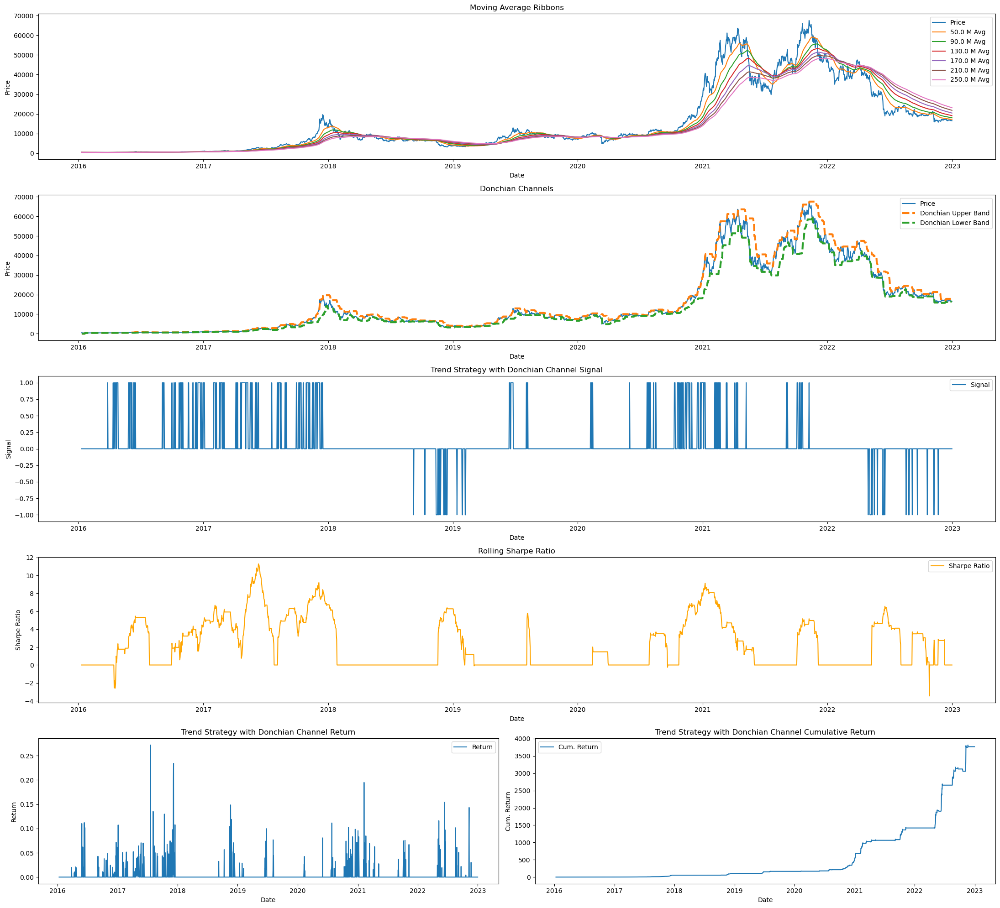

In [182]:
fig = plt.figure(figsize=(22,20))
# plt.style.use('bmh')
layout = (5,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_rolling_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

if price_or_returns_calc == 'price':
    _ = trend_donchian_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_donchian_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
_ = trend_donchian_ax.plot(df_trend_mavg_donchian.index,
                  df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
_ = trend_donchian_ax.plot(df_trend_mavg_donchian.index,
                  df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

_ = trend_donchian_ax.set_title(f'Donchian Channels')
_ = trend_donchian_ax.set_ylabel('Price')
_ = trend_donchian_ax.set_xlabel('Date')
_ = trend_donchian_ax.legend()

_ = trend_signal_ax.plot(df_trend_mavg_donchian.index,
                         df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy with Donchian Channel Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_rolling_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                                 label='Sharpe Ratio', color='orange')
# _ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_rolling_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_rolling_sharpe_ax.set_title(f'Rolling Sharpe Ratio')
_ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
_ = trend_rolling_sharpe_ax.set_xlabel('Date')
_ = trend_rolling_sharpe_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg_donchian.index,
                         df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy with Donchian Channel Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy with Donchian Channel Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

## Relative Strength Indicator

In [ ]:
def generate_rsi_signal(start_date, end_date, ticker, rolling_rsi_period=14, rsi_overbought_threshold=70, rsi_oversold_threshold=30,
                        rsi_mavg_type='exponential', price_or_returns_calc='price'):
    # Get Close Prices
    df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df[f'{ticker}_pct_returns'] = df[f'{ticker}'].pct_change()
    
    if price_or_returns_calc == 'price':
        # Calculate price differences (delta)
        df[f'{ticker}_price_delta'] = df[f'{ticker}'].diff(1)

        # Calculate gains (positive delta) and losses (negative delta)
        df[f'{ticker}_rsi_gain_{price_or_returns_calc}'] = np.where(df[f'{ticker}_price_delta'] > 0,
                                                                    df[f'{ticker}_price_delta'], 0)
        df[f'{ticker}_rsi_loss_{price_or_returns_calc}'] = np.where(df[f'{ticker}_price_delta'] < 0,
                                                                    -df[f'{ticker}_price_delta'], 0)
    elif price_or_returns_calc == 'returns':
        # Calculate gains (positive delta) and losses (negative delta)
        df[f'{ticker}_rsi_gain_{price_or_returns_calc}'] = np.where(df[f'{ticker}_pct_returns'] > 0,
                                                                    df[f'{ticker}_pct_returns'], 0)
        df[f'{ticker}_rsi_loss_{price_or_returns_calc}'] = np.where(df[f'{ticker}_pct_returns'] < 0,
                                                                    -df[f'{ticker}_pct_returns'], 0)
    
    # Calculate rolling average of gains and losses
    if rsi_mavg_type == 'simple':
        df[f'{ticker}_rsi_avg_gain_{price_or_returns_calc}'] = df[f'{ticker}_rsi_gain_{price_or_returns_calc}'].rolling(window=rolling_rsi_period, min_periods=1).mean()
        df[f'{ticker}_rsi_avg_loss_{price_or_returns_calc}'] = df[f'{ticker}_rsi_loss_{price_or_returns_calc}'].rolling(window=rolling_rsi_period, min_periods=1).mean()
    elif rsi_mavg_type == 'exponential':
        df[f'{ticker}_rsi_avg_gain_{price_or_returns_calc}'] = df[f'{ticker}_rsi_gain_{price_or_returns_calc}'].ewm(alpha=1/rolling_rsi_period, min_periods=1, adjust=False).mean()
        df[f'{ticker}_rsi_avg_loss_{price_or_returns_calc}'] = df[f'{ticker}_rsi_loss_{price_or_returns_calc}'].ewm(alpha=1/rolling_rsi_period, min_periods=1, adjust=False).mean()

    # Calculate Relative Strength (RS)
    df[f'{ticker}_rs_{rolling_rsi_period}'] = (df[f'{ticker}_rsi_avg_gain_{price_or_returns_calc}'] / df[f'{ticker}_rsi_avg_loss_{price_or_returns_calc}'])
    
    # Calculate RSI and shift by 1 to avoid look-ahead bias
    df[f'{ticker}_rsi_{rolling_rsi_period}'] = (100 - (100 / (1 + df[f'{ticker}_rs_{rolling_rsi_period}']))).shift(1)
    
    # Generate buy and sell signals based on RSI
    buy_signal = (df[f'{ticker}_rsi_{rolling_rsi_period}'] < rsi_oversold_threshold)
    sell_signal = (df[f'{ticker}_rsi_{rolling_rsi_period}'] > rsi_overbought_threshold)
    df[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_signal'] = np.where(buy_signal, 1,
                                                                                                           np.where(sell_signal, -1, 0))
    
    # Calculate RSI Strategy Performance
    df[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_strategy_returns'] = (
        df[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_signal'] * df[f'{ticker}_pct_returns'].fillna(0))
    df[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_strategy_trades'] = (
        df[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_signal'].diff())
    
    return df

In [ ]:
def generate_trend_signal_with_rsi(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns',
                                   rolling_rsi_period=14, rsi_overbought_threshold=70, rsi_oversold_threshold=30, rsi_mavg_type='exponential'):
    
    # Generate Trend Signal
    df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df[f'{ticker}_pct_returns'] = df[f'{ticker}'].pct_change()
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                                 f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))
    # Generate Donchian Signal
    df_rsi = df_rsi = generate_rsi_signal(start_date, end_date, ticker, rsi_overbought_threshold=rsi_overbought_threshold, rsi_mavg_type=rsi_mavg_type,
                                          rolling_rsi_period=rolling_rsi_period, rsi_oversold_threshold=rsi_oversold_threshold, price_or_returns_calc=price_or_returns_calc)

    # Merging the Trend and RSI Dataframes
    rsi_cols = [f'{ticker}_rsi_{rolling_rsi_period}', f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_signal']
    df_trend = pd.merge(df_trend, df_rsi[rsi_cols], left_index=True, right_index=True, how='left')
    
    # Moving Average and RSI Signal
    buy_signal = ((df_trend[f'{ticker}_trend_signal'] == 1) &
                  (df_trend[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_signal'] == 1))
    sell_signal = ((df_trend[f'{ticker}_trend_signal'] == -1) &
                   (df_trend[f'{ticker}_rsi_{rolling_rsi_period}_{rsi_overbought_threshold}_{rsi_oversold_threshold}_signal'] == -1))
    
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_signal'] = (
        np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_strategy_returns'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_signal')] * 
        df_trend[f'{ticker}_pct_returns'])
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_strategy_trades'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_signal')].diff())
    
    return df_trend

def moving_avg_crossover_with_rsi_strategy_performance(start_date, end_date, ticker, moving_avg_type='exponential', price_or_returns_calc='returns',
                                                       rolling_rsi_period=14, rsi_overbought_threshold=70, rsi_oversold_threshold=30, rsi_mavg_type='exponential'):
    
    perf_cols = ['ticker', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    fast_mavg_list = np.arange(10, 101, 10)
    slow_mavg_list = np.arange(50, 501, 50)
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for mavg_stepsize in mavg_stepsize_list:
                if fast_mavg < slow_mavg:
                    df_trend = generate_trend_signal_with_rsi(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type, price_or_returns_calc,
                                                              rolling_rsi_period, rsi_overbought_threshold, rsi_oversold_threshold, rsi_mavg_type)
                    performance_metrics = calculate_risk_and_performance_metrics(
                        df_trend, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_strategy_returns',
                        strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_strategy_trades')
                    row = {
                        'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': mavg_stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio']
                    }
                    df_performance = df_performance.append(row, ignore_index=True)
    
    plot_moving_avg_crossover_performance(df_performance)
    
    return df_performance

In [ ]:
rsi_performance_cols = ['ticker','rolling_rsi_period','overbought_threshold','oversold_threshold','annualized_return','annualized_sharpe_ratio',
                        'calmar_ratio','max_drawdown','max_drawdown_duration','trade_count']
df_performance = pd.DataFrame(columns=rsi_performance_cols)
rolling_rsi_period = 14
for oversold_threshold in np.arange(10, 51, 5):
    for overbought_threshold in np.arange(50, 96, 5):
        df_rsi_signal_price = generate_rsi_signal(start_date, end_date, ticker, price_or_returns_calc='price', rolling_rsi_period=rolling_rsi_period,
                                                  rsi_mavg_type='simple', rsi_overbought_threshold=overbought_threshold, 
                                                  rsi_oversold_threshold=oversold_threshold)
        performance_metrics = calculate_risk_and_performance_metrics(
            df_rsi_signal_price, 
            strategy_daily_return_col=f'{ticker}_rsi_{rolling_rsi_period}_{overbought_threshold}_{oversold_threshold}_strategy_returns',
            strategy_trade_count_col=f'{ticker}_rsi_{rolling_rsi_period}_{overbought_threshold}_{oversold_threshold}_strategy_trades')
        row = {'ticker': ticker,
               'rolling_rsi_period': rolling_rsi_period,
               'overbought_threshold': overbought_threshold,
               'oversold_threshold': oversold_threshold,
               'annualized_return': performance_metrics['annualized_return'],
               'annualized_sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
               'calmar_ratio': performance_metrics['calmar_ratio'],
               'max_drawdown': performance_metrics['max_drawdown'],
               'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
               'trade_count': performance_metrics['trade_count']
              }
        df_performance = df_performance.append(row, ignore_index=True)

In [ ]:
df_performance

In [ ]:
df_performance = moving_avg_crossover_with_rsi_strategy_performance(start_date, end_date, ticker)

In [ ]:
df_trend.head()

In [ ]:
rsi_overbought_threshold = 70
rsi_oversold_threshold = 30
rolling_rsi_period = 14
fast_mavg = 20
slow_mavg = 250
mavg_stepsize = 8
df_rsi = generate_trend_signal_with_rsi(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, rsi_overbought_threshold=rsi_overbought_threshold, rsi_mavg_type='exponential', rolling_rsi_period=rolling_rsi_period,
                                        rsi_oversold_threshold=rsi_oversold_threshold, price_or_returns_calc='price')
df_rsi = df_rsi.fillna(0)

In [ ]:
fig = plt.figure(figsize=(22,20))
# plt.style.use('bmh')
layout = (4,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_rsi_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (3,0), colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (3,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_rsi.index, df_rsi[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_rsi.index, df_rsi[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_rsi.index, df_rsi[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

_ = trend_rsi_ax.plot(df_rsi.index,
                  df_rsi[f'{ticker}_rsi_{rolling_rsi_period}'], label='RSI', linestyle='--', linewidth=3)

_ = trend_rsi_ax.set_title(f'Relative Strength Index')
_ = trend_rsi_ax.set_ylabel('RSI')
_ = trend_rsi_ax.set_xlabel('Date')
_ = trend_rsi_ax.legend()
_ = trend_rsi_ax.grid()

_ = trend_signal_ax.plot(df_rsi.index,
                         df_rsi[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy with RSI Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_return_ax.plot(df_rsi.index,
                         df_rsi[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_rsi_period}_rsi_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy with RSI Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# # _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
# _ = trend_cum_return_ax.plot(df_rsi.index, df_rsi['strategy_cumulative_return'], label='Cum. Return')
# _ = trend_cum_return_ax.set_title(f'Trend Strategy with Donchian Channel Cumulative Return')
# _ = trend_cum_return_ax.set_ylabel('Cum. Return')
# _ = trend_cum_return_ax.set_xlabel('Date')
# _ = trend_cum_return_ax.legend()


plt.tight_layout()

## Moving Average Crossover Strategy with Ribbon as a Signal

In [80]:
fast_mavg = 20
slow_mavg = 250
mavg_stepsize = 6
ticker = 'BTC-USD'
moving_avg_type = 'exponential'
price_or_returns_calc = 'price'
rolling_donchian_window = 20
data = get_close_prices(start_date, end_date, ticker, print_status=False)
df_trend_mavg = (create_trend_strategy(data, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                       price_or_returns_calc=price_or_returns_calc)
                 .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                  f'{ticker}_trend_strategy_trades': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'}))

In [81]:
df_trend_mavg[f'{ticker}_ribbon_thickness'] = (df_trend_mavg[f'{ticker}_{int(fast_mavg)}_mavg'] - df_trend_mavg[f'{ticker}_{int(slow_mavg)}_mavg']).shift(1)

In [82]:
from scipy.stats import linregress

def calculate_slope(series, window):
    """
    Calculates the slope of a series over a rolling window using linear regression.
    
    :param series: The input data series (e.g., ribbon width).
    :param window: The rolling window size to calculate the slope.
    :return: A pandas Series with the slope values.
    """
    slopes = [np.nan] * window  # First `window` elements will be NaN since we need a full window to compute slope
    for i in range(window, len(series)):
        y = series[i - window:i]  # Take the values in the current window
        x = np.arange(window)     # Create an array [0, 1, 2, ..., window-1] as the x-axis
        slope, _, _, _, _ = linregress(x, y)  # Perform linear regression
        slopes.append(slope)  # Store the slope
    return pd.Series(slopes, index=series.index)

df_trend_mavg[f'{ticker}_ribbon_thickness_slope'] = calculate_slope(df_trend_mavg[f'{ticker}_ribbon_thickness'], window=5)

In [83]:
buy_trend_signal = (df_trend_mavg[f'{ticker}_trend_signal'] == 1) & ((df_trend_mavg[f'{ticker}_ribbon_thickness'] > 500) &
                                                                     (df_trend_mavg[f'{ticker}_ribbon_thickness'] > df_trend_mavg[f'{ticker}_ribbon_thickness'].shift(1)) &
                                                                     (df_trend_mavg[f'{ticker}_ribbon_thickness'].shift(1) > df_trend_mavg[f'{ticker}_ribbon_thickness'].shift(2)))
sell_trend_signal = (df_trend_mavg[f'{ticker}_trend_signal'] == -1) & ((df_trend_mavg[f'{ticker}_ribbon_thickness'] < -500) &
                                                                       (df_trend_mavg[f'{ticker}_ribbon_thickness'] < df_trend_mavg[f'{ticker}_ribbon_thickness'].shift(1)) &
                                                                       (df_trend_mavg[f'{ticker}_ribbon_thickness'].shift(1) < df_trend_mavg[f'{ticker}_ribbon_thickness'].shift(2)))
print(df_trend_mavg[buy_trend_signal].shape)
print(df_trend_mavg[sell_trend_signal].shape)

(428, 27)
(148, 27)


In [84]:
buy_slope_signal = (df_trend_mavg[f'{ticker}_trend_signal'] == 1) & ((df_trend_mavg[f'{ticker}_ribbon_thickness_slope'] > 200) &
                                                                     (df_trend_mavg[f'{ticker}_ribbon_thickness_slope'] > df_trend_mavg[f'{ticker}_ribbon_thickness_slope'].shift(1)) &
                                                                     (df_trend_mavg[f'{ticker}_ribbon_thickness_slope'].shift(1) > df_trend_mavg[f'{ticker}_ribbon_thickness_slope'].shift(2)))
sell_slope_signal = (df_trend_mavg[f'{ticker}_trend_signal'] == -1) & ((df_trend_mavg[f'{ticker}_ribbon_thickness_slope'] < -200) &
                                                                       (df_trend_mavg[f'{ticker}_ribbon_thickness_slope'] < df_trend_mavg[f'{ticker}_ribbon_thickness_slope'].shift(1)) &
                                                                       (df_trend_mavg[f'{ticker}_ribbon_thickness_slope'].shift(1) < df_trend_mavg[f'{ticker}_ribbon_thickness_slope'].shift(2)))
print(df_trend_mavg[buy_slope_signal].shape)
print(df_trend_mavg[sell_slope_signal].shape)

(54, 27)
(9, 27)


In [85]:
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_signal'] = (
    np.where(buy_trend_signal, 1, np.where(sell_trend_signal, -1, 0)))
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_returns'] = (
    df_trend_mavg[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_signal')] * 
    df_trend_mavg[f'{ticker}_pct_returns'])
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_trades'] = (
    df_trend_mavg[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_signal')].diff())

In [89]:
df_trend_mavg[f'rolling_sharpe_{rolling_sharpe_window}'] = (rolling_sharpe_ratio(df_trend_mavg, window=rolling_sharpe_window, 
strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_returns',
strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_trades'))
df_trend_mavg = df_trend_mavg.rename(
    columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_rolling_sharpe_{rolling_sharpe_window}'})

In [86]:
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_signal'] = (
    np.where(buy_slope_signal, 1, np.where(sell_slope_signal, -1, 0)))
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_returns'] = (
    df_trend_mavg[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_signal')] * 
    df_trend_mavg[f'{ticker}_pct_returns'])
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_trades'] = (
    df_trend_mavg[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_signal')].diff())

In [90]:
df_trend_mavg[f'rolling_sharpe_{rolling_sharpe_window}'] = (rolling_sharpe_ratio(df_trend_mavg, window=rolling_sharpe_window, 
strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_returns',
strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_trades'))
df_trend_mavg = df_trend_mavg.rename(
    columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_rolling_sharpe_{rolling_sharpe_window}'})

In [91]:
calculate_risk_and_performance_metrics(df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_returns',
                                      strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_trend_strategy_trades')

{'annualized_return': 0.3111656546235235,
 'annualized_sharpe_ratio': 0.6007452881380376,
 'calmar_ratio': 0.11010547624409069,
 'annualized_std_dev': 0.30123347609585127,
 'max_drawdown': -2.826068831796399,
 'max_drawdown_duration': Timedelta('956 days 00:00:00'),
 'hit_rate': 0.10271703114645461,
 't_statistic': 2.6395479256296692,
 'p_value': 0.008344396053086064,
 'trade_count': 106.0}

In [92]:
calculate_risk_and_performance_metrics(df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_returns',
                                      strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_trades')

{'annualized_return': 0.018957800043579498,
 'annualized_sharpe_ratio': -0.2463357665536717,
 'calmar_ratio': 0.01533580951880117,
 'annualized_std_dev': 0.12017524394657692,
 'max_drawdown': -1.2361786327834794,
 'max_drawdown_duration': Timedelta('2292 days 00:00:00'),
 'hit_rate': 0.009940357852882704,
 't_statistic': 0.5526518129529467,
 'p_value': 0.5805427969264767,
 'trade_count': 28.0}

In [93]:
df_trend_mavg['BTC-USD_ribbon_thickness'].corr(df_trend_mavg['BTC-USD_pct_returns'])

0.010581164565588008

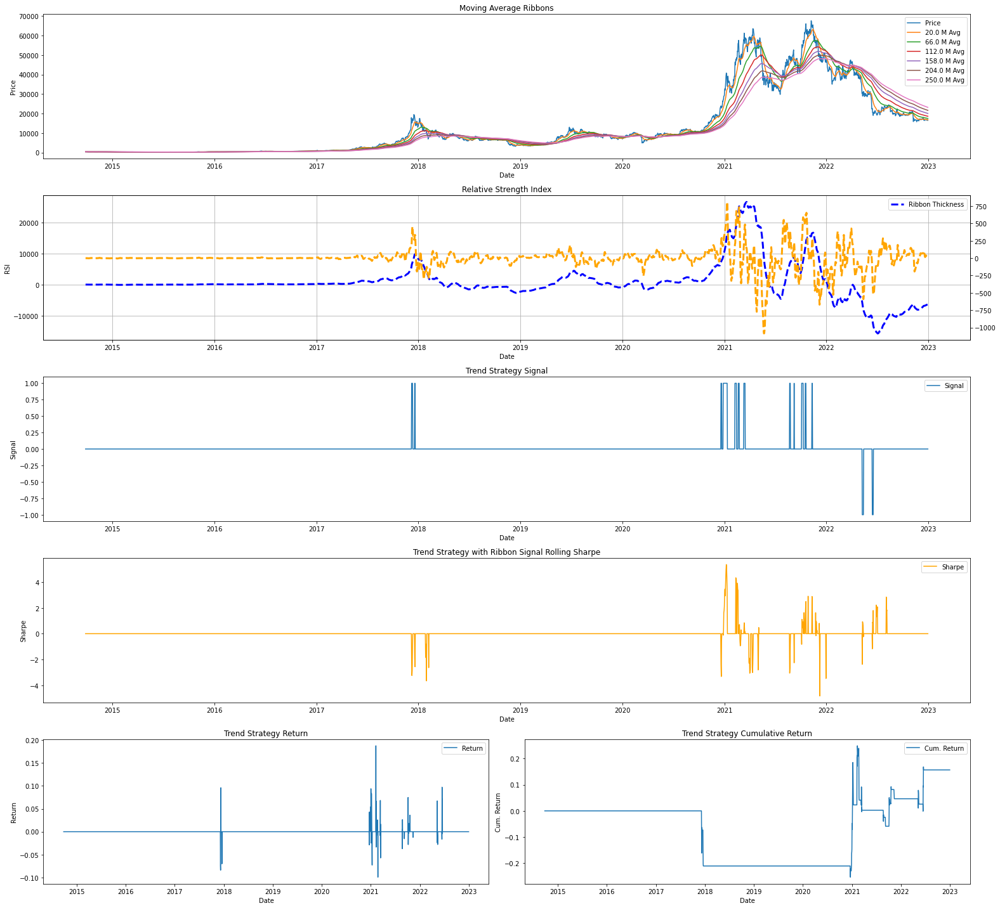

In [95]:
fig = plt.figure(figsize=(22,20))
# plt.style.use('bmh')
layout = (5,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_ribbon_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

trend_ribbon_ax2 = trend_ribbon_ax.twinx()
_ = trend_ribbon_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', linewidth=3, color='blue')
_ = trend_ribbon_ax2.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_ribbon_thickness_slope'], label='Ribbon Thickness Slope', linestyle='--', linewidth=3, color='orange')
# _ = trend_ribbon_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_ribbon_thickness'].rolling(100).mean(), label='Ribbon Thickness', linestyle='--', linewidth=3)

_ = trend_ribbon_ax.set_title(f'Relative Strength Index')
_ = trend_ribbon_ax.set_ylabel('RSI')
_ = trend_ribbon_ax.set_xlabel('Date')
_ = trend_ribbon_ax.legend()
_ = trend_ribbon_ax.grid()

_ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_sharpe_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_rolling_sharpe_{rolling_sharpe_window}'], label='Sharpe', color='orange')
# _ = trend_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_sharpe_ax.set_title(f'Trend Strategy with Ribbon Signal Rolling Sharpe')
_ = trend_sharpe_ax.set_ylabel('Sharpe')
_ = trend_sharpe_ax.set_xlabel('Date')
_ = trend_sharpe_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg.index,
                         df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_ribbon_thickness_slope_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg.index, df_trend_mavg['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

## Moving Average Crossover Strategy with Donchian Channel and Ribbon as a Signal

In [96]:
fast_mavg = 20
slow_mavg = 250
mavg_stepsize = 6
ticker = 'BTC-USD'
moving_avg_type = 'exponential'
price_or_returns_calc = 'price'
rolling_donchian_window = 20
data = get_close_prices(start_date, end_date, ticker, print_status=False)
df_trend_mavg = (create_trend_strategy(data, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                       price_or_returns_calc=price_or_returns_calc)
                 .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                                  f'{ticker}_trend_strategy_trades': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'}))
df_trend_mavg_donchian = generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                     mavg_stepsize=mavg_stepsize, price_or_returns_calc=price_or_returns_calc, rolling_donchian_window=rolling_donchian_window,
                                                                     include_signal_strength=False)
# df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
#     df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
#     strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades', include_transaction_costs_and_fees=True))

In [97]:
calculate_risk_and_performance_metrics(
    df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_strategy_trades')

{'annualized_return': 1.889622180242052,
 'annualized_sharpe_ratio': 2.9860488305787003,
 'calmar_ratio': 9.270933953722228,
 'annualized_std_dev': 0.265637893284701,
 'max_drawdown': -0.20382220277638582,
 'max_drawdown_duration': Timedelta('265 days 00:00:00'),
 'hit_rate': 0.10801855533465872,
 't_statistic': 10.967406570762003,
 'p_value': 1.797411985443557e-27,
 'trade_count': 308.0}

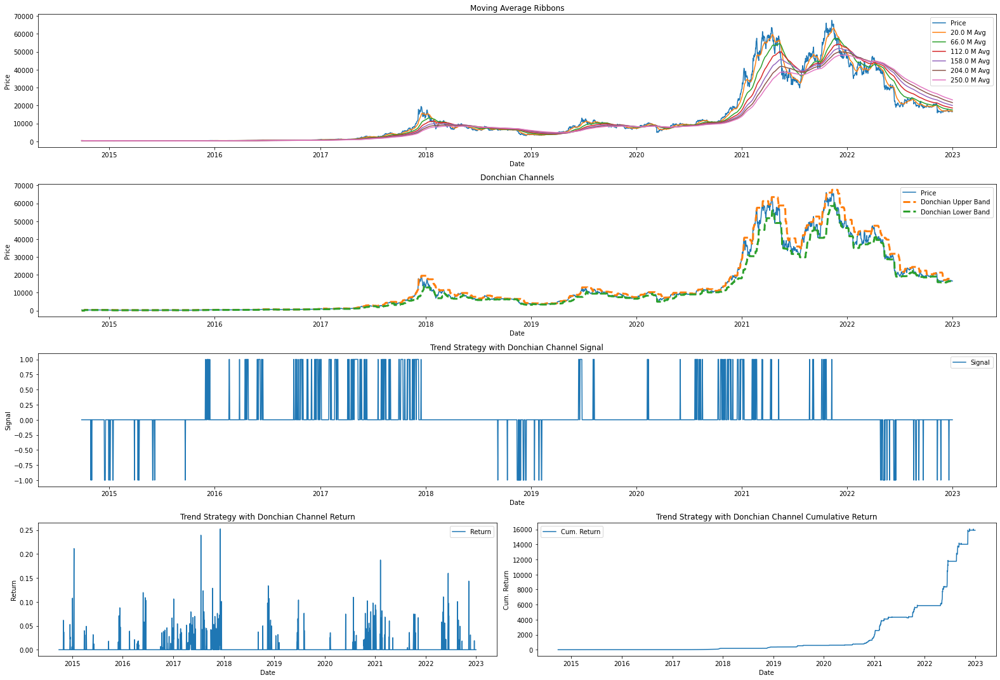

In [98]:
fig = plt.figure(figsize=(22,15))
# plt.style.use('bmh')
layout = (4,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (3,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (3,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

if price_or_returns_calc == 'price':
    _ = trend_donchian_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_donchian_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
_ = trend_donchian_ax.plot(df_trend_mavg_donchian.index,
                  df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
_ = trend_donchian_ax.plot(df_trend_mavg_donchian.index,
                  df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

_ = trend_donchian_ax.set_title(f'Donchian Channels')
_ = trend_donchian_ax.set_ylabel('Price')
_ = trend_donchian_ax.set_xlabel('Date')
_ = trend_donchian_ax.legend()

_ = trend_signal_ax.plot(df_trend_mavg_donchian.index,
                         df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy with Donchian Channel Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg_donchian.index,
                         df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy with Donchian Channel Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy with Donchian Channel Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

In [99]:
# Moving Average and Donchian Channel Signal
rolling_donchian_window = 20
buy_signal = ((df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
              (df_trend_mavg_donchian[f'{ticker}_trend_signal'] == 1) &
             ((df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'] > 2000) &
              (df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'] > df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'].shift(1)) &
              (df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'].shift(1) > df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'].shift(2))))
sell_signal = ((df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
               (df_trend_mavg_donchian[f'{ticker}_trend_signal'] == -1) &
              ((df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'] < -2000) &
              (df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'] < df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'].shift(1)) &
              (df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'].shift(1) < df_trend_mavg_donchian[f'{ticker}_ribbon_thickness'].shift(2))))

In [100]:
df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon'] = np.where(buy_signal, 1, np.where(sell_signal, -1, 0))
df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon_strategy_returns'] = (
df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon'] * df_trend_mavg_donchian[f'{ticker}_pct_returns'])
df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon_strategy_trades'] = (
df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon']).diff()
df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_signal_with_ribbon_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon_strategy_trades', include_transaction_costs_and_fees=True))

In [101]:
df_trend_mavg.head()

,BTC-USD,BTC-USD_pct_returns,BTC-USD_20_mavg,BTC-USD_20_mavg_slope,BTC-USD_66_mavg,BTC-USD_66_mavg_slope,BTC-USD_112_mavg,BTC-USD_112_mavg_slope,BTC-USD_158_mavg,BTC-USD_158_mavg_slope,BTC-USD_204_mavg,BTC-USD_204_mavg_slope,BTC-USD_250_mavg,BTC-USD_250_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_volatility_10,BTC-USD_volatility_20,BTC-USD_volatility_30,BTC-USD_volatility_60,BTC-USD_volatility_90,BTC-USD_trend_signal,BTC-USD_20_6_250_trend_strategy_returns,BTC-USD_20_6_250_trend_strategy_trades,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades
Date,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-09-27,399.519989,-0.012128,412.544342,-4.478967,413.955713,-4.337830,414.228946,-4.310507,414.345093,-4.298892,414.409368,-4.292465,414.450177,-4.288384,-1.297789,0.046535,NaN,NaN,NaN,NaN,-1.0,0.012128,0.0,0.0,-0.000000,0.0
2014-09-28,377.181000,-0.055915,407.726859,-3.233780,410.355053,-3.028276,410.829461,-2.991070,411.027952,-2.975496,411.137001,-2.966939,411.205944,-2.961528,-1.905836,0.044492,NaN,NaN,NaN,NaN,-1.0,0.055915,0.0,-1.0,0.055915,-1.0
2014-09-29,375.467010,-0.004544,403.505205,-1.993707,407.156795,-1.773506,407.808377,-1.734278,408.079951,-1.717954,408.228867,-1.709012,408.322909,-1.703367,-3.479086,0.039370,NaN,NaN,NaN,NaN,-1.0,0.004544,0.0,-1.0,0.004544,0.0
2014-09-30,386.944000,0.030567,401.412494,-1.783280,405.411729,-1.529967,406.138967,-1.484096,406.442900,-1.464976,406.609744,-1.454494,406.715172,-1.447877,-4.817704,0.038816,NaN,NaN,NaN,NaN,-1.0,-0.030567,0.0,-1.0,-0.030567,0.0
2014-10-01,383.614990,-0.008603,399.231444,-1.507339,403.630523,-1.243350,404.442481,-1.194598,404.782519,-1.174233,404.969333,-1.163061,405.087430,-1.156005,-5.302678,0.038233,NaN,NaN,NaN,NaN,-1.0,0.008603,0.0,-1.0,0.008603,0.0


In [102]:
df_trend_mavg_donchian.head()

,BTC-USD,BTC-USD_pct_returns,BTC-USD_20_mavg,BTC-USD_20_mavg_slope,BTC-USD_66_mavg,BTC-USD_66_mavg_slope,BTC-USD_112_mavg,BTC-USD_112_mavg_slope,BTC-USD_158_mavg,BTC-USD_158_mavg_slope,BTC-USD_204_mavg,BTC-USD_204_mavg_slope,BTC-USD_250_mavg,BTC-USD_250_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_volatility_10,BTC-USD_volatility_20,BTC-USD_volatility_30,BTC-USD_volatility_60,BTC-USD_volatility_90,BTC-USD_trend_signal,BTC-USD_trend_strategy_returns_20_6_250,BTC-USD_trend_strategy_trades_20_6_250,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,BTC-USD_20_donchian_upper_band_price,BTC-USD_20_donchian_lower_band_price,BTC-USD_20_donchian_middle_band_price,BTC-USD_20_donchian_signal,BTC-USD_20_6_250_mavg_crossover_20_donchian_signal,BTC-USD_20_6_250_mavg_crossover_20_donchian_strategy_returns,BTC-USD_20_6_250_mavg_crossover_20_donchian_strategy_trades,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade,BTC-USD_20_6_250_mavg_crossover_20_donchian_signal_with_ribbon,BTC-USD_20_6_250_mavg_crossover_20_donchian_signal_with_ribbon_strategy_returns,BTC-USD_20_6_250_mavg_crossover_20_donchian_signal_with_ribbon_strategy_trades,BTC-USD_20_6_250_mavg_crossover_20_donchian_signal_with_ribbon_strategy_returns_cum
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-09-27,399.519989,-0.012128,412.544342,-4.478967,413.955713,-4.337830,414.228946,-4.310507,414.345093,-4.298892,414.409368,-4.292465,414.450177,-4.288384,-1.297789,0.046535,0.0,0.0,0.0,0.0,-1.0,0.012128,0.0,0.0,-0.000000,0.0,0.0,0.0,0.0,0,0,-0.0,0.0,0.0,0.0,0.0,0.0,2014-09-27,1,31 days,False,0,-0.0,NaN,236.973891
2014-09-28,377.181000,-0.055915,407.726859,-3.233780,410.355053,-3.028276,410.829461,-2.991070,411.027952,-2.975496,411.137001,-2.966939,411.205944,-2.961528,-1.905836,0.044492,0.0,0.0,0.0,0.0,-1.0,0.055915,0.0,-1.0,0.055915,-1.0,0.0,0.0,0.0,0,0,-0.0,0.0,0.0,0.0,0.0,0.0,2014-09-28,1,31 days,False,0,-0.0,0.0,236.973891
2014-09-29,375.467010,-0.004544,403.505205,-1.993707,407.156795,-1.773506,407.808377,-1.734278,408.079951,-1.717954,408.228867,-1.709012,408.322909,-1.703367,-3.479086,0.039370,0.0,0.0,0.0,0.0,-1.0,0.004544,0.0,-1.0,0.004544,0.0,0.0,0.0,0.0,0,0,-0.0,0.0,0.0,0.0,0.0,0.0,2014-09-29,1,31 days,False,0,-0.0,0.0,236.973891
2014-09-30,386.944000,0.030567,401.412494,-1.783280,405.411729,-1.529967,406.138967,-1.484096,406.442900,-1.464976,406.609744,-1.454494,406.715172,-1.447877,-4.817704,0.038816,0.0,0.0,0.0,0.0,-1.0,-0.030567,0.0,-1.0,-0.030567,0.0,0.0,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2014-09-30,1,31 days,False,0,0.0,0.0,236.973891
2014-10-01,383.614990,-0.008603,399.231444,-1.507339,403.630523,-1.243350,404.442481,-1.194598,404.782519,-1.174233,404.969333,-1.163061,405.087430,-1.156005,-5.302678,0.038233,0.0,0.0,0.0,0.0,-1.0,0.008603,0.0,-1.0,0.008603,0.0,0.0,0.0,0.0,0,0,-0.0,0.0,0.0,0.0,0.0,0.0,2014-10-01,1,31 days,False,0,-0.0,0.0,236.973891


In [103]:
print(df_trend_mavg_donchian.shape)
print(df_trend_mavg_donchian[df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_signal_with_ribbon_strategy_returns'] != 0].shape)
print(df_trend_mavg_donchian[df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_signal_with_ribbon_strategy_returns'] > 0].shape)
print(df_trend_mavg_donchian[df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_signal_with_ribbon_strategy_returns'] < 0].shape)

(3018, 45)
(128, 45)
(128, 45)
(0, 45)


In [104]:
calculate_risk_and_performance_metrics(
    df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_signal_with_ribbon_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_signal_with_ribbon_strategy_trades')

{'annualized_return': 0.5792025445076603,
 'annualized_sharpe_ratio': 1.8177486202925315,
 'calmar_ratio': 1.692615524910484,
 'annualized_std_dev': 0.18185622874172513,
 'max_drawdown': -0.34219380360362234,
 'max_drawdown_duration': Timedelta('1069 days 00:00:00'),
 'hit_rate': 0.0414181577203446,
 't_statistic': 7.217798761670596,
 'p_value': 6.655435481398043e-13,
 'trade_count': 114.0}

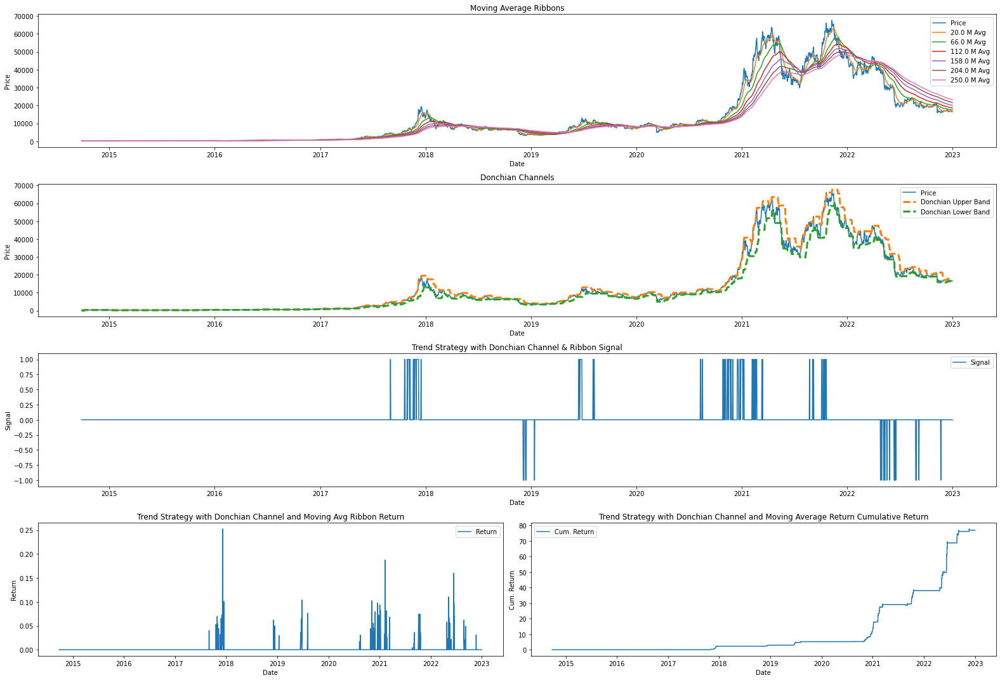

In [105]:
fig = plt.figure(figsize=(22,15))
# plt.style.use('bmh')
layout = (4,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (3,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (3,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

if price_or_returns_calc == 'price':
    _ = trend_donchian_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_donchian_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_pct_returns'], label='Returns')
_ = trend_donchian_ax.plot(df_trend_mavg_donchian.index,
                  df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
_ = trend_donchian_ax.plot(df_trend_mavg_donchian.index,
                  df_trend_mavg_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

_ = trend_donchian_ax.set_title(f'Donchian Channels')
_ = trend_donchian_ax.set_ylabel('Price')
_ = trend_donchian_ax.set_xlabel('Date')
_ = trend_donchian_ax.legend()

_ = trend_signal_ax.plot(df_trend_mavg_donchian.index,
                         df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy with Donchian Channel & Ribbon Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_return_ax.plot(df_trend_mavg_donchian.index,
                         df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal_with_ribbon_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy with Donchian Channel and Moving Avg Ribbon Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy with Donchian Channel and Moving Average Return Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

## Volume Oscillator

In [106]:
from strategy_performance_metrics import calculate_risk_and_performance_metrics
from trend_following import trend_signal
import seaborn as sns

def plot_moving_avg_crossover_performance(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

def generate_volume_oscillator_signal(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='simple'):

    df = load_financial_data(start_date, end_date, ticker, print_status=False)
    df.columns = ['open','high','low','close','adjclose','volume']
    df.columns = [f'{ticker}_{x}' for x in df.columns]
    df[f'{ticker}_pct_returns'] = df[f'{ticker}_adjclose'].pct_change()

    for window in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
        if moving_avg_type == 'simple':
            df[f'{ticker}_volume_{int(window)}_mavg'] = df[f'{ticker}_volume'].rolling(int(window)).mean()
        elif moving_avg_type == 'exponential':
            df[f'{ticker}_volume_{int(window)}_mavg'] = df[f'{ticker}_volume'].ewm(span=window).mean()

    ## Ticker Trend Signal and Trade
    mavg_col_list = [f'{ticker}_volume_{int(mavg)}_mavg' for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize).tolist()]
    df[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_signal'] = df[mavg_col_list].apply(trend_signal, axis=1).shift(1)
    df[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns'] = df[f'{ticker}_pct_returns'] * df[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_signal']
    df[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades'] = df[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_signal'].diff()

    ## Drop all null values
    df = df[df[f'{ticker}_volume_{slow_mavg}_mavg'].notnull()]

    return df

def volume_osicillator_strategy_performance(start_date, end_date, ticker, moving_avg_type='exponential'):
    
    perf_cols = ['ticker', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
                'hit_rate', 't_statistic', 'p_value', 'trade_count']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    fast_mavg_list = np.arange(10, 101, 10)
    slow_mavg_list = np.arange(50, 501, 50)
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for mavg_stepsize in mavg_stepsize_list:
                if fast_mavg < slow_mavg:
                    df_trend = generate_volume_oscillator_signal(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type)
                    performance_metrics = calculate_risk_and_performance_metrics(
                        df_trend, strategy_daily_return_col=f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
                        strategy_trade_count_col=f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades',
                        annual_trading_days=365)
                    row = {
                        'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': mavg_stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio'],
                        'annualized_std_dev': performance_metrics['annualized_std_dev'],
                        'max_drawdown': performance_metrics['max_drawdown'],
                        'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                        'hit_rate': performance_metrics['hit_rate'],
                        't_statistic': performance_metrics['t_statistic'],
                        'p_value': performance_metrics['p_value'],
                        'trade_count': performance_metrics['trade_count']
                    }
                    df_performance = df_performance.append(row, ignore_index=True)
    
    plot_moving_avg_crossover_performance(df_performance)
    
    return df_performance

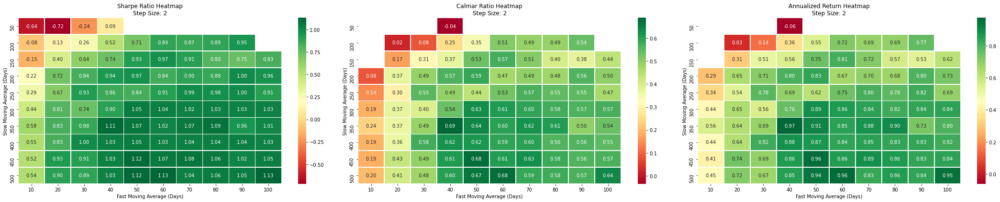

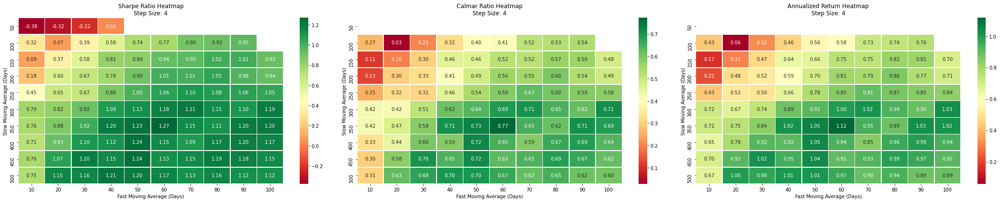

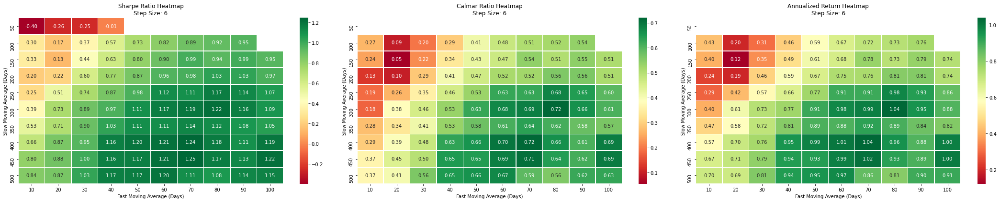

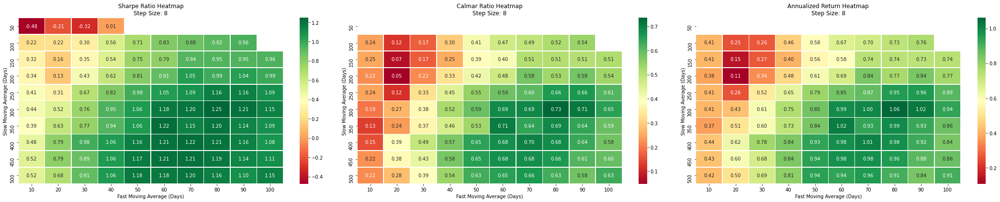

In [107]:
df_volume_oscillator_exp = volume_osicillator_strategy_performance(start_date, end_date, ticker)

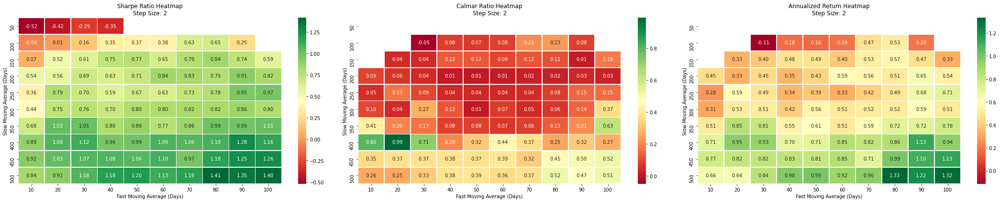

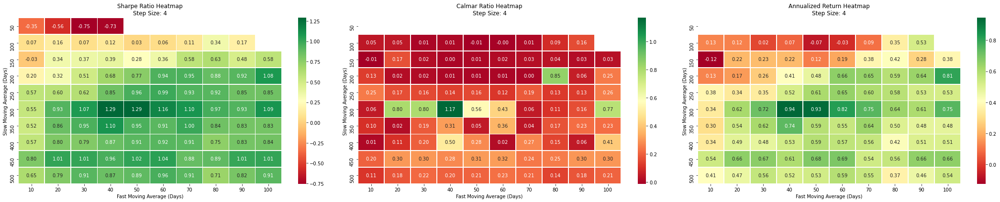

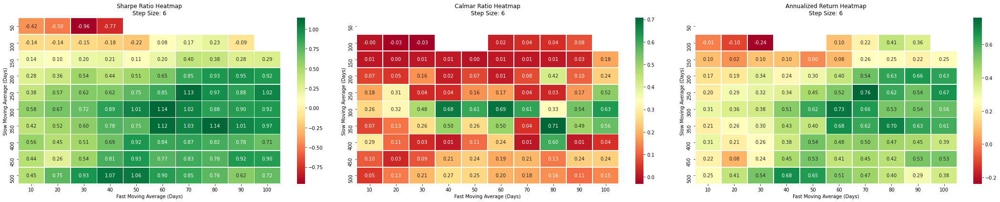

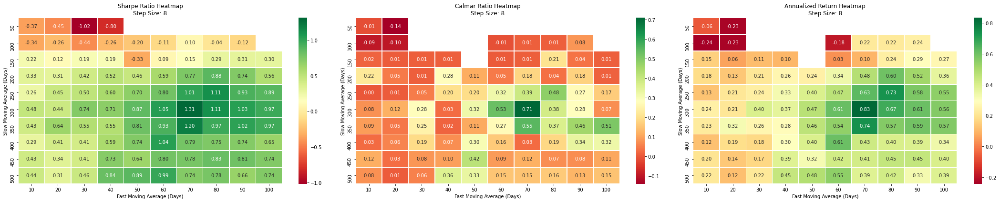

In [108]:
df_volume_oscillator_simple = volume_osicillator_strategy_performance(start_date, end_date, ticker, moving_avg_type='simple')

In [109]:
fast_mavg = 70
mavg_stepsize = 6
slow_mavg = 450
df_volume_trend = generate_volume_oscillator_signal(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, moving_avg_type='exponential')

In [110]:
df_volume_trend.head(20)

,BTC-USD_open,BTC-USD_high,BTC-USD_low,BTC-USD_close,BTC-USD_adjclose,BTC-USD_volume,BTC-USD_pct_returns,BTC-USD_volume_70_mavg,BTC-USD_volume_146_mavg,BTC-USD_volume_222_mavg,BTC-USD_volume_298_mavg,BTC-USD_volume_374_mavg,BTC-USD_volume_450_mavg,BTC-USD_volume_70_6_450_trend_signal,BTC-USD_volume_70_6_450_trend_strategy_returns,BTC-USD_volume_70_6_450_trend_strategy_trades
Date,,,,,,,,,,,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,NaN,2.105680e+07,2.105680e+07,2.105680e+07,2.105680e+07,2.105680e+07,2.105680e+07,NaN,NaN,NaN
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,-0.071926,2.786590e+07,2.781598e+07,2.780024e+07,2.779253e+07,2.778795e+07,2.778492e+07,-1.0,0.071926,NaN
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,-0.069843,3.131337e+07,3.123013e+07,3.120383e+07,3.119093e+07,3.118328e+07,3.117820e+07,1.0,-0.069843,2.0
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,0.035735,3.276095e+07,3.266757e+07,3.263795e+07,3.262341e+07,3.261477e+07,3.260904e+07,1.0,0.035735,0.0
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,-0.024659,3.145315e+07,3.141649e+07,3.140445e+07,3.139847e+07,3.139489e+07,3.139251e+07,1.0,-0.024659,0.0
2014-09-22,399.100006,406.915985,397.130005,402.152008,402.152008,24127600,0.008352,3.014338e+07,3.015969e+07,3.016416e+07,3.016623e+07,3.016743e+07,3.016820e+07,1.0,0.008352,0.0
2014-09-23,402.092010,441.557007,396.196991,435.790985,435.790985,45099500,0.083647,3.246740e+07,3.238266e+07,3.235588e+07,3.234275e+07,3.233495e+07,3.232979e+07,-1.0,-0.083647,-2.0
2014-09-24,435.751007,436.112000,421.131989,423.204987,423.204987,30627700,-0.028881,3.221379e+07,3.215263e+07,3.213298e+07,3.212330e+07,3.211753e+07,3.211370e+07,1.0,-0.028881,2.0
2014-09-25,423.156006,423.519989,409.467987,411.574005,411.574005,26814400,-0.027483,3.154305e+07,3.152647e+07,3.152051e+07,3.151746e+07,3.151561e+07,3.151437e+07,1.0,-0.027483,0.0


In [111]:
calculate_risk_and_performance_metrics(
    df_volume_trend, strategy_daily_return_col=f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
    strategy_trade_count_col=f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades')

{'annualized_return': 0.6253230632131639,
 'annualized_sharpe_ratio': 1.0064261745944498,
 'calmar_ratio': 0.43314782236615207,
 'annualized_std_dev': 0.5288355494134289,
 'max_drawdown': -3.7350354191307824,
 'max_drawdown_duration': Timedelta('627 days 00:00:00'),
 'hit_rate': 0.36393659180977544,
 't_statistic': 3.8438604574080886,
 'p_value': 0.0001236042336285428,
 'trade_count': 48.0}

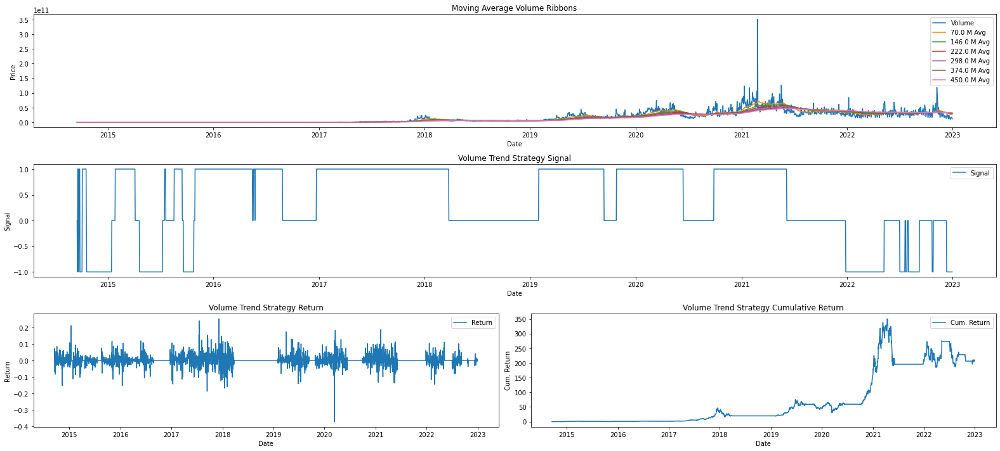

In [112]:
fig = plt.figure(figsize=(22,10))
# plt.style.use('bmh')
layout = (3,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (2,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (2,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

_ = trend_ax.plot(df_volume_trend.index, df_volume_trend[f'{ticker}_volume'], label='Volume')
for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
    _ = trend_ax.plot(df_volume_trend.index, df_volume_trend[f'{ticker}_volume_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Volume Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

_ = trend_signal_ax.plot(df_volume_trend.index, df_volume_trend[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg.index, df_trend_mavg['BTC-USD_20_atr_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Volume Trend Strategy Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_return_ax.plot(df_volume_trend.index, df_volume_trend[f'{ticker}_volume_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns'], label='Return')
_ = trend_return_ax.set_title(f'Volume Trend Strategy Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg.index, df_trend_mavg[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_volume_trend.index, df_volume_trend['strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Volume Trend Strategy Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

## Moving Average Crossover, Donchian Channels & Volume Oscillator Signals

In [113]:
from strategy_performance_metrics import calculate_risk_and_performance_metrics

import seaborn as sns

def plot_moving_avg_crossover_performance(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

def generate_trend_donchian_volume_oscillator_signal(start_date, end_date, ticker, price_fast_mavg, price_slow_mavg, price_mavg_stepsize, price_moving_avg_type='exponential', price_or_returns_calc='price',
                                                     rolling_donchian_window=20, volume_fast_mavg=70, volume_slow_mavg=450, volume_mavg_stepsize=6, volume_moving_avg_type='exponential'):
    
    # Generate Trend Signal
    df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df_trend = (create_trend_strategy(df, ticker, mavg_start=price_fast_mavg, mavg_end=price_slow_mavg, mavg_stepsize=price_mavg_stepsize, slope_window=10, moving_avg_type=price_moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}',
                                 f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}'}))
    # Generate Donchian Signal
    df_donchian = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                            rolling_donchian_window=rolling_donchian_window)
    if price_or_returns_calc == 'price':

        # Buy signal: Price crosses above upper band
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'adjclose'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price']), 1,
            np.where((df_donchian[f'adjclose'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price']), -1, 0))
    elif price_or_returns_calc == 'returns':
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'{ticker}_pct_returns'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_returns']), 1,
            np.where((df_donchian[f'{ticker}_pct_returns'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_returns']), -1, 0))

    # Generate Volume Oscillator Signal
    df_volume_osc = generate_volume_oscillator_signal(start_date, end_date, ticker, fast_mavg=volume_fast_mavg, slow_mavg=volume_slow_mavg, mavg_stepsize=volume_mavg_stepsize,
                                                      moving_avg_type=volume_moving_avg_type)
    
    # Merging the Trend and donchian Dataframes
    donchian_cols = [f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}',
                     f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_signal']
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')
    volume_oscillator_cols = [f'{ticker}_volume_{int(mavg)}_mavg' for mavg in np.linspace(volume_fast_mavg, volume_slow_mavg, volume_mavg_stepsize).tolist()]
    volume_oscillator_cols.extend([f'{ticker}_volume_{volume_fast_mavg}_{volume_mavg_stepsize}_{volume_slow_mavg}_trend_signal', f'{ticker}_volume'])
    df_trend = pd.merge(df_trend, df_volume_osc[volume_oscillator_cols], left_index=True, right_index=True, how='left')
    
    # Moving Average and Donchian Channel Signal
    long_trend_signal = (df_trend[f'{ticker}_trend_signal'] == 1)
    long_donchian_signal = (df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1)
    long_volume_osc_signal = (df_trend[f'{ticker}_volume_{volume_fast_mavg}_{volume_mavg_stepsize}_{volume_slow_mavg}_trend_signal'] == 1)
    short_trend_signal = (df_trend[f'{ticker}_trend_signal'] == -1)
    short_donchian_signal = (df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1)
    short_volume_osc_signal = (df_trend[f'{ticker}_volume_{volume_fast_mavg}_{volume_mavg_stepsize}_{volume_slow_mavg}_trend_signal'] == -1)
    
    buy_signal = (long_trend_signal & long_donchian_signal & long_volume_osc_signal)
    sell_signal = (short_trend_signal & short_donchian_signal & short_volume_osc_signal)
    df_trend[f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_signal'] = (
        np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
    df_trend[f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_returns'] = (
        df_trend[(f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_signal')] * 
        df_trend[f'{ticker}_pct_returns'])
    df_trend[f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_trades'] = (
        df_trend[(f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_signal')].diff())
    
    return df_trend

def moving_avg_crossover_donchian_volume_osc_strategy_performance(start_date, end_date, ticker, price_moving_avg_type='exponential', price_or_returns_calc='price',
                                                                  rolling_donchian_window=20, volume_fast_mavg=70, volume_slow_mavg=450, volume_mavg_stepsize=6,
                                                                  volume_moving_avg_type='exponential'):
    
    perf_cols = ['ticker', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
                'hit_rate', 't_statistic', 'p_value', 'trade_count']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    fast_mavg_list = np.arange(10, 101, 10)
    slow_mavg_list = np.arange(50, 501, 50)
    mavg_stepsize_list = [2, 4, 6, 8]
    for price_slow_mavg in slow_mavg_list:
        for price_fast_mavg in fast_mavg_list:
            for price_mavg_stepsize in mavg_stepsize_list:
                if price_fast_mavg < price_slow_mavg:
                    df_trend = generate_trend_donchian_volume_oscillator_signal(start_date, end_date, ticker, price_fast_mavg, price_slow_mavg, price_mavg_stepsize, price_moving_avg_type, price_or_returns_calc,
                                                                                rolling_donchian_window, volume_fast_mavg, volume_slow_mavg, volume_mavg_stepsize, volume_moving_avg_type)
                    performance_metrics = calculate_risk_and_performance_metrics(
                        df_trend, strategy_daily_return_col=f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_returns',
                        strategy_trade_count_col=f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_trades',
                        annual_trading_days=365)
                    row = {
                        'ticker': ticker,
                        'fast_mavg': price_fast_mavg,
                        'slow_mavg': price_slow_mavg,
                        'stepsize': price_mavg_stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio'],
                        'annualized_std_dev': performance_metrics['annualized_std_dev'],
                        'max_drawdown': performance_metrics['max_drawdown'],
                        'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                        'hit_rate': performance_metrics['hit_rate'],
                        't_statistic': performance_metrics['t_statistic'],
                        'p_value': performance_metrics['p_value'],
                        'trade_count': performance_metrics['trade_count']
                    }
                    df_performance = df_performance.append(row, ignore_index=True)
    
    plot_moving_avg_crossover_performance(df_performance)
    
    return df_performance

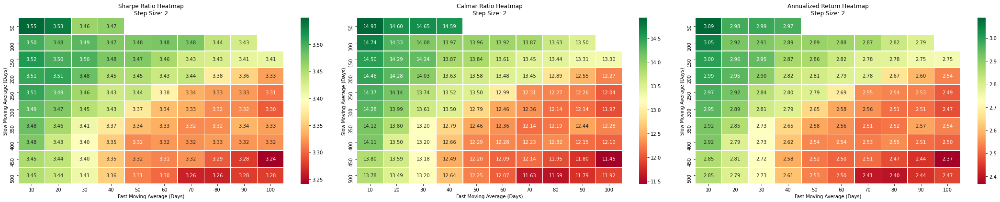

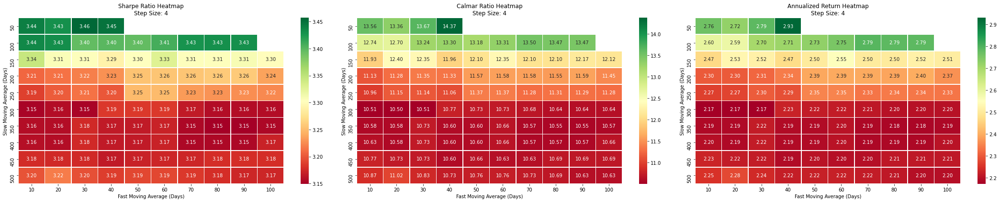

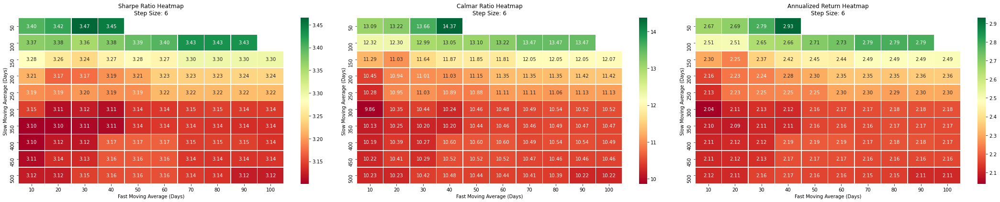

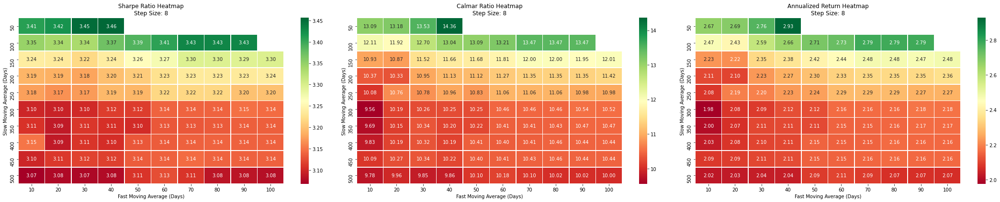

In [114]:
df_mavg_crossover_donchian_volume_osc_perf = moving_avg_crossover_donchian_volume_osc_strategy_performance(start_date, end_date, ticker)

In [115]:
price_fast_mavg = 20
price_slow_mavg = 250
price_mavg_stepsize = 6
price_moving_avg_type = 'exponential'
price_or_returns_calc = 'price'
rolling_donchian_window = 20
volume_fast_mavg = 70
volume_slow_mavg = 450
volume_mavg_stepsize = 6
volume_moving_avg_type = 'exponential'
df_trend_donchian_vol_osc = generate_trend_donchian_volume_oscillator_signal(start_date, end_date, ticker, price_fast_mavg, price_slow_mavg, price_mavg_stepsize, price_moving_avg_type, price_or_returns_calc,
                                                                             rolling_donchian_window, volume_fast_mavg, volume_slow_mavg, volume_mavg_stepsize, volume_moving_avg_type)

In [118]:
df_trend_donchian_vol_osc[f'rolling_sharpe_{rolling_sharpe_window}'] = (rolling_sharpe_ratio(df_trend_donchian_vol_osc, window=rolling_sharpe_window, 
                                                                                             strategy_daily_return_col=f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_returns',
                                                                                             strategy_trade_count_col=f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_trades'))
df_trend_donchian_vol_osc = df_trend_donchian_vol_osc.rename(
    columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_rolling_sharpe_{rolling_sharpe_window}'})

In [119]:
df_trend_donchian_vol_osc.head(20)

,BTC-USD,BTC-USD_pct_returns,BTC-USD_20_mavg,BTC-USD_20_mavg_slope,BTC-USD_66_mavg,BTC-USD_66_mavg_slope,BTC-USD_112_mavg,BTC-USD_112_mavg_slope,BTC-USD_158_mavg,BTC-USD_158_mavg_slope,BTC-USD_204_mavg,BTC-USD_204_mavg_slope,BTC-USD_250_mavg,BTC-USD_250_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_volatility_10,BTC-USD_volatility_20,BTC-USD_volatility_30,BTC-USD_volatility_60,BTC-USD_volatility_90,BTC-USD_trend_signal,BTC-USD_trend_strategy_returns_20_6_250,BTC-USD_trend_strategy_trades_20_6_250,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,BTC-USD_20_donchian_upper_band_price,BTC-USD_20_donchian_lower_band_price,BTC-USD_20_donchian_middle_band_price,BTC-USD_20_donchian_signal,BTC-USD_volume_70_mavg,BTC-USD_volume_146_mavg,BTC-USD_volume_222_mavg,BTC-USD_volume_298_mavg,BTC-USD_volume_374_mavg,BTC-USD_volume_450_mavg,BTC-USD_volume_70_6_450_trend_signal,BTC-USD_volume,BTC-USD_20_6_250_mavg_crossover_20_donchian_volume_osc_signal,BTC-USD_20_6_250_mavg_crossover_20_donchian_volume_osc_strategy_returns,BTC-USD_20_6_250_mavg_crossover_20_donchian_volume_osc_strategy_trades,BTC-USD_20_6_250_mavg_crossover_20_donchian_volume_osc_strategy_rolling_sharpe_50
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-09-27,399.519989,-0.012128,412.544342,-4.478967,413.955713,-4.337830,414.228946,-4.310507,414.345093,-4.298892,414.409368,-4.292465,414.450177,-4.288384,-1.297789,0.046535,NaN,NaN,NaN,NaN,-1.0,0.012128,0.0,0.0,-0.000000,0.0,NaN,NaN,NaN,0,2.879493e+07,2.895622e+07,2.900518e+07,2.902883e+07,2.904276e+07,2.905194e+07,-1.0,15029300,0,-0.0,NaN,NaN
2014-09-28,377.181000,-0.055915,407.726859,-3.233780,410.355053,-3.028276,410.829461,-2.991070,411.027952,-2.975496,411.137001,-2.966939,411.205944,-2.961528,-1.905836,0.044492,NaN,NaN,NaN,NaN,-1.0,0.055915,0.0,-1.0,0.055915,-1.0,NaN,NaN,NaN,0,2.829209e+07,2.847667e+07,2.853326e+07,2.856069e+07,2.857688e+07,2.858756e+07,-1.0,23613300,0,-0.0,0.0,NaN
2014-09-29,375.467010,-0.004544,403.505205,-1.993707,407.156795,-1.773506,407.808377,-1.734278,408.079951,-1.717954,408.228867,-1.709012,408.322909,-1.703367,-3.479086,0.039370,NaN,NaN,NaN,NaN,-1.0,0.004544,0.0,-1.0,0.004544,0.0,NaN,NaN,NaN,0,2.867391e+07,2.881203e+07,2.885497e+07,2.887588e+07,2.888825e+07,2.889643e+07,-1.0,32497700,0,-0.0,0.0,NaN
2014-09-30,386.944000,0.030567,401.412494,-1.783280,405.411729,-1.529967,406.138967,-1.484096,406.442900,-1.464976,406.609744,-1.454494,406.715172,-1.447877,-4.817704,0.038816,NaN,NaN,NaN,NaN,-1.0,-0.030567,0.0,-1.0,-0.030567,0.0,NaN,NaN,NaN,0,2.918940e+07,2.927164e+07,2.929791e+07,2.931083e+07,2.931850e+07,2.932359e+07,-1.0,34707300,0,0.0,0.0,NaN
2014-10-01,383.614990,-0.008603,399.231444,-1.507339,403.630523,-1.243350,404.442481,-1.194598,404.782519,-1.174233,404.969333,-1.163061,405.087430,-1.156005,-5.302678,0.038233,NaN,NaN,NaN,NaN,-1.0,0.008603,0.0,-1.0,0.008603,0.0,NaN,NaN,NaN,0,2.895020e+07,2.904880e+07,2.908019e+07,2.909561e+07,2.910476e+07,2.911083e+07,-1.0,26229400,0,-0.0,0.0,NaN
2014-10-02,375.071991,-0.022270,396.349457,-1.539169,401.411831,-1.215438,402.350842,-1.155770,402.744152,-1.130878,402.960227,-1.117232,403.096816,-1.108618,-5.855986,0.038427,NaN,NaN,NaN,NaN,-1.0,0.022270,0.0,-1.0,0.022270,0.0,NaN,NaN,NaN,0,2.839957e+07,2.854619e+07,2.859231e+07,2.861486e+07,2.862822e+07,2.863707e+07,-1.0,21777700,0,-0.0,0.0,NaN
2014-10-03,359.511993,-0.041485,392.058319,-2.423006,398.305274,-1.873171,399.455019,-1.774953,399.935467,-1.734207,400.199109,-1.711925,400.365651,-1.697877,-6.747358,0.023267,NaN,NaN,NaN,NaN,-1.0,0.041485,0.0,-1.0,0.041485,0.0,NaN,NaN,NaN,0,2.858272e+07,2.870042e+07,2.873813e+07,2.875669e+07,2.876773e+07,2.877504e+07,-1.0,30901200,0,-0.0,0.0,NaN
2014-10-04,328.865997,-0.085243,384.850316,-3.263363,393.375237,-2.451696,394.910125,-2.309218,395.548111,-2.250359,395.897326,-2.218235,396.117601,-2.198007,-8.307333,0.031387,NaN,NaN,NaN,NaN,-1.0,0.085243,0.0,-1.0,0.085243,0.0,NaN,NaN,NaN,0,2.988953e+07,2.985445e+07,2.984640e+07

In [120]:
calculate_risk_and_performance_metrics(
    df_trend_donchian_vol_osc, strategy_daily_return_col=f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_trades', annual_trading_days=365)

{'annualized_return': 2.231572875290462,
 'annualized_sharpe_ratio': 3.1871757304120476,
 'calmar_ratio': 10.948625051112463,
 'annualized_std_dev': 0.2866676416298409,
 'max_drawdown': -0.20382220277638582,
 'max_drawdown_duration': Timedelta('546 days 00:00:00'),
 'hit_rate': 0.08084824387011266,
 't_statistic': 9.65242873996566,
 'p_value': 9.86191202245669e-22,
 'trade_count': 210.0}

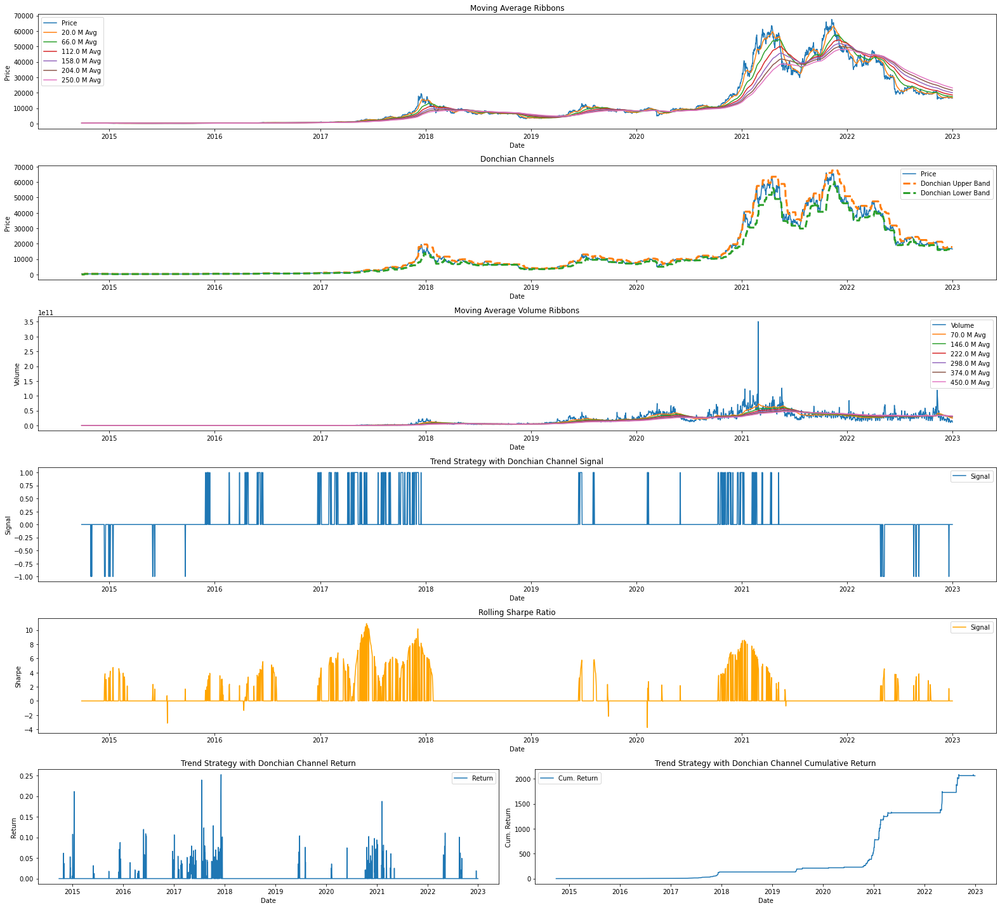

In [128]:
fig = plt.figure(figsize=(22,20))
# plt.style.use('bmh')
layout = (6,2)
trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
trend_volume_osc_ax = plt.subplot2grid(layout, (2,0), colspan=2)
trend_signal_ax = plt.subplot2grid(layout, (3,0), colspan=2)
trend_sharpe_ax = plt.subplot2grid(layout, (4,0), colspan=2)
trend_return_ax = plt.subplot2grid(layout, (5,0))#, colspan=2)
trend_cum_return_ax = plt.subplot2grid(layout, (5,1))#, colspan=2)
# trend_cum_return_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
# return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

if price_or_returns_calc == 'price':
    _ = trend_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}_pct_returns'], label='Returns')
for mavg in np.linspace(price_fast_mavg, price_slow_mavg, price_mavg_stepsize):
    _ = trend_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_ax.set_title(f'Moving Average Ribbons')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend()

if price_or_returns_calc == 'price':
    _ = trend_donchian_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}'], label='Price')
elif price_or_returns_calc == 'returns':
    _ = trend_donchian_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}_pct_returns'], label='Returns')
_ = trend_donchian_ax.plot(df_trend_donchian_vol_osc.index,
                  df_trend_donchian_vol_osc[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
_ = trend_donchian_ax.plot(df_trend_donchian_vol_osc.index,
                  df_trend_donchian_vol_osc[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

_ = trend_donchian_ax.set_title(f'Donchian Channels')
_ = trend_donchian_ax.set_ylabel('Price')
_ = trend_donchian_ax.set_xlabel('Date')
_ = trend_donchian_ax.legend()

_ = trend_volume_osc_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}_volume'], label='Volume')
for mavg in np.linspace(volume_fast_mavg, volume_slow_mavg, volume_mavg_stepsize):
    _ = trend_volume_osc_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'{ticker}_volume_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

_ = trend_volume_osc_ax.set_title(f'Moving Average Volume Ribbons')
_ = trend_volume_osc_ax.set_ylabel('Volume')
_ = trend_volume_osc_ax.set_xlabel('Date')
_ = trend_volume_osc_ax.legend()

_ = trend_signal_ax.plot(df_trend_donchian_vol_osc.index,
                         df_trend_donchian_vol_osc[f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_signal'], label='Signal')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_signal_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_signal_ax.set_title(f'Trend Strategy with Donchian Channel Signal')
_ = trend_signal_ax.set_ylabel('Signal')
_ = trend_signal_ax.set_xlabel('Date')
_ = trend_signal_ax.legend()

_ = trend_sharpe_ax.plot(df_trend_donchian_vol_osc.index,
                         df_trend_donchian_vol_osc[f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                         label='Signal', color='orange')
# _ = trend_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_ema_price'].rolling(20).mean(), label='EMA Returns')
# _ = trend_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_upper_band_price'].rolling(20).mean(), label='Upper Band')
# _ = trend_sharpe_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian['BTC-USD_20_donchian_lower_band_price'].rolling(20).mean(), label='Lower Band')
_ = trend_sharpe_ax.set_title(f'Rolling Sharpe Ratio')
_ = trend_sharpe_ax.set_ylabel('Sharpe')
_ = trend_sharpe_ax.set_xlabel('Date')
_ = trend_sharpe_ax.legend()

_ = trend_return_ax.plot(df_trend_donchian_vol_osc.index,
                         df_trend_donchian_vol_osc[f'{ticker}_{price_fast_mavg}_{price_mavg_stepsize}_{price_slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_volume_osc_strategy_returns'],
                         label='Return')
_ = trend_return_ax.set_title(f'Trend Strategy with Donchian Channel Return')
_ = trend_return_ax.set_ylabel('Return')
_ = trend_return_ax.set_xlabel('Date')
_ = trend_return_ax.legend()

# _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
_ = trend_cum_return_ax.plot(df_trend_donchian_vol_osc.index, df_trend_donchian_vol_osc[f'strategy_cumulative_return'], label='Cum. Return')
_ = trend_cum_return_ax.set_title(f'Trend Strategy with Donchian Channel Cumulative Return')
_ = trend_cum_return_ax.set_ylabel('Cum. Return')
_ = trend_cum_return_ax.set_xlabel('Date')
_ = trend_cum_return_ax.legend()


plt.tight_layout()

## On-Balance Volume Indicator

In [130]:
def calculate_on_balance_volume(start_date, end_date, ticker):
    
    df = load_financial_data(start_date, end_date, ticker, print_status=False)
    df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']
    df.columns = [f'{ticker}_{x}' for x in df.columns]
    
    obv_list = [0]
    # Loop through the data from the second row onwards
    for i in range(1, len(df)):
        if df[f'{ticker}_adjclose'].iloc[i] > df[f'{ticker}_adjclose'].iloc[i - 1]:
            obv_list.append(obv_list[-1] + df[f'{ticker}_volume'].iloc[i])  # Add today's volume
        elif df[f'{ticker}_adjclose'].iloc[i] < df[f'{ticker}_adjclose'].iloc[i - 1]:
            obv_list.append(obv_list[-1] - df[f'{ticker}_volume'].iloc[i])  # Subtract today's volume
        else:
            obv_list.append(obv_list[-1])  # No change in OBV if price remains the same
    
    df[f'{ticker}_obv'] = obv_list
    
    obv_buy_signal = (df[f'{ticker}_obv'] > df[f'{ticker}_obv'].shift(1))
    obv_sell_signal = (df[f'{ticker}_obv'] < df[f'{ticker}_obv'].shift(1))
    df[f'{ticker}_obv_signal'] = np.where(obv_buy_signal, 1,
                                         np.where(obv_sell_signal, -1, 0))
    df[f'{ticker}_obv_signal'] = df[f'{ticker}_obv_signal'].shift(1)
    
    ## Calculate Returns
    df[f'{ticker}_pct_returns'] = df[f'{ticker}_adjclose'].pct_change()
    df[f'{ticker}_obv_strategy_returns'] = df[f'{ticker}_pct_returns'] * df[f'{ticker}_obv_signal']
    df[f'{ticker}_obv_strategy_trades'] = df[f'{ticker}_obv_signal'].diff()
    
    return df

In [131]:
df_obv = calculate_on_balance_volume(start_date, end_date, ticker)

In [134]:
df_obv.head(20)

,BTC-USD_open,BTC-USD_high,BTC-USD_low,BTC-USD_close,BTC-USD_adjclose,BTC-USD_volume,BTC-USD_obv,BTC-USD_obv_signal,BTC-USD_pct_returns,BTC-USD_obv_strategy_returns,BTC-USD_obv_strategy_trades,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
Date,,,,,,,,,,,,,,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800,0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,2014-09-17,1,1 days,False
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200,-34483200,0.0,-0.071926,-0.000000,0.0,0.000000,0.000000,0.000000,0.000000,2014-09-18,1,1 days,False
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700,-72402900,-1.0,-0.069843,0.069843,-1.0,0.059843,0.059843,0.000000,0.000000,2014-09-19,2,8 days,True
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600,-35539300,-1.0,0.035735,-0.035735,0.0,0.021969,0.059843,-0.037873,-0.632883,2014-09-20,2,8 days,False
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100,-62119400,1.0,-0.024659,-0.024659,2.0,-0.023670,0.059843,-0.083513,-1.395544,2014-09-21,2,8 days,False
2014-09-22,399.100006,406.915985,397.130005,402.152008,402.152008,24127600,-37991800,-1.0,0.008352,-0.008352,-2.0,-0.051351,0.059843,-0.111194,-1.858107,2014-09-22,2,8 days,False
2014-09-23,402.092010,441.557007,396.196991,435.790985,435.790985,45099500,7107700,1.0,0.083647,0.083647,2.0,0.009028,0.059843,-0.050815,-0.849144,2014-09-23,2,8 days,True
2014-09-24,435.751007,436.112000,421.131989,423.204987,423.204987,30627700,-23520000,1.0,-0.028881,-0.028881,0.0,-0.020114,0.059843,-0.079957,-1.336113,2014-09-24,2,8 days,False
2014-09-25,423.156006,423.519989,409.467987,411.574005,411.574005,26814400,-50334400,-1.0,-0.027483,0.027483,-2.0,-0.012781,0.059843,-0.072624,-1.213582,2014-09-25,2,8 days,True


In [135]:
df_obv[f'{ticker}_obv_strategy_returns'].mean()

0.0003521362183421145

In [133]:
calculate_risk_and_performance_metrics(
    df_obv, strategy_daily_return_col=f'{ticker}_obv_strategy_returns', strategy_trade_count_col=f'{ticker}_obv_strategy_trades', annual_trading_days=365)

{'annualized_return': nan,
 'annualized_sharpe_ratio': -4.888089896562781,
 'calmar_ratio': nan,
 'annualized_std_dev': 0.7619801774399629,
 'max_drawdown': -3.7451016820628857,
 'max_drawdown_duration': Timedelta('2968 days 00:00:00'),
 'hit_rate': 0.333553500660502,
 't_statistic': -13.889702744911675,
 'p_value': 1.440092168437687e-42,
 'trade_count': 3155.0}

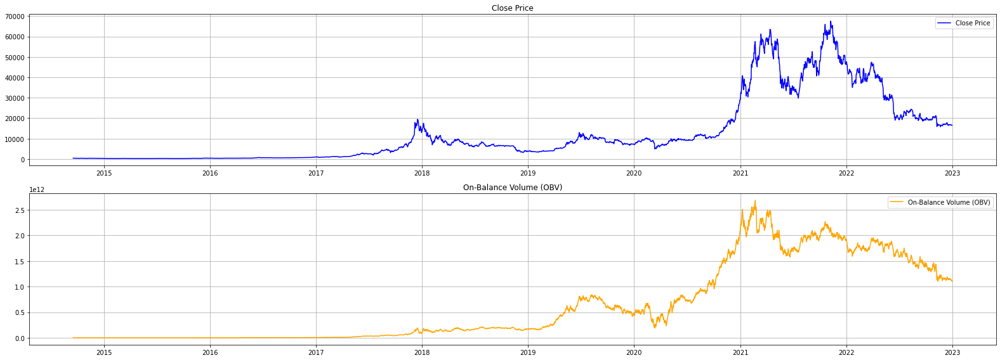

In [139]:
# Plot Closing Price and OBV
plt.figure(figsize=(22, 8))

# Plot the closing price
plt.subplot(2, 1, 1)
plt.plot(df_obv.index, df_obv[f'{ticker}_adjclose'], label='Close Price', color='blue')
plt.title('Close Price')
plt.legend()
plt.grid()

# Plot the OBV
plt.subplot(2, 1, 2)
plt.plot(df_obv.index, df_obv[f'{ticker}_obv'], label='On-Balance Volume (OBV)', color='orange')
plt.title('On-Balance Volume (OBV)')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
df_trend_mavg[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_trend_strategy_trades', include_transaction_costs_and_fees=True))

df_trend_mavg_donchian[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_strategy_returns_cum'] = (calculate_compounded_cumulative_returns(
    df_trend_mavg_donchian, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_donchian_strategy_trades', include_transaction_costs_and_fees=True))

In [ ]:
# df_rsi_signal_price.head(20)
rolling_rsi_period = 14
overbought_threshold = 50
oversold_threshold = 10
df_rsi_signal_price = generate_rsi_signal(start_date, end_date, ticker, price_or_returns_calc='price', rolling_rsi_period=rolling_rsi_period,
                                          rsi_mavg_type='simple', rsi_overbought_threshold=overbought_threshold, 
                                          rsi_oversold_threshold=oversold_threshold)

In [ ]:
df_rsi_signal_price.head()

In [ ]:
df_rsi_signal_price[f'{ticker}_rsi_{rolling_rsi_period}_{overbought_threshold}_{oversold_threshold}_strategy_returns'].mean()

In [ ]:
df_rsi_signal_price['strategy_cumulative_return'].mean()

In [ ]:
df_rsi_signal_price['BTC-USD_rsi_14_50_10_strategy_trades']

In [ ]:
(1 + df_rsi_signal_price['strategy_cumulative_return']).cumprod() - 1

In [ ]:
calculate_CAGR(df_rsi_signal_price, strategy_daily_return_col=f'{ticker}_rsi_{rolling_rsi_period}_{overbought_threshold}_{oversold_threshold}_strategy_returns',
               strategy_trade_count_col=f'{ticker}_rsi_{rolling_rsi_period}_{overbought_threshold}_{oversold_threshold}_strategy_trades')

In [ ]:
df_performance

In [ ]:
df_rsi.agg({'BTC-USD_rsi_14':['min','max','mean','median']})

In [ ]:
np.arange(15, 46, 5)

In [ ]:
def rolling_sharpe_ratio(df, window, strategy_daily_return_col, strategy_trade_count_col, **kwargs):
    def sharpe_on_window(window_df):
        # Calculate the Sharpe ratio on the windowed data frame
        return sharpe_ratio(window_df, strategy_daily_return_col, strategy_trade_count_col, **kwargs)

    # Apply the function over a rolling window and return as a Series (not a full DataFrame)
    rolling_sharpe = df[strategy_daily_return_col].rolling(window=window).apply(
        lambda x: sharpe_on_window(df.loc[x.index]), raw=False
    )
    
    # Add the rolling Sharpe ratio as a new column in the original DataFrame
    df[f'rolling_sharpe_{window}'] = rolling_sharpe
    
    return df

In [ ]:
df_trend = generate_trend_signal_with_keltner_channel(start_date, end_date, ticker, fast_mavg=20, slow_mavg=350, mavg_stepsize=6, price_or_returns_calc='price')

In [ ]:
window = 180
for i in np.arange(0,3):
    mavg_start = short_mavg_window[i]
    mavg_end = long_mavg_window[i]
    for mavg_stepsize in mavg_stepsize_list:
        print(mavg_start, mavg_end, mavg_stepsize)
        df_returns = rolling_sharpe_ratio(df_returns, window, strategy_daily_return_col=f'{ticker}_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}',
                                          strategy_trade_count_col=f'{ticker}_trend_slope_strategy_trades_{mavg_start}_{mavg_stepsize}_{mavg_end}')
        df_returns = df_returns.rename(columns={f'rolling_sharpe_{window}': f'{ticker}_{mavg_start}_{mavg_stepsize}_{mavg_end}_rolling_{window}_sharpe'})

In [ ]:
df_trend.head()

In [ ]:
# ticker = 'BTC-USD'
# data = get_close_prices(start_date, end_date, ticker)
# data[f'{ticker}_pct_returns'] = data[f'{ticker}'].pct_change()
# df_trend = pd.merge(df_trend, data, left_index=True, right_index=True, how='left')

In [ ]:
data.head()

In [ ]:
df_trend.tail()

In [ ]:
for i in np.arange(0,3):
    mavg_start = short_mavg_window[i]
    mavg_end = long_mavg_window[i]
    for mavg_stepsize in mavg_stepsize_list:
        fig = plt.figure(figsize=(22,6))
        # plt.style.use('bmh')
        layout = (1,2)
        price_return_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        rolling_performance_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        
        _ = price_return_ax.plot(df_trend.index, df_trend[f'{ticker}'], label=f'{ticker} Close Price', color='blue')
        price_return_ax_2 = price_return_ax.twinx()
        _ = price_return_ax_2.plot(df_trend.index, df_trend[f'{ticker}_pct_returns'].rolling(window).mean(), label=f'{ticker} Returns', color='orange')

        _ = rolling_performance_ax.plot(df_trend.index, df_trend[f'{ticker}_{mavg_start}_{mavg_stepsize}_{mavg_end}_rolling_{window}_sharpe'], label=f'Sharpe', color='green')
        rolling_performance_ax_2 = rolling_performance_ax.twinx()
        _ = rolling_performance_ax_2.plot(df_trend.index, df_trend[f'{ticker}_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}'].rolling(90).mean(),
                                          label='Strategy Returns', color='magenta')

        _ = price_return_ax.grid()
        _ = price_return_ax.legend(loc='upper left')
        _ = price_return_ax_2.legend(loc='upper right')
        _ = price_return_ax.set_title(f'{ticker} Price & Returns')
        # _ = rolling_sharpe.grid()
        _ = rolling_performance_ax.legend(loc='upper left')
        _ = rolling_performance_ax.grid()
        _ = rolling_performance_ax_2.legend(loc='upper right')
        _ = rolling_performance_ax_2.set_title(f'{ticker} {mavg_start}/{mavg_stepsize}/{mavg_end} Rolling Performance')
        # _ = momentum_ax_4.grid()
        # _ = momentum_ax_4.legend()
        # _ = momentum_ax_5.grid()
        # _ = momentum_ax_5.legend()
        # _ = momentum_ax_6.grid()
        # _ = momentum_ax_6.legend()

        plt.tight_layout()

In [ ]:
fast_mavg = 10
slow_mavg = 50
stepsize = 2
price_or_returns_calc = 'returns'
rolling_atr_window = 20
lower_atr_multiplier = 2
upper_atr_multiplier = 2
moving_avg_type = 'exponential'

df = get_close_prices(start_date, end_date, ticker)
df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                  price_or_returns_calc=price_or_returns_calc)
            .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{stepsize}_{slow_mavg}',
                             f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{stepsize}_{slow_mavg}'}))
# Generate Keltner Signal
df_keltner = calculate_keltner_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                        rolling_atr_window=rolling_atr_window, upper_atr_multiplier=upper_atr_multiplier, lower_atr_multiplier=lower_atr_multiplier)
df_keltner[f'{ticker}_{rolling_atr_window}_keltner_signal'] = np.where((df_keltner[f'adjclose'] > df_keltner[f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}']), 1,
                                                                       np.where((df_keltner[f'adjclose'] <
                                                                                 df_keltner[f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}']), -1, 0))

In [ ]:
df_trend.head()

In [ ]:
df_keltner.head()

In [ ]:
keltner_cols = [f'{ticker}_{rolling_atr_window}_atr_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_atr_window}_atr_lower_band_{price_or_returns_calc}',
                f'{ticker}_{rolling_atr_window}_keltner_signal']
df_trend = pd.merge(df_trend, df_keltner[keltner_cols], left_index=True, right_index=True, how='left')

In [ ]:
df_trend.head()

In [ ]:
df_keltner.head(20)

In [ ]:
df_trend[f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal'] = (
    np.where((df_trend[f'{ticker}_{rolling_atr_window}_keltner_signal'] == 1) & (df_trend[f'{ticker}_trend_signal'] == 1), 1,
            np.where((df_trend[f'{ticker}_{rolling_atr_window}_keltner_signal'] == -1) & (df_trend[f'{ticker}_trend_signal'] == -1), -1, 0)))

In [ ]:
df_trend[f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns'] = (
    df_trend[(f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal')] * 
    df_trend[f'{ticker}_pct_returns'])
df_trend[f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades'] = (
    df_trend[(f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_signal')].diff())

In [ ]:
calculate_risk_and_performance_metrics(df_trend, strategy_daily_return_col=f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_returns',
                                      strategy_trade_count_col=f'{ticker}_{fast_mavg}_{stepsize}_{slow_mavg}_mavg_crossover_{rolling_atr_window}_keltner_strategy_trades')

In [ ]:
df_keltner.head()

In [ ]:
df_trend.head()

In [ ]:
df_trend.head(20)

In [ ]:
calculate_risk_and_performance_metrics(df_trend, strategy_daily_return_col=f'BTC-USD_trend_strategy_returns_20_6_350',
                                       strategy_trade_count_col=f'BTC-USD_trend_strategy_trades_20_6_350')

## Correlation of Signals

In [ ]:
# short_mavg_window = [10,20,10,20,30,30,40,50,100,90]
# long_mavg_window = [100,200,100,200,300,300,400,500,1000,900]
short_mavg_window = [10, 50, 100, 200]
long_mavg_window = [50, 100, 200, 500]
mavg_stepsize_list = [2,4]

In [ ]:
print(len(short_mavg_window))
print(len(long_mavg_window))
print(len(mavg_stepsize_list))

In [ ]:
# Create a date range
date_range = pd.date_range(start=start_date, end=end_date)

# Create an empty DataFrame with the date_range as the index
df_returns = pd.DataFrame(index=date_range)

In [ ]:
ticker = 'BTC-USD'
start_date = pd.datetime(2014, 9, 17)
end_date = pd.datetime(2023, 12, 31)

for i in np.arange(0,4):
    print(i)
    mavg_start = short_mavg_window[i]
    mavg_end = long_mavg_window[i]
    for mavg_stepsize in mavg_stepsize_list:
#         print(mavg_stepsize)
#         mavg_stepsize = mavg_stepsize_list[i]
        data = get_close_prices(start_date, end_date, ticker)
        data = (create_trend_strategy(data, ticker, mavg_start, mavg_end, mavg_stepsize, slope_window=10, moving_avg_type='exponential', price_or_returns_calc='returns')
                .rename(columns={'BTC-USD_trend_slope_strategy_returns': f'BTC-USD_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}'}))
        df_returns = pd.merge(df_returns, data[[f'BTC-USD_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}']], left_index=True, right_index=True, how='left')

df_returns = df_returns.dropna()

In [ ]:
ticker = 'BTC-USD'
data = get_close_prices(start_date, end_date, ticker)
data[f'{ticker}_pct_returns'] = data[f'{ticker}'].pct_change()
df_returns = pd.merge(df_returns, data[f'{ticker}_pct_returns'], left_index=True, right_index=True, how='left')

In [ ]:
ticker = '^GSPC'
data = get_close_prices(start_date, end_date, ticker)
data[f'{ticker}_pct_returns'] = data[f'{ticker}'].pct_change()
df_returns = pd.merge(df_returns, data[f'{ticker}_pct_returns'], left_index=True, right_index=True, how='left')

In [ ]:
data.head()

In [ ]:
data.tail()

In [ ]:
df_returns.tail(200)

In [ ]:
mavg_corr_matrix = df_returns.corr()

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(mavg_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Signal Returns')
plt.show()

In [ ]:
df_results_returns_t_cost.index.names = ['strategy']
df_results_returns_t_cost[df_results_returns_t_cost.index.get_level_values('strategy').str.startswith('BTC-USD')].sort_values('annualized_sharpe_ratio', ascending=False)

In [ ]:
data[f'{ticker}_trend_strategy_trades'] = data[f'{ticker}_trend_signal'].diff()
data[f'{ticker}_trend_slope_strategy_trades'] = data[f'{ticker}_trend_slope_signal'].diff()

In [ ]:
df_tsla = get_close_prices(start_date, end_date, ticker='TSLA')

In [ ]:
df_tsla.head()

In [ ]:
len(ticker)

In [ ]:
data.head(10)

In [ ]:
ticker = ['SPY']
data_SPY = get_close_prices(start_date, end_date, ticker=ticker)

In [ ]:
data_SPY.head(10)

In [ ]:
# Specify date range and pull data for specific instrument
start_date = pd.datetime(2015, 1, 1)
end_date = pd.datetime(2024, 7, 21)
ticker = ['PL=F']
data = get_close_prices(start_date, end_date, ticker=ticker)

In [ ]:
data.head()

In [ ]:
mavg_start_list = [mavg_start for mavg_start in np.arange(10,110,10)]
mavg_start_list

In [ ]:
# def get_mavg_windows_trim():
#     mavg_list = []
#     _mavg = []
#     mavg_start_list = [mavg_start for mavg_start in np.arange(10,110,10)]
#     mavg_end_list = [mavg_end for mavg_end in np.arange(100,1100,100)]
#     for i in np.arange(0,10,1):
#         mavg_list.append([mavg_start_list[i], mavg_end_list[i], 2])
#         mavg_list.append([mavg_start_list[i], mavg_end_list[i], 4])
#         mavg_list.append([mavg_start_list[i], mavg_end_list[i], 10])
#         mavg_list.append([mavg_start_list[i], mavg_end_list[i], int(mavg_start_list[i] - mavg_start_list[i]/10+1)])
    
#     mavg_list = pd.DataFrame(mavg_list).drop_duplicates().values.tolist()
    
#     return mavg_list

In [ ]:
def get_mavg_windows():
    mavg_list = []
    _mavg = []
    mavg_start_list = [mavg_start for mavg_start in np.arange(10,110,10)]
    mavg_end_list = [mavg_end for mavg_end in np.arange(100,1100,100)]
    for i in np.arange(0,10,1):
        mavg_list.append([mavg_start_list[i], mavg_end_list[i], 2])
        mavg_list.append([mavg_start_list[i], mavg_end_list[i], 4])
        mavg_list.append([mavg_start_list[i], mavg_end_list[i], 10])
        mavg_list.append([mavg_start_list[i], mavg_end_list[i], int(mavg_start_list[i] - mavg_start_list[i]/10+1)])
    
    mavg_list = pd.DataFrame(mavg_list).drop_duplicates().values.tolist()
    
    return mavg_list

In [ ]:
def get_mavg_windows_trim():
    mavg_list = []
    _mavg = []
#     mavg_start_list = [mavg_start for mavg_start in np.arange(10,110,10)]
#     mavg_end_list = [mavg_end for mavg_end in np.arange(100,1100,100)]
    mavg_start_list = [10, 50, 100, 200]
    mavg_end_list = [50, 100, 200, 500]
#     mavg_stepsize_list = [2,4]
    for i in np.arange(0,4,1):
        mavg_list.append([mavg_start_list[i], mavg_end_list[i], 2])
        mavg_list.append([mavg_start_list[i], mavg_end_list[i], 4])
#         mavg_list.append([mavg_start_list[i], mavg_end_list[i], 10])
#         mavg_list.append([mavg_start_list[i], mavg_end_list[i], int(mavg_start_list[i] - mavg_start_list[i]/10+1)])
    
    mavg_list = pd.DataFrame(mavg_list).drop_duplicates().values.tolist()
    
    return mavg_list

In [ ]:
get_mavg_windows_trim()

In [ ]:
def get_mavg_strategy_performance(start_date, end_date, ticker_list, moving_avg_type='simple', price_or_returns_calc='price', annual_trading_days=252, include_transaction_costs_and_fees=True,
                                 transaction_cost_est=0.001, passive_trade_rate=0.5):
    if isinstance(ticker_list, str):
        ticker_list = [ticker_list]
#     mavg_list = get_mavg_windows()
    mavg_list = get_mavg_windows_trim()
    performance_columns = ['annualized_return', 'annualized_sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown',
                           'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
    final_perf_stats = []
    
    for ticker in ticker_list:
        print(ticker)
        df_temp_results = pd.DataFrame(columns=performance_columns)
        for mavg_start, mavg_end, mavg_stepsize in mavg_list:
            print(mavg_start, mavg_end, mavg_stepsize)
            df = get_close_prices(start_date, end_date, ticker)
            df = create_trend_strategy(df, ticker, mavg_start, mavg_end, mavg_stepsize, slope_window=5, moving_avg_type=moving_avg_type, price_or_returns_calc=price_or_returns_calc)
            if (df.shape[0] > 100) & ((df[f'{ticker}_trend_strategy_returns'] != 0).any()):
                trend_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'{ticker}_trend_strategy_returns',
                                                                      strategy_trade_count_col=f'{ticker}_trend_strategy_trades',annual_trading_days=annual_trading_days,
                                                                            include_transaction_costs_and_fees=include_transaction_costs_and_fees,
                                                                            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate)
                df_temp_results.loc[f'{ticker}_{mavg_start}-{mavg_end}-{mavg_stepsize}_trend_strategy_returns'] = trend_metrics
            if (df.shape[0] > 100) & ((df[f'{ticker}_trend_slope_strategy_returns'] != 0).any()):
                trend_slope_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'{ticker}_trend_slope_strategy_returns',
                                                                            strategy_trade_count_col=f'{ticker}_trend_slope_strategy_trades', annual_trading_days=annual_trading_days,
                                                                            include_transaction_costs_and_fees=include_transaction_costs_and_fees,
                                                                            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate)
                df_temp_results.loc[f'{ticker}_{mavg_start}-{mavg_end}-{mavg_stepsize}_trend_slope_strategy_returns'] = trend_slope_metrics
        final_perf_stats.append(df_temp_results)

    df_results = pd.concat(final_perf_stats, axis=0)
    
    return df_results

In [ ]:
ticker_list = ['ETH-USD','SOL-USD','XRP-USD','BTC-USD']#,'ADA-USD','DOT-USD'
df_results_returns_t_cost = get_mavg_strategy_performance(start_date, end_date, ticker_list, moving_avg_type='exponential', price_or_returns_calc='returns', annual_trading_days=365, include_transaction_costs_and_fees=True)
df_results_returns_no_t_cost = get_mavg_strategy_performance(start_date, end_date, ticker_list, moving_avg_type='exponential', price_or_returns_calc='returns', annual_trading_days=365, include_transaction_costs_and_fees=False)
# df_results_price_t_cost = get_mavg_strategy_performance(start_date, end_date, ticker_list, moving_avg_type='exponential', price_or_returns_calc='price', annual_trading_days=365, include_transaction_costs_and_fees=True)
# df_results_price_no_t_cost = get_mavg_strategy_performance(start_date, end_date, ticker_list, moving_avg_type='exponential', price_or_returns_calc='price', annual_trading_days=365, include_transaction_costs_and_fees=False)

In [ ]:
df_results_returns_t_cost.sort_values('annualized_sharpe_ratio', ascending=False)

In [ ]:
df_results_price_t_cost.sort_values('annualized_sharpe_ratio', ascending=False)

## Rolling Sharpe Ratio

In [ ]:
def rolling_sharpe_ratio(df, window, strategy_daily_return_col, strategy_trade_count_col, **kwargs):
    def sharpe_on_window(window_df):
        # Calculate the Sharpe ratio on the windowed data frame
        return sharpe_ratio(window_df, strategy_daily_return_col, strategy_trade_count_col, **kwargs)

    # Apply the function over a rolling window and return as a Series (not a full DataFrame)
    rolling_sharpe = df[strategy_daily_return_col].rolling(window=window).apply(
        lambda x: sharpe_on_window(df.loc[x.index]), raw=False
    )
    
    # Add the rolling Sharpe ratio as a new column in the original DataFrame
    df[f'rolling_sharpe_{window}'] = rolling_sharpe
    
    return df

In [ ]:
# short_mavg_window = [10,20,10,20,30,30,40,50,100,90]
# long_mavg_window = [100,200,100,200,300,300,400,500,1000,900]
short_mavg_window = [10, 50, 100, 200]
long_mavg_window = [50, 100, 200, 500]
mavg_stepsize_list = [2,4]

In [ ]:
print(len(short_mavg_window))
print(len(long_mavg_window))
print(len(mavg_stepsize_list))

In [ ]:
# Create a date range
date_range = pd.date_range(start=start_date, end=end_date)

# Create an empty DataFrame with the date_range as the index
df_returns = pd.DataFrame(index=date_range)

In [ ]:
ticker = 'BTC-USD'
start_date = pd.datetime(2014, 9, 17)
end_date = pd.datetime(2024, 7, 30)

for i in np.arange(0,4):
    print(i)
    mavg_start = short_mavg_window[i]
    mavg_end = long_mavg_window[i]
    for mavg_stepsize in mavg_stepsize_list:
#         print(mavg_stepsize)
#         mavg_stepsize = mavg_stepsize_list[i]
        data = get_close_prices(start_date, end_date, ticker)
        data = (create_trend_strategy(data, ticker, mavg_start, mavg_end, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns')
                .rename(columns={'BTC-USD_trend_slope_strategy_returns': f'BTC-USD_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}',
                                 'BTC-USD_trend_slope_strategy_trades': f'BTC-USD_trend_slope_strategy_trades_{mavg_start}_{mavg_stepsize}_{mavg_end}'}))
        df_returns = pd.merge(df_returns, data[[f'BTC-USD_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}', f'BTC-USD_trend_slope_strategy_trades_{mavg_start}_{mavg_stepsize}_{mavg_end}']],
                              left_index=True, right_index=True, how='left')

df_returns = df_returns.dropna()

In [ ]:
df_returns.shape

In [ ]:
df_returns.tail(200)

In [ ]:
# # ticker = 'ETH-USD'
# ticker = 'BTC-USD'
# data = get_close_prices(start_date, end_date, ticker)
# mavg_start = 100
# mavg_end = 200
# mavg_stepsize = 4
# data = create_trend_strategy(data, ticker, mavg_start, mavg_end, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns')

In [ ]:
# # Example usage:
# window = 180 # 1 year rolling window assuming 252 trading days in a year
# rolling_sharpe = rolling_sharpe_ratio(data, window, strategy_daily_return_col='BTC-USD_trend_slope_strategy_returns', strategy_trade_count_col='BTC-USD_trend_slope_strategy_trades')

In [ ]:
window = 180
for i in np.arange(0,3):
    mavg_start = short_mavg_window[i]
    mavg_end = long_mavg_window[i]
    for mavg_stepsize in mavg_stepsize_list:
        print(mavg_start, mavg_end, mavg_stepsize)
        df_returns = rolling_sharpe_ratio(df_returns, window, strategy_daily_return_col=f'{ticker}_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}',
                                          strategy_trade_count_col=f'{ticker}_trend_slope_strategy_trades_{mavg_start}_{mavg_stepsize}_{mavg_end}')
        df_returns = df_returns.rename(columns={f'rolling_sharpe_{window}': f'{ticker}_{mavg_start}_{mavg_stepsize}_{mavg_end}_rolling_{window}_sharpe'})

In [ ]:
ticker = 'BTC-USD'
data = get_close_prices(start_date, end_date, ticker)
data[f'{ticker}_pct_returns'] = data[f'{ticker}'].pct_change()
df_returns = pd.merge(df_returns, data, left_index=True, right_index=True, how='left')

In [ ]:
data.head()

In [ ]:
df_returns.tail()

In [ ]:
for i in np.arange(0,3):
    mavg_start = short_mavg_window[i]
    mavg_end = long_mavg_window[i]
    for mavg_stepsize in mavg_stepsize_list:
        fig = plt.figure(figsize=(22,6))
        # plt.style.use('bmh')
        layout = (1,2)
        price_return_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        rolling_performance_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        
        _ = price_return_ax.plot(df_returns.index, df_returns[f'{ticker}'], label=f'{ticker} Close Price', color='blue')
        price_return_ax_2 = price_return_ax.twinx()
        _ = price_return_ax_2.plot(df_returns.index, df_returns[f'{ticker}_pct_returns'].rolling(window).mean(), label=f'{ticker} Returns', color='orange')

        _ = rolling_performance_ax.plot(df_returns.index, df_returns[f'{ticker}_{mavg_start}_{mavg_stepsize}_{mavg_end}_rolling_{window}_sharpe'], label=f'Sharpe', color='green')
        rolling_performance_ax_2 = rolling_performance_ax.twinx()
        _ = rolling_performance_ax_2.plot(df_returns.index, df_returns[f'{ticker}_trend_slope_strategy_returns_{mavg_start}_{mavg_stepsize}_{mavg_end}'].rolling(90).mean(),
                                          label='Strategy Returns', color='magenta')

        _ = price_return_ax.grid()
        _ = price_return_ax.legend(loc='upper left')
        _ = price_return_ax_2.legend(loc='upper right')
        _ = price_return_ax.set_title(f'{ticker} Price & Returns')
        # _ = rolling_sharpe.grid()
        _ = rolling_performance_ax.legend(loc='upper left')
        _ = rolling_performance_ax.grid()
        _ = rolling_performance_ax_2.legend(loc='upper right')
        _ = rolling_performance_ax_2.set_title(f'{ticker} {mavg_start}/{mavg_stepsize}/{mavg_end} Rolling Performance')
        # _ = momentum_ax_4.grid()
        # _ = momentum_ax_4.legend()
        # _ = momentum_ax_5.grid()
        # _ = momentum_ax_5.legend()
        # _ = momentum_ax_6.grid()
        # _ = momentum_ax_6.legend()

        plt.tight_layout()

## Combined Moving Average Signals

In [ ]:
ticker = 'BTC-USD'
data = get_close_prices(start_date, end_date, ticker)
short_mavg_window = [10, 50, 100, 200]
long_mavg_window = [50, 100, 200, 500]
mavg_stepsize_list = [2,4]

In [ ]:
for window in np.linspace(10, 50, 2):
    print(window)

In [ ]:
for i in np.arange(0,4):
    print(short_mavg_window[i])
    data = (create_trend_strategy(data, ticker, mavg_start=short_mavg_window[i], mavg_end=long_mavg_window[i], mavg_stepsize=2, moving_avg_type='exponential', price_or_returns_calc='returns')
            .rename(columns={'BTC-USD_ribbon_thickness':f'BTC-USD_ribbon_thickness_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg',
                             'BTC-USD_trend_signal':f'BTC-USD_trend_signal_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg',
                             'BTC-USD_trend_strategy_returns':f'BTC-USD_trend_strategy_returns_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg',
                             'BTC-USD_trend_strategy_trades':f'BTC-USD_trend_strategy_trades_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg',
                             'BTC-USD_trend_slope_signal':f'BTC-USD_trend_slope_signal_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg',
                             'BTC-USD_trend_slope_strategy_returns':f'BTC-USD_trend_slope_strategy_returns_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg',
                             'BTC-USD_trend_slope_strategy_trades':f'BTC-USD_trend_slope_strategy_trades_{short_mavg_window[i]}_{long_mavg_window[i]}_mavg'}))

In [ ]:
data = (create_trend_strategy(data, ticker, mavg_start=10, mavg_end=100, mavg_stepsize=2, moving_avg_type='exponential', price_or_returns_calc='returns')
        .rename(columns={'BTC-USD_ribbon_thickness':'BTC-USD_ribbon_thickness_10_100_mavg','BTC-USD_trend_signal':'BTC-USD_trend_signal_10_100_mavg', 'BTC-USD_trend_strategy_returns':'BTC-USD_trend_strategy_returns_10_100_mavg',
                        'BTC-USD_trend_strategy_trades':'BTC-USD_trend_strategy_trades_10_100_mavg','BTC-USD_trend_slope_signal':'BTC-USD_trend_slope_signal_10_100_mavg','BTC-USD_trend_slope_strategy_returns':'BTC-USD_trend_slope_strategy_returns_10_100_mavg',
                        'BTC-USD_trend_slope_strategy_trades':'BTC-USD_trend_slope_strategy_trades_10_100_mavg'}))
data = (create_trend_strategy(data, ticker, mavg_start=30, mavg_end=300, mavg_stepsize=2, moving_avg_type='exponential', price_or_returns_calc='returns')
        .rename(columns={'BTC-USD_ribbon_thickness':'BTC-USD_ribbon_thickness_30_300_mavg','BTC-USD_trend_signal':'BTC-USD_trend_signal_30_300_mavg', 'BTC-USD_trend_strategy_returns':'BTC-USD_trend_strategy_returns_30_300_mavg',
                        'BTC-USD_trend_strategy_trades':'BTC-USD_trend_strategy_trades_30_300_mavg','BTC-USD_trend_slope_signal':'BTC-USD_trend_slope_signal_30_300_mavg','BTC-USD_trend_slope_strategy_returns':'BTC-USD_trend_slope_strategy_returns_30_300_mavg',
                        'BTC-USD_trend_slope_strategy_trades':'BTC-USD_trend_slope_strategy_trades_30_300_mavg'}))

In [ ]:
## Combine the trend strategies
# Combine the two signals into one by averaging them
data['BTC-USD_combined_signal_10_100_30_300'] = (data['BTC-USD_trend_signal_10_100_mavg'] + data['BTC-USD_trend_signal_30_300_mavg']) / 2

# Round to get a signal of -1, 0, or 1
data['BTC-USD_combined_signal_10_100_30_300'] = np.sign(data['BTC-USD_combined_signal_10_100_30_300'])

# Get strategy returns
data['BTC-USD_combined_10_100_30_300_strategy_returns'] = data['BTC-USD_combined_signal_10_100_30_300'].shift(1) * data['BTC-USD_pct_returns']

# Get trade count
data['BTC-USD_combined_10_100_30_300_strategy_trades'] = data['BTC-USD_combined_signal_10_100_30_300'].diff()

In [ ]:
## Combine the slope strategies
# Combine the two signals into one by averaging them
data['BTC-USD_combined_slope_signal_10_100_30_300'] = (data['BTC-USD_trend_slope_signal_10_100_mavg'] + data['BTC-USD_trend_slope_signal_30_300_mavg']) / 2

# Round to get a signal of -1, 0, or 1
data['BTC-USD_combined_slope_signal_10_100_30_300'] = np.sign(data['BTC-USD_combined_slope_signal_10_100_30_300'])

# Get strategy returns
data['BTC-USD_combined_slope_10_100_30_300_strategy_returns'] = data['BTC-USD_combined_slope_signal_10_100_30_300'].shift(1) * data['BTC-USD_pct_returns']

# Get trade count
data['BTC-USD_combined_slope_10_100_30_300_strategy_trades'] = data['BTC-USD_combined_slope_signal_10_100_30_300'].diff()

In [ ]:
data[['BTC-USD_10_mavg','BTC-USD_100_mavg','BTC-USD_trend_signal_10_100_mavg','BTC-USD_trend_signal_30_300_mavg','BTC-USD_10_mavg_slope','BTC-USD_100_mavg_slope','BTC-USD_trend_slope_signal_10_100_mavg','BTC-USD_trend_slope_signal_30_300_mavg','BTC-USD_combined_signal_10_100_30_300','BTC-USD_combined_slope_signal_10_100_30_300']]

In [ ]:
trend_metrics = calculate_risk_and_performance_metrics(data, strategy_daily_return_col='BTC-USD_combined_10_100_30_300_strategy_returns',
                                                                      strategy_trade_count_col=f'BTC-USD_combined_10_100_30_300_strategy_trades',annual_trading_days=365,
                                                                            include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5)

In [ ]:
trend_metrics

In [ ]:
trend_metrics = calculate_risk_and_performance_metrics(data, strategy_daily_return_col='BTC-USD_combined_slope_10_100_30_300_strategy_returns',
                                                                      strategy_trade_count_col=f'BTC-USD_combined_slope_10_100_30_300_strategy_trades',annual_trading_days=365,
                                                                            include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5)

In [ ]:
trend_metrics

In [ ]:
trend_metrics = calculate_risk_and_performance_metrics(data, strategy_daily_return_col='BTC-USD_trend_slope_strategy_returns_10_100_mavg',
                                                                      strategy_trade_count_col=f'BTC-USD_trend_slope_strategy_trades_10_100_mavg',annual_trading_days=365,
                                                                            include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5)

In [ ]:
trend_metrics

In [ ]:
trend_metrics = calculate_risk_and_performance_metrics(data, strategy_daily_return_col='BTC-USD_trend_slope_strategy_returns_30_300_mavg',
                                                                      strategy_trade_count_col=f'BTC-USD_trend_slope_strategy_trades_30_300_mavg',annual_trading_days=365,
                                                                            include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5)

In [ ]:
trend_metrics

In [ ]:
data.head(50)

In [ ]:
ticker = 'BTC-USD'
mavg_start = 10
mavg_end = 100
mavg_stepsize = 2
df_temp_results = pd.DataFrame(columns=performance_columns)
df_test = get_close_prices(start_date, end_date, ticker)
df_test = create_trend_strategy(df_test, ticker, mavg_start, mavg_end, mavg_stepsize)
# df_test['BTC-USD_trend_signal_test'] = df_test['BTC-USD_trend_signal'].shift(1)
# df_test['BTC-USD_trend_strategy_returns_test'] = df_test['BTC-USD_trend_signal_test'] * df_test['BTC-USD_pct_returns']
# df_test = df_test.dropna()
if (df_test.shape[0] > 100) & ((df_test[f'{ticker}_trend_strategy_returns'] != 0).any()):
    trend_metrics = calculate_risk_and_performance_metrics(df_test, strategy_daily_return_col=f'{ticker}_trend_strategy_returns')
    df_temp_results.loc[f'{ticker}_{mavg_start}-{mavg_end}-{mavg_stepsize}_trend_strategy_returns'] = trend_metrics
if (df_test.shape[0] > 100) & ((df_test[f'{ticker}_trend_slope_strategy_returns'] != 0).any()):
    trend_slope_metrics = calculate_risk_and_performance_metrics(df_test, strategy_daily_return_col=f'{ticker}_trend_slope_strategy_returns')
                
# trend_metrics = calculate_risk_and_performance_metrics(df_test, strategy_daily_return_col=f'{ticker}_trend_strategy_returns')
# df_temp_results.loc[f'{ticker}_{mavg_start}-{mavg_end}-{mavg_stepsize}_trend_strategy_returns'] = trend_metrics
# trend_metrics = calculate_risk_and_performance_metrics(df_test, strategy_daily_return_col=f'{ticker}_trend_slope_strategy_returns')
# df_temp_results.loc[f'{ticker}_{mavg_start}-{mavg_end}-{mavg_stepsize}_trend_slope_strategy_returns'] = trend_metrics

In [ ]:
df_test.shape

In [ ]:
df_temp_results

In [ ]:
calculate_risk_and_performance_metrics(df_test, strategy_daily_return_col=f'{ticker}_trend_strategy_returns_test')

In [ ]:
df_test[['BTC-USD','BTC-USD_pct_returns','BTC-USD_trend_slope_signal','BTC-USD_trend_strategy_returns']].head(1000)

In [ ]:
df_test.tail(200)

In [ ]:
for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
    print(window)

In [ ]:
df_test#.shape

In [ ]:
df_test.head()

In [ ]:
ticker_list = ['BCH-USD','ETH-USD','XRP-USD','SOL-USD','BTC-USD']
df_mavg_results = get_mavg_strategy_performance(start_date, end_date, ticker_list)

In [ ]:
ticker_list = ['BCH-USD','ETH-USD','XRP-USD','SOL-USD','BTC-USD']
momentum_strategy_list = ['10_day_momentum','1_month_momentum','3_month_momentum','6_month_momentum','12_month_momentum','12_month_minus_1_month_momentum']
threshold_list = [0.2] * len(momentum_strategy_list)
performance_columns = ['annualized_return', 'annualized_sharpe_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value']
final_perf_stats = []
for ticker in ticker_list:
    print(ticker)
    df_temp_results = pd.DataFrame(columns=performance_columns)
    for i in np.arange(len(momentum_strategy_list)):
        data = get_close_prices(start_date, end_date, ticker)
        data = get_long_and_short_term_momentum(data, close_px_col=ticker, returns_type='logarithmic', weekend_trading=True)
        data[f'{ticker}_12_month_minus_1_month_momentum'] = data[f'{ticker}_12_month_momentum'] - data[f'{ticker}_1_month_momentum']
        data = generate_momentum_signal(data, ticker=ticker, momentum_type=momentum_strategy_list[i], threshold=threshold_list[i])
        data = data.dropna()
        metrics = calculate_risk_and_performance_metrics(data, strategy_daily_return_col=f'{ticker}_{momentum_strategy_list[i]}_strategy_returns')
        df_temp_results.loc[f'{ticker}_{momentum_strategy_list[i]}_strategy_returns'] = metrics
    
    final_perf_stats.append(df_temp_results)

df_final = pd.concat(final_perf_stats, axis=0)

In [ ]:
mavg_list = get_mavg_windows()
mavg_list

In [ ]:
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
df_results = get_strategy_performance(start_date, end_date, ticker)

In [ ]:
df_test.head()

In [ ]:
fig = plt.figure(figsize=(15,8))
# plt.style.use('bmh')
layout = (1,2)
sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
pnl_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)

mavg_cond = (df_results.mavg_start == 10) & (df_results.mavg_end == 100) & (df_results.mavg_stepsize == 4)
_ = sharpe_ax.plot(df_results[mavg_cond].ticker, df_results[mavg_cond]['sharpe_ratio'])
_ = sharpe_ax.grid()
_ = pnl_ax.plot(df_results[mavg_cond].ticker, df_results[mavg_cond]['pnl'])
_ = pnl_ax.grid()

plt.tight_layout()

In [ ]:
df_results[mavg_cond]

In [ ]:
## Simple Moving Average Results
results = []
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data['Adj Close']
    data = create_trend_strategy(data, ticker='BTC-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize)
    _sharpe = sharpe_ratio(data, return_col='BTC-USD_trend_strategy_returns', trade_col='BTC-USD_trend_trade')
    _pnl = data[f'BTC-USD_mavg_trend_PnL'].sum()
    results.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results

In [ ]:
## Simple Moving Average Results
results = []
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data['Adj Close']
    data = create_trend_strategy(data, ticker='BTC-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize, moving_avg_type='ewm')
    _sharpe = sharpe_ratio(data, return_col='BTC-USD_trend_strategy_returns', trade_col='BTC-USD_trend_trade')
    _pnl = data[f'BTC-USD_mavg_trend_PnL'].sum()
    results.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results

In [ ]:
## Simple Moving Average Results
results_ETH = []
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data['Adj Close']
    data = create_trend_strategy(data, ticker='ETH-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize)
    _sharpe = sharpe_ratio(data, return_col='ETH-USD_trend_strategy_returns', trade_col='ETH-USD_trend_trade')
    _pnl = data[f'ETH-USD_mavg_trend_PnL'].sum()
    results_ETH.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results_ETH

In [ ]:
## Simple Moving Average Results
results_ETH = []
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data['Adj Close']
    data = create_trend_strategy(data, ticker='ETH-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize, moving_avg_type='ewm')
    _sharpe = sharpe_ratio(data, return_col='ETH-USD_trend_strategy_returns', trade_col='ETH-USD_trend_trade')
    _pnl = data[f'ETH-USD_mavg_trend_PnL'].sum()
    results_ETH.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results_ETH

In [ ]:
## Simple Moving Average Results
results = []
ticker = ['PL=F','ES=F']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data['Adj Close']
    data = create_trend_strategy(data, ticker='ES=F', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize)
    _sharpe = sharpe_ratio(data, return_col='ES=F_trend_strategy_returns', trade_col='ES=F_trend_trade')
    _pnl = data[f'ES=F_mavg_trend_PnL'].sum()
    results.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results

In [ ]:
ticker = ['PL=F','ES=F']
data = load_financial_data(start_date, end_date, ticker=ticker)
data = data['Adj Close']
# data = create_trend_stra.tegy(data, ticker='PL=F', mavg_start=10, mavg_end=100, mavg_stepsize=4)

In [ ]:
fig = plt.figure(figsize=(15,8))
# plt.style.use('bmh')
layout = (1,2)
pl_prices_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
es_prices_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)

_ = pl_prices_ax.plot(data.index, data['PL=F'])
_ = es_prices_ax.plot(data.index, data['ES=F'])

plt.tight_layout()

In [ ]:
mavg_end

In [ ]:
data.tail(500)

In [ ]:
ticker = 'ES=F'
moving_avg_type='simple'
for window in np.linspace(10, 100, 4):
    if moving_avg_type == 'simple':
        data[f'{ticker}_{int(window)}_mavg'] = data[f'{ticker}'].rolling(int(window)).mean()
    else:
        data[f'{ticker}_{int(window)}_mavg'] = data[f'{ticker}'].ewm(span=window).mean()
    data[f'{ticker}_{int(window)}_mavg_slope'] = calculate_slope(data, column=f'{ticker}_{int(window)}_mavg',
                                                               periods=window)

In [ ]:
data.tail(500)

In [ ]:
results

In [ ]:
## Simple Moving Average Results
results = []
ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data['Adj Close']
    data = create_trend_strategy(data, ticker='BTC-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize, moving_avg_type='ewm')
    _sharpe = sharpe_ratio(data, return_col='BTC-USD_trend_strategy_returns', trade_col='BTC-USD_trend_trade')
    _pnl = data[f'BTC-USD_mavg_trend_PnL'].sum()
    results.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results

In [ ]:
data = load_financial_data(start_date, end_date, ticker=ticker)

In [ ]:
data.head()

In [ ]:
results_SPY = []
ticker = ['SPY']
for mavg_start, mavg_end, mavg_stepsize in mavg_list:
    print(mavg_start, mavg_end, mavg_stepsize)
    data = load_financial_data(start_date, end_date, ticker=ticker)
    data = data[['Adj Close']].rename(columns={'Adj Close': 'SPY'})
    data = create_trend_strategy(data, ticker='SPY', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize)
    _sharpe = sharpe_ratio(data, return_col='SPY_trend_strategy_returns', trade_col='SPY_trend_trade')
    _pnl = data[f'SPY_mavg_trend_PnL'].sum()
    results_SPY.append([mavg_start, mavg_end, mavg_stepsize, round(_sharpe,2), round(_pnl,2)])

In [ ]:
results_SPY

In [ ]:
mavg_start = 10
mavg_end = 50
mavg_stepsize = 4
slope_window = 10

In [ ]:
# ticker = ['BCH-USD','ETH-USD','USDT-USD','XRP-USD','BNB-USD','BTC-USD']
# ticker = ['PL=F','ES=F']
ticker = ['BTC-USD']
# start_date = pd.datetime(2015, 1, 1)
# end_date = pd.datetime(2024, 7, 31)
data = get_close_prices(start_date, end_date, ticker)
data = create_trend_strategy(data, ticker='BTC-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type='exponential', price_or_returns_calc='returns')

In [ ]:
data.head()

In [ ]:
sharpe_ratio(data, strategy_daily_return_col='BTC-USD_trend_slope_strategy_returns', strategy_trade_count_col='BTC-USD_trend_slope_strategy_trades')

In [ ]:
fig = plt.figure(figsize=(20,15))
# plt.style.use('bmh')
layout = (4,2)
mavg_ax = plt.subplot2grid(layout, (0,0), colspan=2)
ribbon_vol_ax = plt.subplot2grid(layout, (2,0), colspan=2)
signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
pnl_ax = plt.subplot2grid(layout, (3,0), colspan=2)
# trade_ax = plt.subplot2grid(layout, (1,1))

data = data[(data.index.get_level_values('Date') >= '2020-01-01') & (data.index.get_level_values('Date') <= '2021-01-01')]
# _ = mavg_ax.plot(data.index, data['BTC-USD_short_mavg'], label='Short MAVG', linestyle='--', color='blue')
# _ = mavg_ax.plot(data.index, data['BTC-USD_long_mavg'], label='Long MAVG', linestyle='--', color='orange')
# _ = ribbon_ax.plot(data.index, data['BTC-USD_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='magenta', linewidth=2)
mavg_ax2 = mavg_ax.twinx()
_ = mavg_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta', linewidth=1, alpha=0.6)
# _ = mavg_ax.plot(data.index, data['BTC-USD_pct_returns'], label='Returns', linestyle='--', color='red', linewidth=1, alpha=0.6)
for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
    _ = mavg_ax2.plot(data.index, data[f'BTC-USD_{int(window)}_mavg_slope'], label=f'{int(window)} MAVG', linestyle='--')
    
# buy_cond = (data['BTC-USD_trend_slope_signal_diff'] == 1)
# sell_cond = (data['BTC-USD_trend_slope_signal_diff'] == -1)
# _ = mavg_ax.plot(data[buy_cond].index, data[buy_cond]['BTC-USD_trend_slope_trade'], label='Buy', linestyle='', color='cyan', linewidth=50, marker='^')
# _ = mavg_ax.plot(data[sell_cond].index, data[sell_cond]['BTC-USD_trend_slope_trade'], label='Sell', linestyle='', color='red', linewidth=50, marker='v')
    
# _ = slope_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta', linewidth=2, alpha=0.6)
# slope_ax2 = slope_ax.twinx()
# for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
#     _ = slope_ax2.plot(data.index, data[f'BTC-USD_{window}_mavg_slope'], label=f'{window} MAVG Slope', linestyle='--')

_ = signal_ax.plot(data.index, data['BTC-USD_trend_slope_signal'], label='Trend Signal', linestyle='--', color='orange', linewidth=2)
# _ = signal_ax.plot(data.index, data['BTC-USD_trend_slope_slope_signal'], label='Trend Slope Signal', linestyle='--', color='green', linewidth=2)#, marker='v')

_ = ribbon_vol_ax.plot(data.index, data['BTC-USD_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='red', linewidth=2)
ribbon_vol_ax2 = ribbon_vol_ax.twinx()
_ = ribbon_vol_ax2.plot(data.index, data['BTC-USD_volatility_10'], label='10 Day Vol', linestyle='--', linewidth=2)
_ = ribbon_vol_ax2.plot(data.index, data['BTC-USD_volatility_20'], label='20 Day Vol', linestyle='--', linewidth=2)

# pnl_cond = (data['BTC-USD_trend_slope_trade'].notnull())
# _ = pnl_ax.plot(data[pnl_cond].index, data[pnl_cond]['BTC-USD_mavg_trend_slope_PnL_cum'], label='Cumulative P&L', linestyle='--', linewidth=2)

# _ = trade_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta', linewidth=2)
# buy_cond = (data['BTC-USD_trend_slope_slope_signal'] == 1)
# sell_cond = (data['BTC-USD_trend_slope_slope_signal'] == -1)
# _ = slope_ax.plot(data[buy_cond].index, data[buy_cond]['BTC-USD_trend_slope_slope_trade'], label='Buy', linestyle='', color='red', linewidth=25, marker='^')
# _ = slope_ax.plot(data[sell_cond].index, data[sell_cond]['BTC-USD_trend_slope_slope_trade'], label='Sell', linestyle='', color='green', linewidth=25, marker='v')

_ = mavg_ax.grid()
_ = mavg_ax.legend(ncol=4)
_ = mavg_ax2.legend(ncol=4)
_ = mavg_ax.set_title('BTC')

# _ = slope_ax.grid()
# _ = slope_ax.legend(ncol=4, loc='upper left')
# _ = slope_ax2.legend(ncol=4, loc='upper right')
# _ = slope_ax.set_title('BTC Trend Signal')

_ = signal_ax.grid()
_ = signal_ax.legend(ncol=4)
_ = signal_ax.set_title('BTC Signals')

_ = ribbon_vol_ax.grid()
_ = ribbon_vol_ax.legend(ncol=4, loc='upper left')
_ = ribbon_vol_ax2.legend(ncol=4, loc='upper right')
_ = ribbon_vol_ax.set_title('BTC Ribbon Thickness')

_ = pnl_ax.grid()
_ = pnl_ax.legend(ncol=4)
_ = pnl_ax.set_title('BTC Cumulative P&L')

plt.tight_layout()

In [ ]:
data['BTC-USD_mavg_trend_PnL'].sum()

In [ ]:
data.head()

In [ ]:
data = create_trend_strategy(data, ticker='ETH-USD', mavg_start=mavg_start, mavg_end=mavg_end, mavg_stepsize=mavg_stepsize)

In [ ]:
sharpe_ratio(data, return_col='ETH-USD_trend_strategy_returns', trade_col='ETH-USD_trend_trade')

In [ ]:
data[data['ETH-USD_trend_trade'].notnull()]

In [ ]:
mavg_start_SPY = 50
mavg_end_SPY = 200
mavg_stepsize_SPY = 2

In [ ]:
for window in np.linspace(mavg_start_SPY, mavg_end_SPY, mavg_stepsize_SPY):
    print(window)
    data_SPY[f'SPY_{window}_mavg'] = data_SPY['SPY'].rolling(int(window)).mean()
#     data_SPY[f'SPY_{window}_mavg_slope'] = (data_SPY[f'SPY_10.0_mavg'] - data_SPY[f'SPY_10.0_mavg'].shift(int(window)))/window
    data_SPY[f'SPY_{window}_mavg_slope'] = calculate_slope(data_SPY, column=f'SPY_{window}_mavg', periods=window)
    
data_SPY['SPY_ribbon_thickness'] = data_SPY[f'SPY_{float(mavg_start_SPY)}_mavg'] - data_SPY[f'SPY_{float(mavg_end_SPY)}_mavg']
data_SPY = get_returns_volatility(data_SPY, vol_range_list=[10, 20, 30, 60, 90], close_px_col='SPY')

## SPY Trend Signal and Trade
SPY_mavg_col_list = [f'SPY_{mavg}_mavg' for mavg in np.linspace(mavg_start_SPY, mavg_end_SPY, mavg_stepsize_SPY).tolist()]
SPY_mavg_slope_col_list = [f'SPY_{mavg}_mavg_slope' for mavg in np.linspace(mavg_start_SPY, mavg_end_SPY, mavg_stepsize_SPY).tolist()]
data_SPY['SPY_trend_signal'] = data_SPY[SPY_mavg_col_list].apply(trend_signal, axis=1)
data_SPY['SPY_trend_signal_diff'] = data_SPY['SPY_trend_signal'].diff().shift(1)
data_SPY['SPY_trend_trade'] = np.where(data_SPY['SPY_trend_signal_diff'] != 0, data_SPY['SPY'], np.nan)
data_SPY['SPY_trend_slope_signal'] = data_SPY[SPY_mavg_slope_col_list].apply(slope_signal, axis=1)
data_SPY['SPY_trend_slope_signal_diff'] = data_SPY['SPY_trend_slope_signal'].diff().shift(1)
data_SPY['SPY_trend_slope_trade'] = np.where(data_SPY['SPY_trend_slope_signal_diff'] != 0, data_SPY['SPY'], np.nan)
data_SPY['SPY_trend_strategy_returns'] = data_SPY[f'SPY_pct_returns'] * data_SPY['SPY_trend_signal_diff']
data_SPY['SPY_trend_slope_strategy_returns'] = data_SPY[f'SPY_pct_returns'] * data_SPY['SPY_trend_slope_signal_diff']
# data_SPY['SPY_trend_trade'] = np.where((np.abs(data_SPY['SPY_ribbon_thickness']) > 2000) &
#                                    (data_SPY['SPY_trend_signal_diff'] != 0), data_SPY['SPY_trend_signal_diff'], np.nan)

In [ ]:
data.shape

In [ ]:
data_SPY.shape

In [ ]:
# data = data.dropna()
# data = data[data.index.get_level_values('Date') >= '2018-12-14']
data_SPY = data_SPY[data_SPY.index.get_level_values('Date') >= '2019-06-14']

In [ ]:
data['BTC_mavg_slope_PnL'] = data['BTC_trend_slope_signal_diff'] * data['BTC_trend_slope_trade'] * -1
BTC_cols = [col for col in data.columns if (col.startswith('BTC')) & (col[-5:] == 'slope')]
BTC_cols.append('BTC_trend_slope_signal')
BTC_cols.append('BTC_trend_slope_signal_diff')
BTC_cols.append('BTC_mavg_slope_PnL')
BTC_cols.append('BTC-USD_pct_returns')
BTC_cols.append('BTC_trend_slope_strategy_returns')
cond = (data['BTC_trend_slope_signal_diff'] != 0)
data[cond][BTC_cols]

In [ ]:
data['BTC_mavg_trend_PnL'] = data['BTC_trend_signal_diff'] * data['BTC_trend_trade'] * -1
BTC_cols = [col for col in data.columns if (col.startswith('BTC')) & (col[-5:] == 'slope')]
BTC_cols.append('BTC_trend_signal')
BTC_cols.append('BTC_trend_signal_diff')
BTC_cols.append('BTC_mavg_trend_PnL')
BTC_cols.append('BTC-USD_pct_returns')
BTC_cols.append('BTC_trend_strategy_returns')
cond = (data['BTC_trend_trade'].notnull())
data[cond][BTC_cols]

In [ ]:
data['ETH_mavg_slope_PnL'] = data['ETH_trend_slope_signal_diff'] * data['ETH_trend_slope_trade'] * -1
ETH_cols = [col for col in data.columns if (col.startswith('ETH')) & (col[-5:] == 'slope')]
ETH_cols.append('ETH_trend_slope_signal')
ETH_cols.append('ETH_trend_slope_signal_diff')
ETH_cols.append('ETH_mavg_slope_PnL')
cond = (data['ETH_trend_slope_trade'].notnull())
data[cond][ETH_cols]

In [ ]:
data['ETH_mavg_trend_PnL'] = data['ETH_trend_signal_diff'] * data['ETH_trend_trade'] * -1
ETH_cols = [col for col in data.columns if (col.startswith('ETH')) & (col[-5:] == 'slope')]
ETH_cols.append('ETH_trend_signal')
ETH_cols.append('ETH_trend_signal_diff')
ETH_cols.append('ETH_mavg_trend_PnL')
cond = (data['ETH_trend_trade'].notnull())
data[cond][ETH_cols]

In [ ]:
data_SPY['SPY_mavg_trend_PnL'] = data_SPY['SPY_trend_signal_diff'] * data_SPY['SPY_trend_trade'] * -1
SPY_cols = [col for col in data_SPY.columns if (col.startswith('SPY')) & (col[-5:] == 'slope')]
SPY_cols.append('SPY_trend_signal')
SPY_cols.append('SPY_trend_signal_diff')
SPY_cols.append('SPY_mavg_trend_PnL')
cond = (data_SPY['SPY_trend_trade'].notnull())
data_SPY[cond][SPY_cols]

In [ ]:
# Calculate the mean and standard deviation of the strategy returns
# mean_strategy_return = data['strategy_return'].mean()
# std_strategy_return = data['strategy_return'].std()

# Calculate annualized Sharpe Ratio (assuming 252 trading days in a year)
N = 255 #255 trading days in a year
rf =0.05 #1% risk free rate
cond = (data['BTC_trend_trade'].notnull())
sharpes = sharpe_ratio(data[cond]['BTC_trend_strategy_returns'], N, rf)

In [ ]:
data.head()

In [ ]:
print(f"BTC-USD_mavg_trend_PnL: {data['BTC-USD_mavg_trend_PnL'].sum()}")
cond = (data['BTC-USD_trend_signal_diff'] != 0)
print(f"BTC-USD Trend Sharpe Ratio: {sharpe_ratio(data, return_col='BTC-USD_trend_strategy_returns', trade_col='BTC-USD_trend_trade')}")
print(f"BTC-USD_mavg_slope_PnL: {data['BTC-USD_mavg_slope_PnL'].sum()}")
cond = (data['BTC-USD_trend_slope_signal_diff'] != 0)
print(f"BTC-USD Trend Slope Sharpe Ratio: {sharpe_ratio(data, return_col='BTC-USD_trend_slope_strategy_returns', trade_col='BTC-USD_trend_slope_trade')}")

In [ ]:
print(f"ETH-USD_mavg_trend_PnL: {data['ETH-USD_mavg_trend_PnL'].sum()}")
cond = (data['ETH-USD_trend_signal_diff'] != 0)
print(f"ETH-USD Trend Sharpe Ratio: {sharpe_ratio(data, return_col='ETH-USD_trend_strategy_returns', trade_col='ETH-USD_trend_trade')}")
print(f"ETH-USD_mavg_slope_PnL: {data['ETH-USD_mavg_slope_PnL'].sum()}")
cond = (data['ETH-USD_trend_slope_signal_diff'] != 0)
print(f"ETH-USD Trend Slope Sharpe Ratio: {sharpe_ratio(data, return_col='ETH-USD_trend_slope_strategy_returns', trade_col='ETH-USD_trend_slope_trade')}")

In [ ]:
[col for col in data_SPY.columns if (col.startswith('SPY')) & (col[-4:] == 'mavg')]

In [ ]:
data_SPY.loc[data_SPY.index >= '2020-03-01'][['SPY','SPY_50.0_mavg','SPY_200.0_mavg','SPY_trend_signal','SPY_trend_signal_diff','SPY_mavg_trend_PnL','SPY_ribbon_thickness']].head(500)

In [ ]:
data.loc[data.index >= '2022-05-01'][['BTC-USD','BTC_20.0_mavg','BTC_40.0_mavg','BTC_60.0_mavg','BTC_80.0_mavg','BTC_100.0_mavg','BTC_120.0_mavg','BTC_140.0_mavg',
                                      'BTC_160.0_mavg','BTC_180.0_mavg','BTC_200.0_mavg','BTC_trend_signal','BTC_trend_signal_diff','BTC_mavg_trend_PnL','BTC_ribbon_thickness']].head(500)

In [ ]:
data.loc[data['BTC-USD_trend_trade'].notnull()][['BTC-USD','BTC-USD_20_mavg','BTC-USD_40_mavg','BTC-USD_60_mavg','BTC-USD_80_mavg','BTC-USD_100_mavg','BTC-USD_120_mavg','BTC-USD_140_mavg',
                                      'BTC-USD_160_mavg','BTC-USD_180_mavg','BTC-USD_200_mavg','BTC-USD_trend_signal','BTC-USD_trend_signal_diff','BTC-USD_mavg_trend_PnL','BTC-USD_ribbon_thickness']].head(500)

In [ ]:
data_Pnl = data.loc[data['BTC-USD_trend_trade'].notnull()][['BTC-USD','BTC-USD_20_mavg','BTC-USD_40_mavg','BTC-USD_60_mavg','BTC-USD_80_mavg','BTC-USD_100_mavg','BTC-USD_120_mavg','BTC-USD_140_mavg',
                                      'BTC-USD_160_mavg','BTC-USD_180_mavg','BTC-USD_200_mavg','BTC-USD_trend_signal','BTC-USD_trend_signal_diff','BTC-USD_mavg_trend_PnL','BTC-USD_ribbon_thickness']].head(500)

In [ ]:
data_Pnl['BTC-USD_mavg_trend_PnL_cum'] = data_Pnl['BTC-USD_mavg_trend_PnL'].cumsum()

In [ ]:
data[data['BTC-USD_trend_trade'].notnull()].head(100)

In [ ]:
data['BTC-USD_ribbon_thickness_diff'] = data['BTC-USD_ribbon_thickness'].diff()

In [ ]:
data.index[3-1]

In [ ]:
data.head(500)

In [ ]:
for j in range(1, 4):
    print(j)

In [ ]:
data['BTC-USD_ribbon_thickness_signal'] = np.nan
data.loc[data.index[0:3], 'BTC-USD_ribbon_thickness_signal'] = 0
lookback_period = 3
for i in range(lookback_period, len(data)):
    if all(data.loc[data.index[i-j], 'BTC-USD_ribbon_thickness'] > data.loc[data.index[i-j-1], 'BTC-USD_ribbon_thickness'] for j in range(0,lookback_period-1)):
        data.loc[data.index[i], 'BTC-USD_ribbon_thickness_signal'] = 1
    elif all(data.loc[data.index[i-j], 'BTC-USD_ribbon_thickness'] < data.loc[data.index[i-j-1], 'BTC-USD_ribbon_thickness'] for j in range(0,lookback_period-1)):
        data.loc[data.index[i], 'BTC-USD_ribbon_thickness_signal'] = -1
#     elif data.loc[data.index[i-1], 'BTC-USD_ribbon_thickness_signal'] == 'Buy' and data.loc[data.index[i], 'BTC-USD_ribbon_thickness_diff'] < 0:
#         data['BTC-USD_ribbon_thickness_signal'] = 'Exit Buy'
#     elif data.loc[data.index[i-1], 'BTC-USD_ribbon_thickness_signal'] == 'Sell' and data.loc[data.index[i], 'BTC-USD_ribbon_thickness_diff'] > 0:
#         data['BTC-USD_ribbon_thickness_signal'] = 'Exit Sell'
    else:
        data.loc[data.index[i], 'BTC-USD_ribbon_thickness_signal'] = 0#data.loc[data.index[i-1], 'BTC-USD_ribbon_thickness_signal']

data['BTC-USD_ribbon_thickness_position'] = data['BTC-USD_ribbon_thickness_signal'].diff()
        
data['BTC-USD_ribbon_thickness_PnL'] = data['BTC-USD_ribbon_thickness_position'] * data['BTC-USD']
data['BTC-USD_ribbon_thickness_cum_PnL'] = data['BTC-USD_ribbon_thickness_PnL'].cumsum()

In [ ]:
trend_buy_signal = (data['BTC-USD_trend_signal'] == 1)
trend_sell_signal = (data['BTC-USD_trend_signal'] == -1)
ribbon_thickness_buy_signal = (data['BTC-USD_ribbon_thickness_signal'] == 1)
ribbon_thickness_sell_signal = (data['BTC-USD_ribbon_thickness_signal'] == -1)
data['BTC-USD_trend_ribbon_thickness_combo_signal'] = np.where(trend_buy_signal & ribbon_thickness_buy_signal, 1,
                                                              np.where(trend_sell_signal & ribbon_thickness_sell_signal, -1, 0))
data['BTC-USD_trend_ribbon_thickness_combo_position'] = data['BTC-USD_trend_ribbon_thickness_combo_signal'].diff()
data['BTC-USD_trend_ribbon_thickness_combo_PnL'] = data['BTC-USD_trend_ribbon_thickness_combo_position'] * data['BTC-USD']
data['BTC-USD_trend_ribbon_thickness_combo_cum_PnL'] = data['BTC-USD_trend_ribbon_thickness_combo_PnL'].cumsum()

In [ ]:
data['BTC-USD_trend_ribbon_thickness_combo_PnL'].sum()

In [ ]:
data[['BTC-USD','BTC-USD_ribbon_thickness','BTC-USD_ribbon_thickness_diff','BTC-USD_ribbon_thickness_signal','BTC-USD_trend_signal','BTC-USD_ribbon_thickness_position','BTC-USD_ribbon_thickness_PnL',
     'BTC-USD_ribbon_thickness_cum_PnL']].head(500)

In [ ]:
data['BTC-USD_ribbon_thickness_PnL'].sum()

In [ ]:
data['BTC-USD_ribbon_thickness_slope'] = calculate_slope(data, column='BTC-USD_ribbon_thickness', periods=50)
data['BTC-USD_ribbon_thickness_slope_diff'] = data['BTC-USD_ribbon_thickness_slope'].diff()
data['BTC-USD_ribbon_thickness_slope_position'] = np.nan
data.loc[data.index[0], 'BTC-USD_ribbon_thickness_slope_position'] = 'No Position'
for i in range(3, len(data)):
    if all(data.loc[data.index[i-j], 'BTC-USD_ribbon_thickness_slope_diff'] > 0 for j in range(1,4)):
        data.loc[data.index[i], 'BTC-USD_ribbon_thickness_slope_position'] = 'Buy'
    elif all(data.loc[data.index[i-j], 'BTC-USD_ribbon_thickness_slope_diff'] < 0 for j in range(1,4)):
        data.loc[data.index[i], 'BTC-USD_ribbon_thickness_slope_position'] = 'Sell'
    elif data.loc[data.index[i-1], 'BTC-USD_ribbon_thickness_slope_position'] == 'Buy' and data.loc[data.index[i], 'BTC-USD_ribbon_thickness_diff'] < 0:
        data['BTC-USD_ribbon_thickness_position'] = 'Exit Buy'
    elif data.loc[data.index[i-1], 'BTC-USD_ribbon_thickness_position'] == 'Sell' and data.loc[data.index[i], 'BTC-USD_ribbon_thickness_diff'] > 0:
        data['BTC-USD_ribbon_thickness_position'] = 'Exit Sell'
    else:
        data.loc[data.index[i], 'BTC-USD_ribbon_thickness_position'] = data.loc[data.index[i-1], 'BTC-USD_ribbon_thickness_position']
        
        

In [ ]:
data.head(100)

In [ ]:
np.abs(data['BTC-USD_trend_slope_signal_diff']).sum()

In [ ]:
ticker = 'BTC-USD'
data[f'{ticker}_trend_slope_signal_diff'] = data[f'{ticker}_trend_slope_signal'].diff().shift(1)
data[f'{ticker}_trend_slope_trade'] = np.where(data[f'{ticker}_trend_slope_signal_diff'] != 0, data[f'{ticker}'], 0)

In [ ]:
fig = plt.figure(figsize=(20,15))
# plt.style.use('bmh')
layout = (4,2)
mavg_ax = plt.subplot2grid(layout, (0,0), colspan=2)
ribbon_vol_ax = plt.subplot2grid(layout, (2,0), colspan=2)
signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
pnl_ax = plt.subplot2grid(layout, (3,0), colspan=2)
# trade_ax = plt.subplot2grid(layout, (1,1))

# _ = mavg_ax.plot(data.index, data['BTC-USD_short_mavg'], label='Short MAVG', linestyle='--', color='blue')
# _ = mavg_ax.plot(data.index, data['BTC-USD_long_mavg'], label='Long MAVG', linestyle='--', color='orange')
# _ = ribbon_ax.plot(data.index, data['BTC-USD_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='magenta', linewidth=2)
mavg_ax2 = mavg_ax.twinx()
_ = mavg_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta', linewidth=1, alpha=0.6)
# _ = mavg_ax.plot(data.index, data['BTC-USD_pct_returns'], label='Returns', linestyle='--', color='red', linewidth=1, alpha=0.6)
for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
    _ = mavg_ax2.plot(data.index, data[f'BTC-USD_{int(window)}_mavg_slope'], label=f'{int(window)} MAVG', linestyle='--')
    
buy_cond = (data['BTC-USD_trend_slope_signal_diff'] == 1)
sell_cond = (data['BTC-USD_trend_slope_signal_diff'] == -1)
_ = mavg_ax.plot(data[buy_cond].index, data[buy_cond]['BTC-USD_trend_slope_trade'], label='Buy', linestyle='', color='cyan', linewidth=50, marker='^')
_ = mavg_ax.plot(data[sell_cond].index, data[sell_cond]['BTC-USD_trend_slope_trade'], label='Sell', linestyle='', color='red', linewidth=50, marker='v')
    
# _ = slope_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta', linewidth=2, alpha=0.6)
# slope_ax2 = slope_ax.twinx()
# for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
#     _ = slope_ax2.plot(data.index, data[f'BTC-USD_{window}_mavg_slope'], label=f'{window} MAVG Slope', linestyle='--')

_ = signal_ax.plot(data.index, data['BTC-USD_trend_slope_signal'], label='Trend Signal', linestyle='--', color='orange', linewidth=2)
# _ = signal_ax.plot(data.index, data['BTC-USD_trend_slope_slope_signal'], label='Trend Slope Signal', linestyle='--', color='green', linewidth=2)#, marker='v')

_ = ribbon_vol_ax.plot(data.index, data['BTC-USD_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='red', linewidth=2)
ribbon_vol_ax2 = ribbon_vol_ax.twinx()
_ = ribbon_vol_ax2.plot(data.index, data['BTC-USD_volatility_10'], label='10 Day Vol', linestyle='--', linewidth=2)
_ = ribbon_vol_ax2.plot(data.index, data['BTC-USD_volatility_20'], label='20 Day Vol', linestyle='--', linewidth=2)

# pnl_cond = (data['BTC-USD_trend_slope_trade'].notnull())
# _ = pnl_ax.plot(data[pnl_cond].index, data[pnl_cond]['BTC-USD_mavg_trend_slope_PnL_cum'], label='Cumulative P&L', linestyle='--', linewidth=2)

# _ = trade_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta', linewidth=2)
# buy_cond = (data['BTC-USD_trend_slope_slope_signal'] == 1)
# sell_cond = (data['BTC-USD_trend_slope_slope_signal'] == -1)
# _ = slope_ax.plot(data[buy_cond].index, data[buy_cond]['BTC-USD_trend_slope_slope_trade'], label='Buy', linestyle='', color='red', linewidth=25, marker='^')
# _ = slope_ax.plot(data[sell_cond].index, data[sell_cond]['BTC-USD_trend_slope_slope_trade'], label='Sell', linestyle='', color='green', linewidth=25, marker='v')

_ = mavg_ax.grid()
_ = mavg_ax.legend(ncol=4)
_ = mavg_ax.set_title('BTC')

# _ = slope_ax.grid()
# _ = slope_ax.legend(ncol=4, loc='upper left')
# _ = slope_ax2.legend(ncol=4, loc='upper right')
# _ = slope_ax.set_title('BTC Trend Signal')

_ = signal_ax.grid()
_ = signal_ax.legend(ncol=4)
_ = signal_ax.set_title('BTC Signals')

_ = ribbon_vol_ax.grid()
_ = ribbon_vol_ax.legend(ncol=4, loc='upper left')
_ = ribbon_vol_ax2.legend(ncol=4, loc='upper right')
_ = ribbon_vol_ax.set_title('BTC Ribbon Thickness')

_ = pnl_ax.grid()
_ = pnl_ax.legend(ncol=4)
_ = pnl_ax.set_title('BTC Cumulative P&L')

plt.tight_layout()

## data['BTC-USD'].corr(data['BTC-USD_ribbon_thickness'])

In [ ]:
data['BTC-USD'].corr(data['BTC-USD_ribbon_thickness_slope'])

In [ ]:
data.iloc[i-0]['BTC-USD_ribbon_thickness_diff']

In [ ]:
all(data.loc[data.index[i-j], 'BTC-USD_ribbon_thickness_diff'] > 0 for j in range(1,4))

In [ ]:
data.loc[data.index[i-0], 'BTC-USD_ribbon_thickness_diff']# > 0 for j in range(1,4)

In [ ]:
data.loc[data.index[i:]]

In [ ]:
data#.shape

In [ ]:
data.groupby(['BTC-USD_ribbon_thickness_position']).size()

In [ ]:
fig = plt.figure(figsize=(20,15))
# plt.style.use('bmh')
layout = (4,2)
mavg_ax = plt.subplot2grid(layout, (0,0), colspan=2)
ribbon_vol_ax = plt.subplot2grid(layout, (2,0), colspan=2)
signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
pnl_ax = plt.subplot2grid(layout, (3,0), colspan=2)
# trade_ax = plt.subplot2grid(layout, (1,1))

# _ = mavg_ax.plot(data.index, data['ETH-USD_short_mavg'], label='Short MAVG', linestyle='--', color='blue')
# _ = mavg_ax.plot(data.index, data['ETH-USD_long_mavg'], label='Long MAVG', linestyle='--', color='orange')
# _ = ribbon_ax.plot(data.index, data['ETH-USD_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='magenta', linewidth=2)
_ = mavg_ax.plot(data.index, data['ETH-USD'], label='Price', linestyle='--', color='magenta', linewidth=1, alpha=0.6)
for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
    _ = mavg_ax.plot(data.index, data[f'ETH-USD_{int(window)}_mavg'], label=f'{int(window)} MAVG', linestyle='--')
    
buy_cond = (data['ETH-USD_trend_signal_diff'] == 1)
sell_cond = (data['ETH-USD_trend_signal_diff'] == -1)
_ = mavg_ax.plot(data[buy_cond].index, data[buy_cond]['ETH-USD_trend_trade'], label='Buy', linestyle='', color='cyan', linewidth=50, marker='^')
_ = mavg_ax.plot(data[sell_cond].index, data[sell_cond]['ETH-USD_trend_trade'], label='Sell', linestyle='', color='red', linewidth=50, marker='v')
    
# _ = slope_ax.plot(data.index, data['ETH-USD'], label='Price', linestyle='--', color='magenta', linewidth=2, alpha=0.6)
# slope_ax2 = slope_ax.twinx()
# for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
#     _ = slope_ax2.plot(data.index, data[f'ETH-USD_{window}_mavg_slope'], label=f'{window} MAVG Slope', linestyle='--')

_ = signal_ax.plot(data.index, data['ETH-USD_trend_signal'], label='Trend Signal', linestyle='--', color='orange', linewidth=2)
# _ = signal_ax.plot(data.index, data['ETH-USD_trend_slope_signal'], label='Trend Slope Signal', linestyle='--', color='green', linewidth=2)#, marker='v')

_ = ribbon_vol_ax.plot(data.index, data['ETH-USD'], label='Price', linestyle='--', color='magenta', linewidth=1, alpha=0.6)
ribbon_vol_ax2 = ribbon_vol_ax.twinx()
_ = ribbon_vol_ax2.plot(data.index, data['ETH-USD_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='red', linewidth=2)
# _ = ribbon_vol_ax2.plot(data.index, data['ETH-USD_volatility_10'], label='10 Day Vol', linestyle='--', linewidth=2)
# _ = ribbon_vol_ax2.plot(data.index, data['ETH-USD_volatility_20'], label='20 Day Vol', linestyle='--', linewidth=2)

pnl_cond = (data['ETH-USD_trend_trade'].notnull())
_ = pnl_ax.plot(data[pnl_cond].index, data[pnl_cond]['ETH-USD_mavg_trend_PnL_cum'], label='Cumulative P&L', linestyle='--', linewidth=2)

# _ = trade_ax.plot(data.index, data['ETH-USD'], label='Price', linestyle='--', color='magenta', linewidth=2)
# buy_cond = (data['ETH-USD_trend_slope_signal'] == 1)
# sell_cond = (data['ETH-USD_trend_slope_signal'] == -1)
# _ = slope_ax.plot(data[buy_cond].index, data[buy_cond]['ETH-USD_trend_slope_trade'], label='Buy', linestyle='', color='red', linewidth=25, marker='^')
# _ = slope_ax.plot(data[sell_cond].index, data[sell_cond]['ETH-USD_trend_slope_trade'], label='Sell', linestyle='', color='green', linewidth=25, marker='v')

_ = mavg_ax.grid()
_ = mavg_ax.legend(ncol=4)
_ = mavg_ax.set_title('ETH')

# _ = slope_ax.grid()
# _ = slope_ax.legend(ncol=4, loc='upper left')
# _ = slope_ax2.legend(ncol=4, loc='upper right')
# _ = slope_ax.set_title('ETH Trend Signal')

_ = signal_ax.grid()
_ = signal_ax.legend(ncol=4)
_ = signal_ax.set_title('ETH Signals')

_ = ribbon_vol_ax.grid()
_ = ribbon_vol_ax.legend(ncol=4)
_ = ribbon_vol_ax.legend(ncol=4, loc='upper left')
_ = ribbon_vol_ax2.legend(ncol=4, loc='upper right')
_ = ribbon_vol_ax.set_title('ETH Ribbon Thickness')

_ = pnl_ax.grid()
_ = pnl_ax.legend(ncol=4)
_ = pnl_ax.set_title('ETH Cumulative P&L')

plt.tight_layout()

In [ ]:
fig = plt.figure(figsize=(20,15))
# plt.style.use('bmh')
layout = (3,2)
mavg_ax = plt.subplot2grid(layout, (0,0), colspan=2)
ribbon_vol_ax = plt.subplot2grid(layout, (2,0), colspan=2)
signal_ax = plt.subplot2grid(layout, (1,0), colspan=2)
# trade_ax = plt.subplot2grid(layout, (1,1))

# _ = mavg_ax.plot(data_SPY.index, data_SPY['SPY_short_mavg'], label='Short MAVG', linestyle='--', color='blue')
# _ = mavg_ax.plot(data_SPY.index, data_SPY['SPY_long_mavg'], label='Long MAVG', linestyle='--', color='orange')
# _ = ribbon_ax.plot(data_SPY.index, data_SPY['SPY_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='magenta', linewidth=2)
_ = mavg_ax.plot(data_SPY.index, data_SPY['SPY'], label='Price', linestyle='--', color='magenta', linewidth=1, alpha=0.6)
for window in np.linspace(mavg_start_SPY, mavg_end_SPY, mavg_stepsize_SPY):
    _ = mavg_ax.plot(data_SPY.index, data_SPY[f'SPY_{window}_mavg'], label=f'{window} MAVG', linestyle='--')
    
buy_cond = (data_SPY['SPY_trend_signal_diff'] == 1)
sell_cond = (data_SPY['SPY_trend_signal_diff'] == -1)
_ = mavg_ax.plot(data_SPY[buy_cond].index, data_SPY[buy_cond]['SPY_trend_trade'], label='Buy', linestyle='', color='cyan', linewidth=50, marker='^')
_ = mavg_ax.plot(data_SPY[sell_cond].index, data_SPY[sell_cond]['SPY_trend_trade'], label='Sell', linestyle='', color='red', linewidth=50, marker='v')
    
# _ = slope_ax.plot(data_SPY.index, data_SPY['SPY'], label='Price', linestyle='--', color='magenta', linewidth=2, alpha=0.6)
# slope_ax2 = slope_ax.twinx()
# for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
#     _ = slope_ax2.plot(data_SPY.index, data_SPY[f'SPY_{window}_mavg_slope'], label=f'{window} MAVG Slope', linestyle='--')

_ = signal_ax.plot(data_SPY.index, data_SPY['SPY_trend_signal'], label='Trend Signal', linestyle='--', color='orange', linewidth=2)
# _ = signal_ax.plot(data_SPY.index, data_SPY['SPY_trend_slope_signal'], label='Trend Slope Signal', linestyle='--', color='green', linewidth=2)#, marker='v')

_ = ribbon_vol_ax.plot(data_SPY.index, data_SPY['SPY_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='red', linewidth=2)
ribbon_vol_ax2 = ribbon_vol_ax.twinx()
_ = ribbon_vol_ax2.plot(data_SPY.index, data_SPY['SPY_volatility_10'], label='10 Day Vol', linestyle='--', linewidth=2)
_ = ribbon_vol_ax2.plot(data_SPY.index, data_SPY['SPY_volatility_20'], label='20 Day Vol', linestyle='--', linewidth=2)

# _ = trade_ax.plot(data_SPY.index, data_SPY['SPY'], label='Price', linestyle='--', color='magenta', linewidth=2)
# buy_cond = (data_SPY['SPY_trend_slope_signal'] == 1)
# sell_cond = (data_SPY['SPY_trend_slope_signal'] == -1)
# _ = slope_ax.plot(data_SPY[buy_cond].index, data_SPY[buy_cond]['SPY_trend_slope_trade'], label='Buy', linestyle='', color='red', linewidth=25, marker='^')
# _ = slope_ax.plot(data_SPY[sell_cond].index, data_SPY[sell_cond]['SPY_trend_slope_trade'], label='Sell', linestyle='', color='green', linewidth=25, marker='v')

_ = mavg_ax.grid()
_ = mavg_ax.legend(ncol=4)
_ = mavg_ax.set_title('SPY')

_ = slope_ax.grid()
_ = slope_ax.legend(ncol=4, loc='upper left')
_ = slope_ax2.legend(ncol=4, loc='upper right')
_ = slope_ax.set_title('SPY Trend Signal')

_ = signal_ax.grid()
_ = signal_ax.legend(ncol=4)
_ = signal_ax.set_title('SPY Signals')

_ = ribbon_vol_ax.grid()
_ = ribbon_vol_ax.legend(ncol=4)
_ = ribbon_vol_ax.set_title('SPY Ribbon Thickness')

plt.tight_layout()

In [ ]:
fig = plt.figure(figsize=(12,6))
# plt.style.use('bmh')
layout = (1,1)
mavg_ax = plt.subplot2grid(layout, (0,0))

_ = mavg_ax.plot(data.index, data['BTC-USD'], label='Price', linestyle='--', color='magenta')
mavg_ax2 = mavg_ax.twinx()
_ = mavg_ax2.plot(data.index, data['BTC_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='red')
# for window in np.linspace(10, 100, 10):
#     _ = mavg_ax.plot(data.index, data[f'BTC_{window}_mavg'], label=f'{window} MAVG', linestyle='--')

_ = mavg_ax.grid()
_ = mavg_ax.legend(loc='upper left')
_ = mavg_ax2.legend(loc='upper right')
_ = mavg_ax.set_title('BTC')

plt.tight_layout()

In [ ]:
fig = plt.figure(figsize=(12,6))
# plt.style.use('bmh')
layout = (1,1)
mavg_ax = plt.subplot2grid(layout, (0,0))

# _ = mavg_ax.plot(data.index, data['BTC_short_mavg'], label='Short MAVG', linestyle='--', color='blue')
# _ = mavg_ax.plot(data.index, data['BTC_long_mavg'], label='Long MAVG', linestyle='--', color='orange')
_ = mavg_ax.plot(data.index, data['ETH-USD'], label='Price', linestyle='--', color='magenta', linewidth=3)
for window in np.linspace(mavg_start, mavg_end, mavg_stepsize):
    _ = mavg_ax.plot(data.index, data[f'ETH_{window}_mavg'], label=f'{window} MAVG', linestyle='--')

_ = mavg_ax.grid()
_ = mavg_ax.legend(ncol=3)
_ = mavg_ax.set_title('ETH')

plt.tight_layout()

In [ ]:
fig = plt.figure(figsize=(12,6))
# plt.style.use('bmh')
layout = (1,1)
mavg_ax = plt.subplot2grid(layout, (0,0))

_ = mavg_ax.plot(data.index, data['ETH-USD'], label='Price', linestyle='--', color='magenta')
mavg_ax2 = mavg_ax.twinx()
_ = mavg_ax2.plot(data.index, data['ETH_ribbon_thickness'], label='Ribbon Thickness', linestyle='--', color='red')
# for window in np.linspace(10, 100, 10):
#     _ = mavg_ax.plot(data.index, data[f'BTC_{window}_mavg'], label=f'{window} MAVG', linestyle='--')

_ = mavg_ax.grid()
_ = mavg_ax.legend()
_ = mavg_ax.set_title('ETH')

plt.tight_layout()

In [ ]:
col_list = [col for col in data.columns if (col[:3] == 'BTC') & (col[-4:] == 'mavg')]

In [ ]:
data[col_list].head()

In [ ]:
data.head()

In [ ]:
window_list = [window for window in np.linspace(10, 100, 10)]
for i in np.arange(len(window_list)-1):
    print(i, window_list[i], window_list[i+1])
    data[f'signal_{window_list[i]}_{window_list[i+1]}'] = np.where(data[f'BTC_{window_list[i]}_mavg'] >
                                                                  data[f'BTC_{window_list[i+1]}_mavg'], 1, 0)

In [ ]:
data.head(100)

In [ ]:
data['signal'] = np.where(data['BTC_short_mavg'] > data['BTC_long_mavg'], 1, -1)

In [ ]:
short_mavg = asset.rolling(window=30, center=False).mean()
long_mavg = asset.rolling(window=200, center=False).mean()

asset[200:].plot(figsize=(15,7))
short_mavg[200:].plot()
long_mavg[200:].plot()
plt.ylabel('Price')
plt.show()